# DC2 v2 Simulation Measurement Completeness and Purity

This notebook plots completeness and purity for measurements of sources on the Vera Rubin Observatory/LSST Dark Energy Science Collaboration (DESC, https://lsstdesc.org/) DC2 simulations (http://lsstdesc.org/DC2-production/).

In [1]:
# Import requirements
# This was run with commit bc7c2fa9336390714c6eb00200139bef802aad3c from branch DM-23169 of github.com/lsst-dm/modelling_research.
# You need that package on your python path for the plotting/dc2 imports to work
from lsst.daf.persistence import Butler
import matplotlib as mpl
import matplotlib.pyplot as plt
import modelling_research.dc2 as dc2
from modelling_research.plotting import plotjoint_running_percentiles
import numpy as np
import seaborn as sns
from timeit import default_timer as timer

In [2]:
# Setup for plotting
%matplotlib inline
sns.set_style('darkgrid')
mpl.rcParams['figure.dpi'] = 160
mpl.rcParams['image.origin'] = 'lower'
sns.set(rc={'axes.facecolor': '0.85', 'figure.facecolor': 'w'})

In [3]:
# Catalog matching settings
# Reference band to match on. Should be 'r' for DC2 because reasons (truth refcats are r mag limited)
band_ref = 'r'

In [4]:
# Load the truth catalogs and count all of the rows
butler_ref = dc2.get_refcat(make=False)

In [5]:
# Load the DC2 repo butler for 3828 only
butlers_dc2 = {
    '2.2i': Butler('/datasets/DC2/repoRun2.2i/rerun/w_2020_03/DM-22816/'),
}

## Crossmatch against reference catalog

All of the plots in this notebook compare stack measurements of sources measured by the LSST Science Pipelines cross-matched against a reference catalog that is part of the Science Pipelines repository. This reference catalog contains all sources brighter than 23 mags in r, and was generated through some kind of Task that must have read the original DC2 truth tables (more on that below).

In [6]:
# Match with the refcat using afw's DirectMatchTask
truth_path = dc2.get_truth_path()
tracts = {3828: (f'{truth_path}2020-01-31/', '2.2i'),}
cats = dc2.match_refcat(butler_ref, match_afw=False, tracts=tracts, butlers_dc2=butlers_dc2)

Loading tract 3828 band r
Loaded in 15.9s; loading 2,2 (1/25) and matching file=/project/dtaranu/dc2/2020-01-31/r/mpf_dc2_r_3828_2,2_mag.fits; len(cat,truth)=17123,104437
Loaded in 24.4s; loading 2,3 (2/25) and matching file=/project/dtaranu/dc2/2020-01-31/r/mpf_dc2_r_3828_2,3_mag.fits; len(cat,truth)=33083,206504
Loaded in 23.0s; loading 2,4 (3/25) and matching file=/project/dtaranu/dc2/2020-01-31/r/mpf_dc2_r_3828_2,4_mag.fits; len(cat,truth)=49850,310548
Loaded in 61.2s; loading 2,5 (4/25) and matching file=/project/dtaranu/dc2/2020-01-31/r/mpf_dc2_r_3828_2,5_mag.fits; len(cat,truth)=68085,413945
Loaded in 26.5s; loading 2,6 (5/25) and matching file=/project/dtaranu/dc2/2020-01-31/r/mpf_dc2_r_3828_2,6_mag.fits; len(cat,truth)=82943,520748
Loaded in 27.7s; loading 3,2 (6/25) and matching file=/project/dtaranu/dc2/2020-01-31/r/mpf_dc2_r_3828_3,2_mag.fits; len(cat,truth)=100405,627624
Loaded in 23.6s; loading 3,3 (7/25) and matching file=/project/dtaranu/dc2/2020-01-31/r/mpf_dc2_r_3828_

Loaded in 3.4s; loading 4,2 (11/25) file=/project/dtaranu/dc2/2020-01-31/i/mpf_dc2_i_3828_4,2_mag.fits; len(cat,truth)=181225,2592534
Loaded in 3.2s; loading 4,3 (12/25) file=/project/dtaranu/dc2/2020-01-31/i/mpf_dc2_i_3828_4,3_mag.fits; len(cat,truth)=197248,2592534
Loaded in 2.5s; loading 4,4 (13/25) file=/project/dtaranu/dc2/2020-01-31/i/mpf_dc2_i_3828_4,4_mag.fits; len(cat,truth)=212695,2592534
Loaded in 2.6s; loading 4,5 (14/25) file=/project/dtaranu/dc2/2020-01-31/i/mpf_dc2_i_3828_4,5_mag.fits; len(cat,truth)=228587,2592534
Loaded in 2.4s; loading 4,6 (15/25) file=/project/dtaranu/dc2/2020-01-31/i/mpf_dc2_i_3828_4,6_mag.fits; len(cat,truth)=240644,2592534
Loaded in 3.0s; loading 5,2 (16/25) file=/project/dtaranu/dc2/2020-01-31/i/mpf_dc2_i_3828_5,2_mag.fits; len(cat,truth)=256873,2592534
Loaded in 2.9s; loading 5,3 (17/25) file=/project/dtaranu/dc2/2020-01-31/i/mpf_dc2_i_3828_5,3_mag.fits; len(cat,truth)=272747,2592534
Loaded in 2.6s; loading 5,4 (18/25) file=/project/dtaranu/dc2/

In [7]:
# Model plot setup
filters_single = ('g', 'r', 'i')
filters_multi = ('gri',)
models = {
    desc: dc2.Model(desc, field, n_comps)
    for desc, field, n_comps in [
        ('PSF', 'base_PsfFlux_mag', 0),
        ('mmf CModel', 'modelfit_CModel_mag', 0),
    ]
}
args = dict(scatterleft=True, scatterright=True, limx=(15, 25.),)
lim_y = {
    "resolved": (-0.6, 0.4),
    "unresolved": (-0.1, 0.05),
}
models_purity = list(models.keys())

In [8]:
# A bunch of code that will be moved to modelling_research/dc2.py very soon
# A bad name for plotting completeness & purity

def __update_bin(idx_bin, values_x, values_y, out, thresholds, idx_thresh, done, greater=True):
    y = values_y[idx_bin]
    while (not done) and ((y >= thresholds[idx_thresh]) if greater else (y <= thresholds[idx_thresh])):
        idx_prev = idx_bin - 1
        y_prev = values_y[idx_prev]
        x = values_x[idx_bin]
        if idx_bin > 0:
            shift = (thresholds[idx_thresh] - y_prev)/(y - y_prev)
            x += shift*(x - values_x[idx_prev])
        out[idx_thresh] = x
        idx_thresh += 1
        if idx_thresh >= len(thresholds):
            done = True
    return done, idx_thresh


def _get_compure_percentiles_mags(edge_mags, x_mags, compures, percentiles, mags):
    mags_pc, pcs_mag = (np.repeat(np.nan, len(x)) for x in (percentiles, mags))
    idx_pc, idx_mag = 0, 0
    done_pc, done_mags = False, False
    for idx_bin in range(len(edge_mags)):
        done_pc, idx_pc = __update_bin(idx_bin, x_mags, compures, mags_pc, percentiles, idx_pc, done_pc)
        done_mags, idx_mag = __update_bin(idx_bin, compures, x_mags, pcs_mag, mags, idx_mag, done_mags,
                                          greater=False)
    pcs_mag = np.clip(pcs_mag, 0, 1)
    return mags_pc, pcs_mag


def plot_compure(
    mags, matched, mag_max=None, mag_bin_complete=0.1, 
    label_x='mag', label_y='Completeness', prefix_title='', postfix_title='',
    title_middle_n=True, percentiles=None, mags_print=None
):
    if percentiles is None:
        percentiles = np.array([0.2, 0.5, 0.6, 0.7, 0.8, 0.9, 0.95])
    if mags_print is None:
        mags_print = 1.
    if mag_max is None or (not np.isfinite(mag_max)):
        mag_max = np.ceil(np.max(mags)/mag_bin_complete)*mag_bin_complete
    n_bins = np.int(np.ceil((mag_max - np.min(mags))/mag_bin_complete)) + 1
    
    compure_true, compure_false = (np.zeros(n_bins) for _ in range(2))
    n_matches_true, n_matches_false, n_withins = (-np.ones(n_bins) for _ in range(3))
    errors = np.ones(n_bins)
    mag_bins = np.floor((mag_max - mags)/mag_bin_complete).astype(int)
    edge_mags = mag_max - np.arange(n_bins)*mag_bin_complete
    x_mags = edge_mags - 0.5*mag_bin_complete
        
    if np.isscalar(mags_print):
        mags_print = np.arange(edge_mags[0], edge_mags[-1], -np.abs(mags_print))[1:]
    
    n_total = 0
    for idx in range(n_bins):
        within = mag_bins == idx
        n_match_true = np.sum(matched[within] >= 1)
        n_match_false = np.sum(matched[within] <= -1)
        n_within = np.sum(within)
        n_total += n_within
        if n_within > 0:
            compure_true[idx] = n_match_true/n_within
            compure_false[idx] = n_match_false/n_within
            errors[idx] = 1/np.sqrt(n_within)
            n_withins[idx] = np.log10(n_within)
            if n_match_true > 0:
                n_matches_true[idx] = np.log10(n_match_true)
            if n_match_false > 0:
                n_matches_false[idx] = np.log10(n_match_false)

    xlim = (mag_max - n_bins*mag_bin_complete, mag_max)
    has_false = any(compure_false > 0)
    compure = compure_true + compure_false
    fig = sns.JointGrid(x=x_mags, y=compure, xlim=xlim, ylim=(0, 1))
    fig.plot_joint(
        plt.errorbar, yerr=errors, color='k', label='All match' if has_false else None
    ).set_axis_labels(label_x, label_y)
    if has_false:
        sns.lineplot(x_mags, compure_true, color='b', label='Right type')
        sns.lineplot(x_mags, compure_false, color='r', label='Wrong type')
    fig.ax_marg_y.set_axis_off()
    ax = fig.ax_marg_x
    # I couldn't figure out a compelling way to do this in seaborn with distplot, even though it worked in plotjoint. Oh well.   
    # 0.5 tends to be too crowded
    label_step = 1
    n_log_max = np.ceil(np.max(n_withins)/label_step)*label_step
    ax.set_ylim(-0.25, n_log_max)
    ax.step(edge_mags, n_withins, color='k', where='post')
    if has_false:
        ax.step(edge_mags, n_matches_true, color='b', where='post')
        ax.step(edge_mags, n_matches_false, color='r', where='post')
    ticks_y = np.arange(0, n_log_max + 1, label_step)
    ax.yaxis.set_ticks(ticks_y)
    ax.yaxis.set_ticklabels((f'$10^{{{x:.1f}}}$' for x in ticks_y), visible=True)
    ax.tick_params(which='y', direction='out', length=6, width=2, colors='k')
    title = f' N={n_total}' if title_middle_n else ''
    fig.fig.suptitle(f'{prefix_title}{title}{postfix_title}', y=1., verticalalignment='top')
    mags_pc, pcs_mag = _get_compure_percentiles_mags(edge_mags, x_mags, compure, percentiles, mags_print)
    text_pcs = '\n'.join(f'{100*pc:2.1f}%: {mag_pc:.2f}'
                         for pc, mag_pc in zip(reversed(percentiles), reversed(mags_pc)))
    text_mags = '\n'.join(f'{mag_pc:.2f}: {100*pc:5.1f}%'
                          for pc, mag_pc in zip(reversed(pcs_mag), reversed(mags_print)))
    fig.fig.text(0.825, 0.95, f'{text_pcs}\n\n{text_mags}', verticalalignment='top')
    plt.show()
    return xlim


def _source_is_type(cat, resolved, include_nan=False, threshold=0.5):
    if include_nan:
        return ~_source_is_type(cat, not resolved, threshold=threshold)
    else:
        return (cat['base_ClassificationExtendedness_value'] >= threshold) if resolved else (
            cat['base_ClassificationExtendedness_value'] < threshold)

    
def _plot_completeness(mags_true, cats_meas, good, indices, select_truth, resolved, postfix_title,
                       field=None, **kwargs):
    if field is None:
        field = 'base_ClassificationExtendedness_value'
    for band, mags_true_b in mags_true.items():
        good_mod = np.array(good, dtype=int)
        extend = np.array(cats_meas[band][field])[indices[select_truth][good]]
        good_mod[good] -= 2*_source_is_type({field: extend}, not resolved)
        plot_compure(mags_true_b[select_truth], good_mod, postfix_title=postfix_title,
                     label_x=f'${band}_{{true}}$', **kwargs)


def _plot_purity(
    models, cats, resolved, indices, select_truth, compare_mags_psf=True, compare_mags_lim_y=None, **kwargs
):
    mag_max = kwargs.get('mag_max', np.Inf)
    if compare_mags_lim_y is None:
        compare_mags_lim_y = [-0.02, 0.02]
    has_psf = 'PSF' in models.keys()
    if compare_mags_psf and not has_psf:
        raise RuntimeError('Must include PSF model if comparing mags before purity plot')
    right_types = {
        band: _source_is_type(cat, resolved) & ~cat['merge_footprint_sky']
        for band, cat in cats.items()
    }
    mags_psf = {}
    if has_psf:
        model = models['PSF']
        for band, cat in cats.items():
            mags_psf[band] = model.get_total_mag(cat[right_types[band]], band)

    matched = None
    for name, model in models.items():
        is_psf = name == 'PSF'
        do_psf_compare = compare_mags_psf and not is_psf
        for band, cat in cats.items():
            right_type = right_types[band]
            if matched is None:
                matched = np.zeros(len(cat))
                matched_any = indices >= 0
                matched[indices[matched_any & select_truth]] = 1
                matched[indices[matched_any & ~select_truth]] = -1

            mags = mags_psf[band] if is_psf else model.get_total_mag(cat[right_type], band)
            within = mags < mag_max
            matched_right = matched[right_type]
            
            print(f'{np.sum(matched_right != 0)} matched and {np.sum(within)} mag < {mag_max};'
                  f' {np.sum((matched_right != 0) & within)} both'
                  f' and {np.sum(~np.isfinite(mags))} non-finite; {np.sum(right_type)}/len(cat)={len(cat)}')
            lim_x = plot_compure(mags[within], matched_right[within], 
                                 label_x=f'${band}_{{{name}}}$', label_y='Purity', **kwargs)
            
            if do_psf_compare:
                mags_psf_band = mags_psf[band]
                within |= (mags_psf_band < mag_max)
                mags, mags_psf_band = mags[within], mags_psf_band[within]
                mag_limit = mag_max + 1
                mags[~(mags < mag_limit)] = mag_limit
                mags_psf_band[~(mags_psf_band < mag_limit)] = mag_limit
                prefix = kwargs.get("prefix_title","")
                if prefix:
                    prefix = f'{prefix} '
                plotjoint_running_percentiles(
                    mags_psf_band, mags - mags_psf_band, title=f'{prefix}N={np.sum(within)}',
                    labelx=f'${band}_{{PSF}}$', labely=f'${band}_{{{name}}}$-${band}_{{PSF}}$',
                    scatterleft=True, scatterright=True,
                    limx=lim_x, limy=compare_mags_lim_y
                )
    
# Plot model - truth for all models and for mags and colours
def plot_matches(
    cats, resolved, models, bands=None, band_ref=None, band_ref_multi=None, band_multi=None,
    colors=None, mag_max=None, mag_max_compure=None, match_dist_asec=None, mag_bin_complete=0.1,
    rematch=False, models_purity=None, plot_diffs=True, compare_mags_psf_lim=None, **kwargs
):
    if mag_max is None:
        mag_max = np.Inf
    if mag_max_compure is None:
        mag_max_compure = mag_max
    
    models_purity = {name: models[name] for name in (models_purity if models_purity is not None else [])}
    bands_is_none = bands is None
    has_multi = band_multi is not None
    obj_type = 'Resolved' if resolved else 'Unresolved'
    is_afw = match_dist_asec is None
    
    for tract, cats_type in cats.items():
        cat_truth, cats_meas = cats_type['truth'], cats_type['meas']
        select_truth = (cat_truth['id'] > 0) == resolved
        
        if has_multi:
            cat_multi = cats_meas[band_multi]
            if is_afw:
                cat_multi = cat_multi[select_truth]
                cat_truth = cat_truth[select_truth]
            
        if bands_is_none:
            bands = cats_meas.keys()
            bands = (band for band in bands if band != band_multi)
        else:
            cats_meas = {band: cats_meas[band] for band in bands}

        if band_ref is None:
            band_ref = bands[0]

        mags_true = {band: -2.5 * np.log10(cat_truth[f'lsst_{band}_flux']) + 31.4 for band in bands}
        good_mags_true = {band: mags_true[band] < mag_max for band in bands}
                
        if is_afw:
            cats_meas = {band: cat[select_truth] if is_afw else cat for band, cat in cats_meas.items()}
        else:
            indices, dists = (cats_type[x] for x in ('indices1', 'dists1'))
            # Cheat a little and set negatives to -1
            indices = np.copy(indices)
            indices[dists > match_dist_asec] = -1
            # bincount only works on non-negative integers, but we want to preserve the true indices and
            # don't need the total count of unmatched sources
            n_matches = np.bincount(indices+1)[1:]
            matches_multi = n_matches > 1
            mags_true_ref = mags_true[band_ref]
            
            # set multiple matches to integers < -1
            for idx in np.where(matches_multi)[0]:
                matches = np.where(indices == idx)[0]
                brightest = np.argmax(mags_true_ref[matches])
                indices[matches] = -idx - 2
                indices[matches[brightest]] = idx

            good = indices[select_truth] >= 0
            
            args_plot = {
                'mag_max': mag_max_compure, 'mag_bin_complete': mag_bin_complete,
                'prefix_title': f'DC2 {tract} {obj_type} {match_dist_asec:.2f}asec',
                'postfix_title': ' !rematch',
            }
        
            print(f"N={np.sum(cats_meas[band_ref]['merge_footprint_sky'][indices])} sky object matches")
        
            # This took hours and caused much regret
            if rematch:
                _plot_completeness(mags_true, cats_meas, good, indices, select_truth, resolved, **args_plot)
                _plot_purity(
                    models, {band: cats_type['meas'][band] for band in bands}, resolved,
                    indices, select_truth, compare_mags_lim_y=compare_mags_psf_lim, **args_plot
                )
                    
                args_plot['postfix_title'] = ' rematch'
                indices2, dists2 = (cats_type[x] for x in ('indices2', 'dists2'))
                # Truths that matched to the right type of true object
                right_type = select_truth[indices2]
                # Truths matched within the threshold distance
                rematched = (dists2 < match_dist_asec) & right_type
                # Index in cat_truth of the truths matched
                idx_rematch = np.cumsum(select_truth)[indices2[rematched]]-1
                print(f'Rematched {np.sum(~good[idx_rematch])}/{len(good)}; {np.sum(good)} originally '
                      f'and {np.sum(good[idx_rematch])} rematched already matched')
                # Is the good true match supposed to be rematched because it wasn't marked good yet?
                to_rematch = ~good[idx_rematch]
                # The np.where is because we want the indices of the measurements, which is what indices is
                # TODO: Make sure this is actually correct
                indices[idx_rematch[to_rematch]] = np.where(rematched)[0][to_rematch]
                good[idx_rematch[to_rematch]] = True
                print(f"N={np.sum(cats_meas[band_ref]['merge_footprint_sky'][indices])}"
                      f"sky object matches after rematching")
            
            _plot_completeness(mags_true, cats_meas, good, indices, select_truth, resolved, **args_plot)
            _plot_purity(
                models, {band: cats_type['meas'][band] for band in bands}, resolved, indices,
                select_truth, compare_mags_lim_y=compare_mags_psf_lim, **args_plot
            )

            if plot_diffs:
                cat_truth, indices = (x[select_truth][good] for x in (cat_truth, indices))
                cats_meas = {band: cat.copy(deep=True).asAstropy()[indices] 
                             for band, cat in cats_meas.items()}
                mags_true = {band: -2.5 * np.log10(cat_truth[f'lsst_{band}_flux']) + 31.4 for band in bands}
                good_mags_true = {band: mags_true[band] < mag_max for band in bands}

        for name, model in models.items() if plot_diffs else {}:
            cats_type = [(cats_meas, False)]
            if band_multi is not None and model.is_multiprofit:
                cats_type.append((cat_multi, True))
            mags_diff = {}
            for band, good_band in good_mags_true.items():
                mags_diff[band] = {}
                true = mags_true[band]
                for cat, multi in cats_type:
                    y = model.get_total_mag(cat if multi else cat[band], band) - true
                    mags_diff[band][multi] = y
                    x, y = true[good_band], y[good_band]
                    good = np.isfinite(y)
                    postfix = f'({band_multi})' if multi else ''
                    title = f'DC2 {tract} {obj_type} {band}-band, {name}{postfix}, N={np.sum(good)}'
                    print(title)
                    labelx = f'${band}_{{true}}$'
                    plotjoint_running_percentiles(
                        x[good], y[good], title=title,
                        labelx=labelx, labely=f'${band}_{{model}}$ - {labelx}',
                        **kwargs
                    )
                    plt.show()
            if colors is None:
                colors = list(bands)
                colors = [(colors[idx], colors[idx + 1]) for idx in range(len(colors) - 1)]
            elif not colors:
                continue
            for b1, b2 in colors:
                bx = b2 if band_ref_multi is None else band_ref_multi
                good_band = good_mags_true[bx]
                for _, multi in cats_type:
                    x = mags_true[bx][good_band]
                    y = mags_diff[b1][multi][good_band] - mags_diff[b2][multi][good_band]
                    good = np.isfinite(y)
                    band = f'{b1}-{b2}'
                    postfix = f'({band_multi})' if multi else ''
                    title = f'DC2 {tract} {obj_type} {band}, {name}{postfix}, N={np.sum(good)}'
                    print(title)
                    plotjoint_running_percentiles(
                        x[good], y[good], title=title,
                        labelx=f'${bx}_{{true}}$', labely=f'${band}_{{model-true}}$',
                        **kwargs)
                    plt.show()

## Galaxy and Star Completeness and Purity
The remainder of the notebook plots completeness and purity. The matching works as follows:
1. The (true and deep) reference catalog is matched to find the nearest measured source
2. If multiple matches are found, only the brightest one is retained
3. If rematch is True, the faint matches removed in step 2 are rematched if they have a
close enough true match that wasn't already matched in step 1.

TODO: I think step 3 is first-come first-serve rather than brightness based as in step 2.
TODO: The matching scheme should probably be replaced with a likelihood based on centroids
and magnitudes, given measurement errors on all of the above.

In all plots, "Right type" means that a match was made to a measured source of the same
class (based on base_ClassificationExtendedness_value <> 0.5). This means that "Wrong type"
also includes matches where the extendedness is nan (undetermined class). This usually 
occurs when CModel fails to make a measurement, which in turn mostly happens when bad data
flags are set.

### Galaxies, 1 pixel match radius
This shows galaxies down to 28 mag with a fairly conservative 1 pixel (0.168") match radius.

- Completeness drops slowly to 90% at 23rd mag, 80% at 25-24 (gri), and very sharply after that.
- Fainter than 24th mag, there are increasing numbers of matches to objects that aren't classified as galaxies, although some of these could be nan extendedness rather than definitely not extended.
- Purity looks reasonable, although there are some matches of bright galaxies to stars. This may be CModel going awry on a bad deblend.

N=0 sky object matches


/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:114: RuntimeWarning: invalid value encountered in less


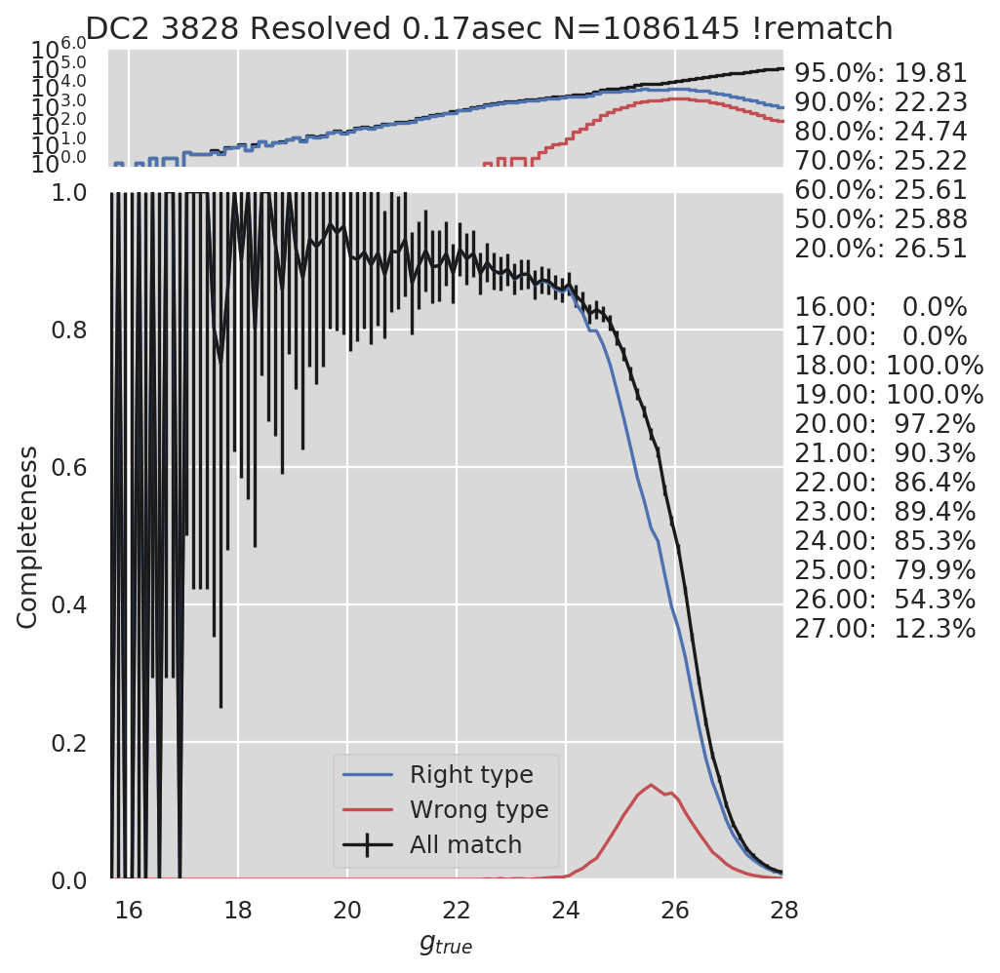

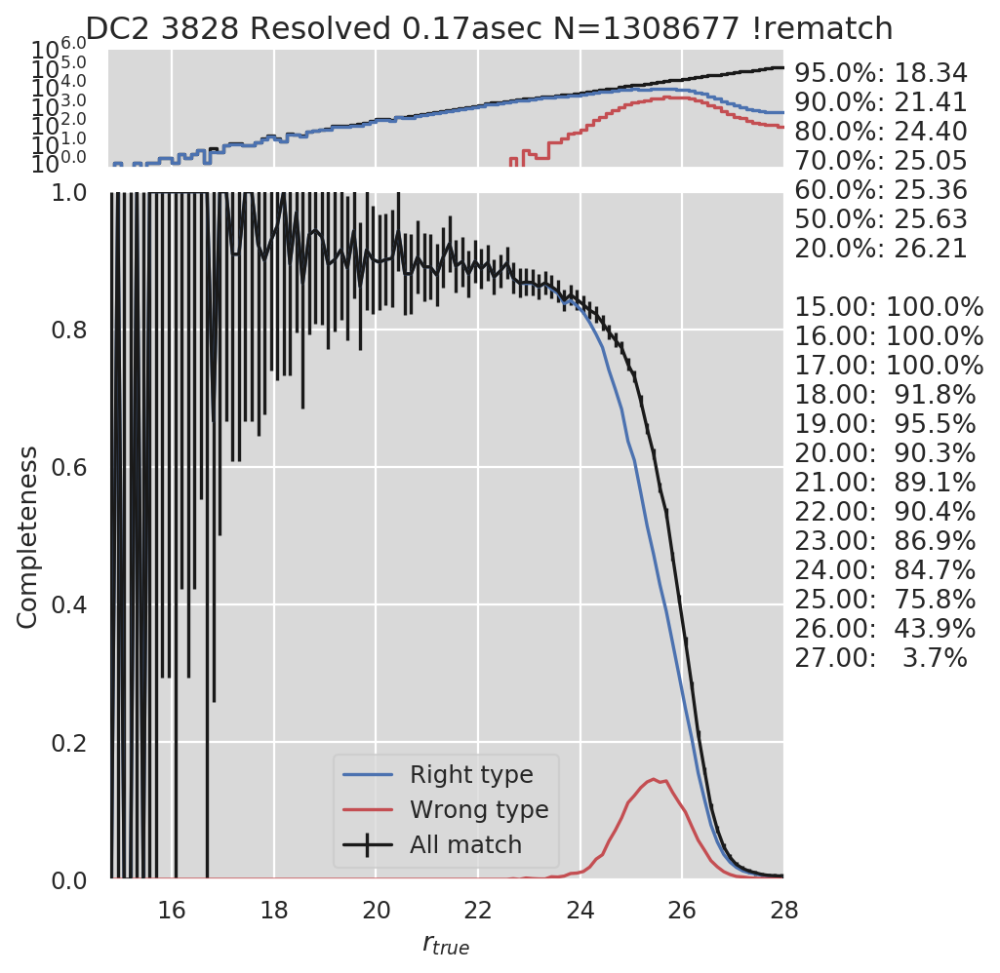

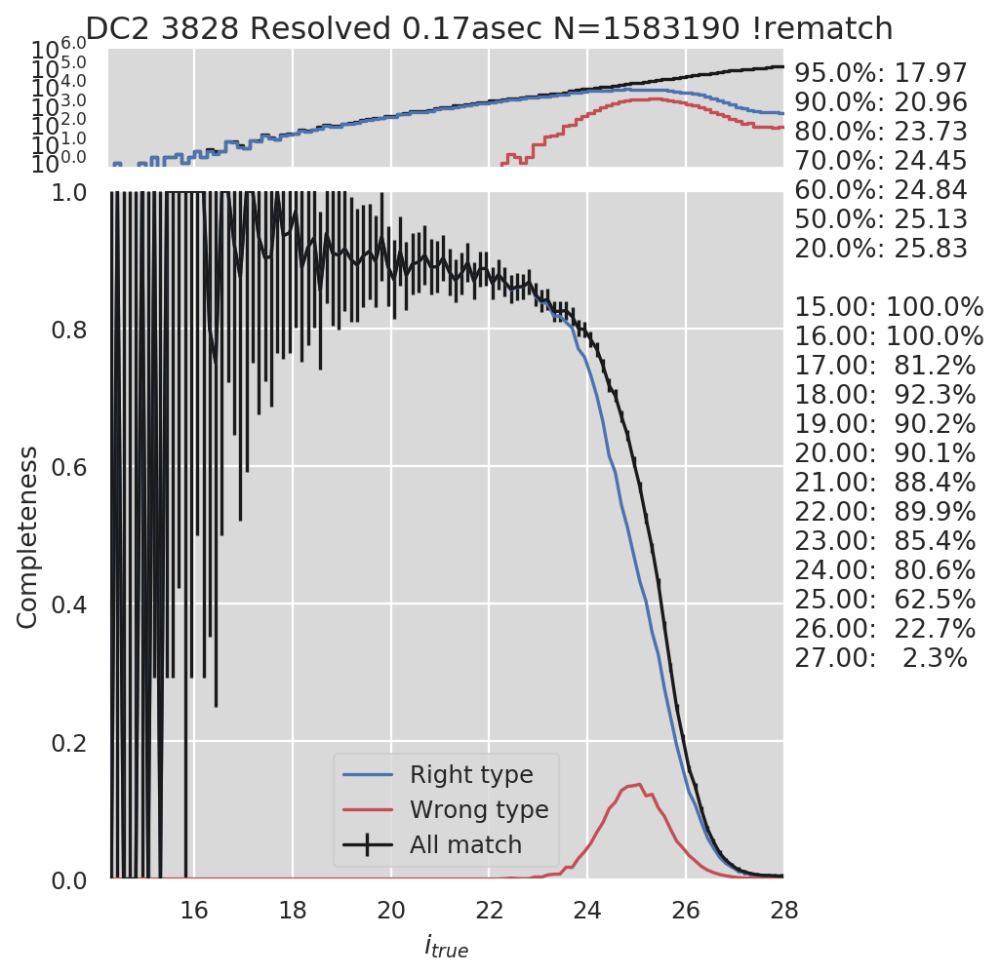

/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:161: RuntimeWarning: invalid value encountered in less


179395 matched and 248637 mag < 28; 178762 both and 67 non-finite; 250360/len(cat)=382426


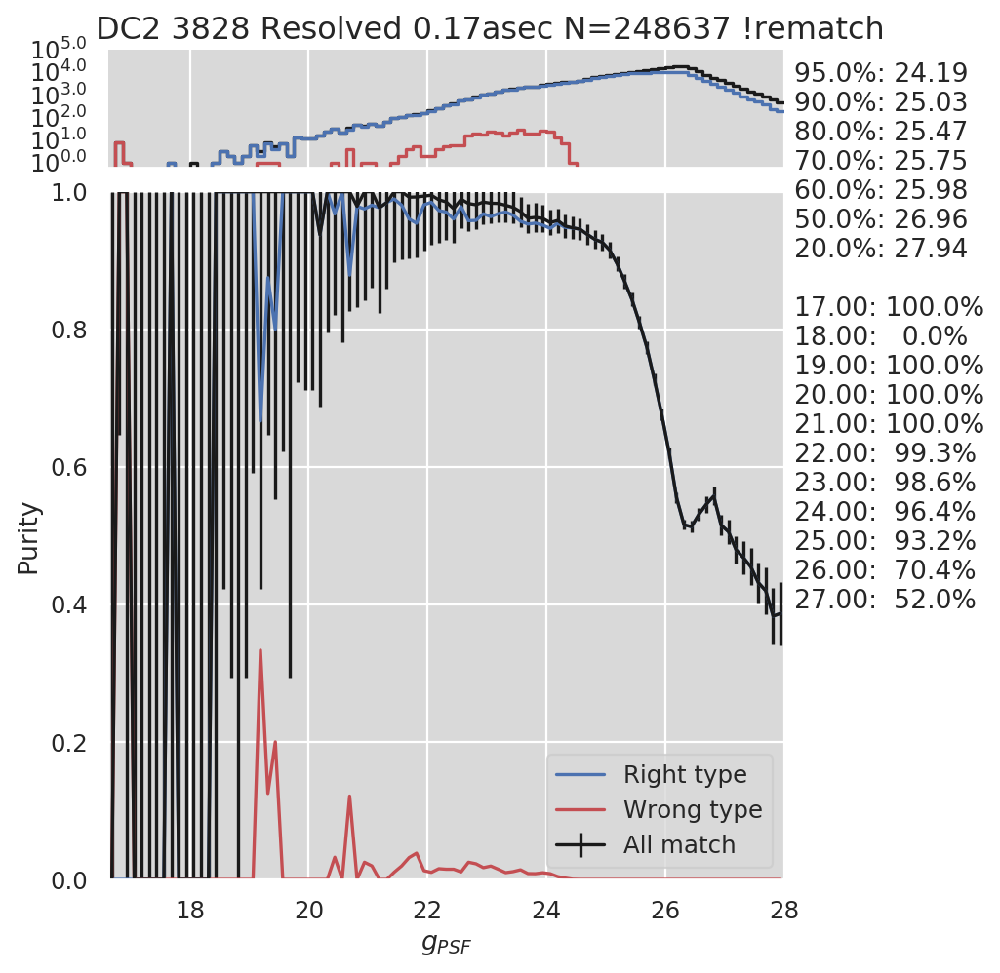

188613 matched and 268384 mag < 28; 188562 both and 69 non-finite; 269219/len(cat)=382426


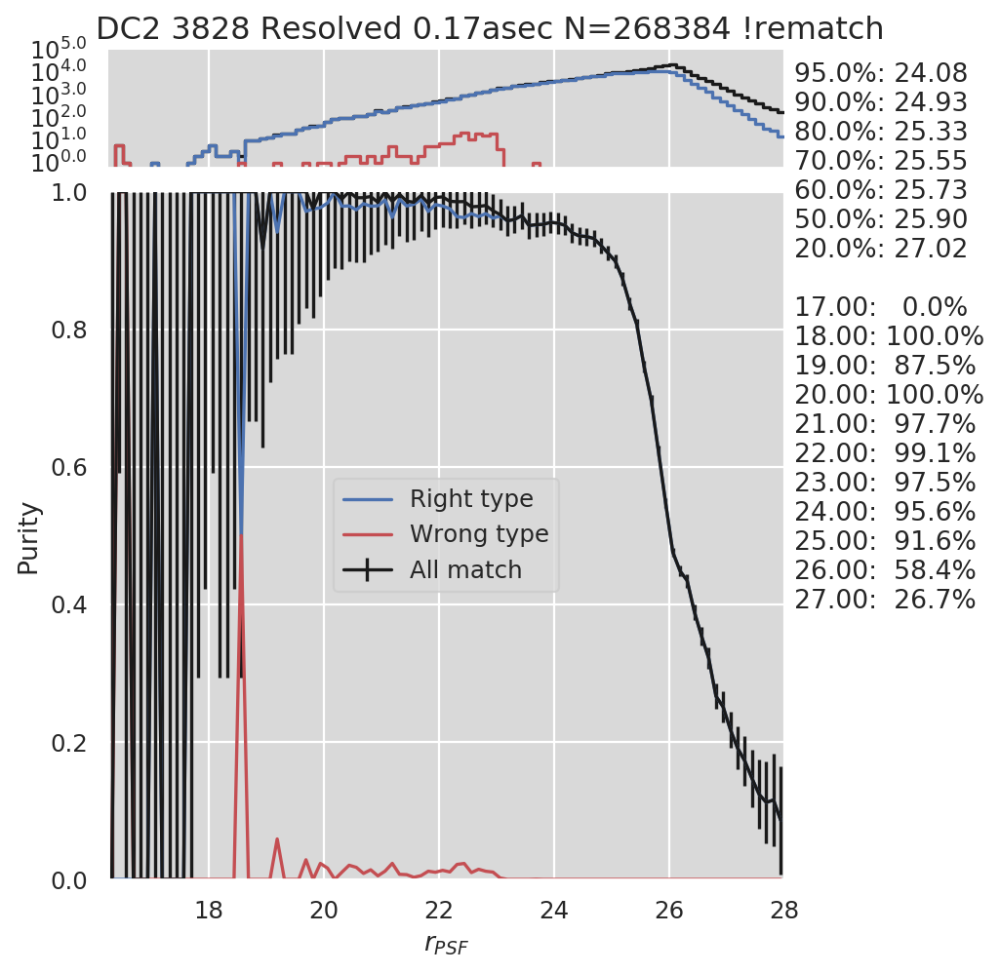

186491 matched and 261917 mag < 28; 186301 both and 87 non-finite; 262535/len(cat)=382426


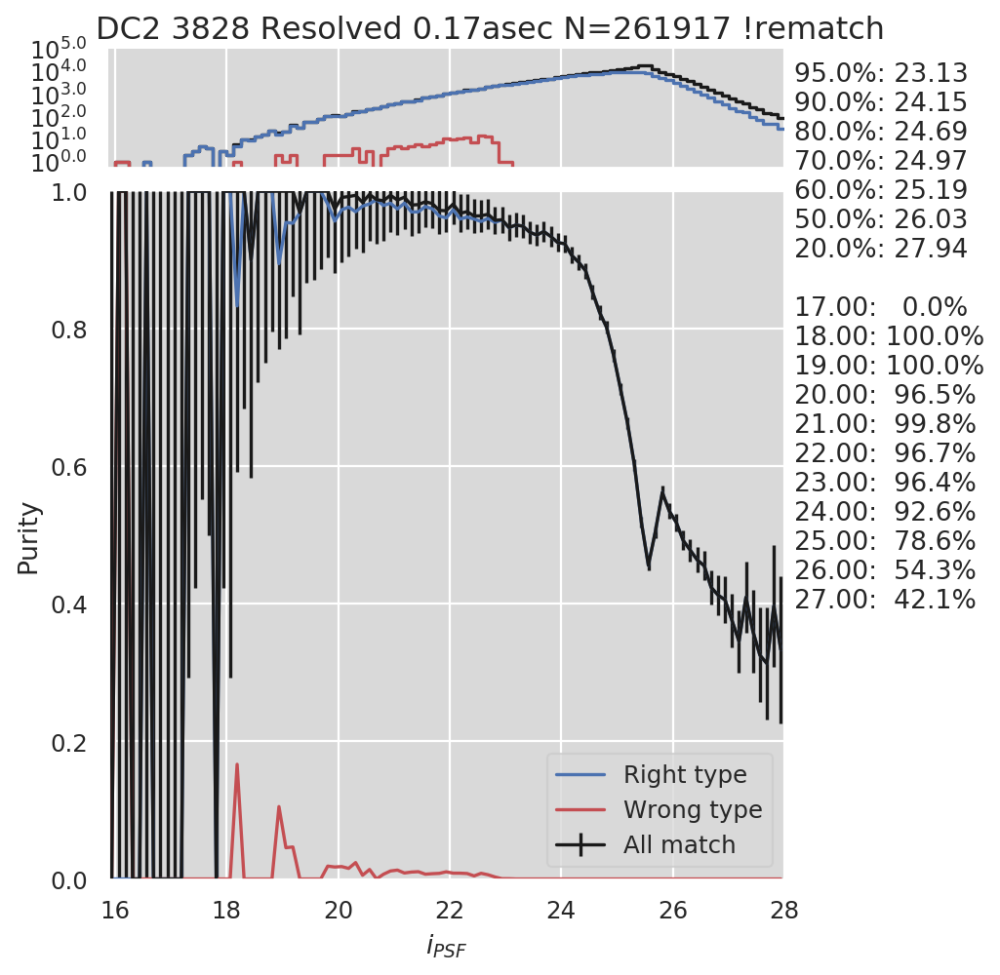

179395 matched and 249432 mag < 28; 179083 both and 13 non-finite; 250360/len(cat)=382426


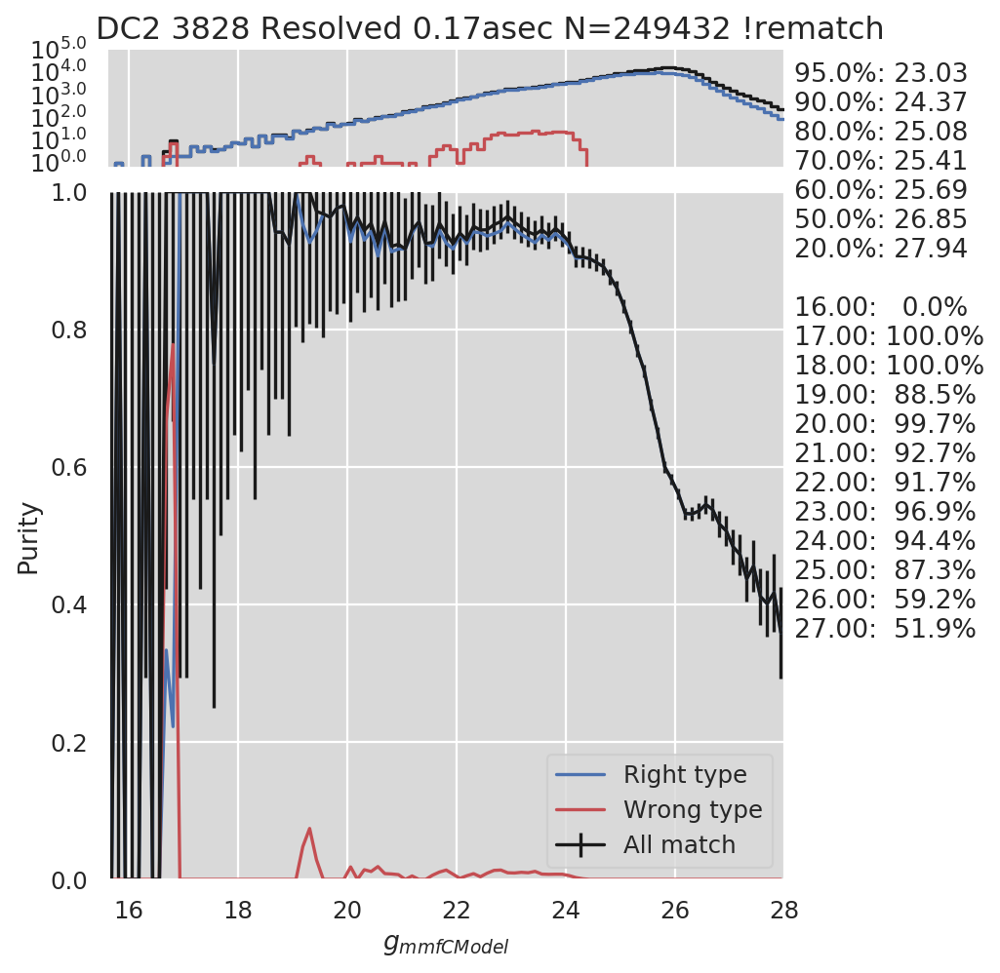

/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:172: RuntimeWarning: invalid value encountered in less
/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:176: RuntimeWarning: invalid value encountered in less


188613 matched and 268823 mag < 28; 188586 both and 9 non-finite; 269219/len(cat)=382426


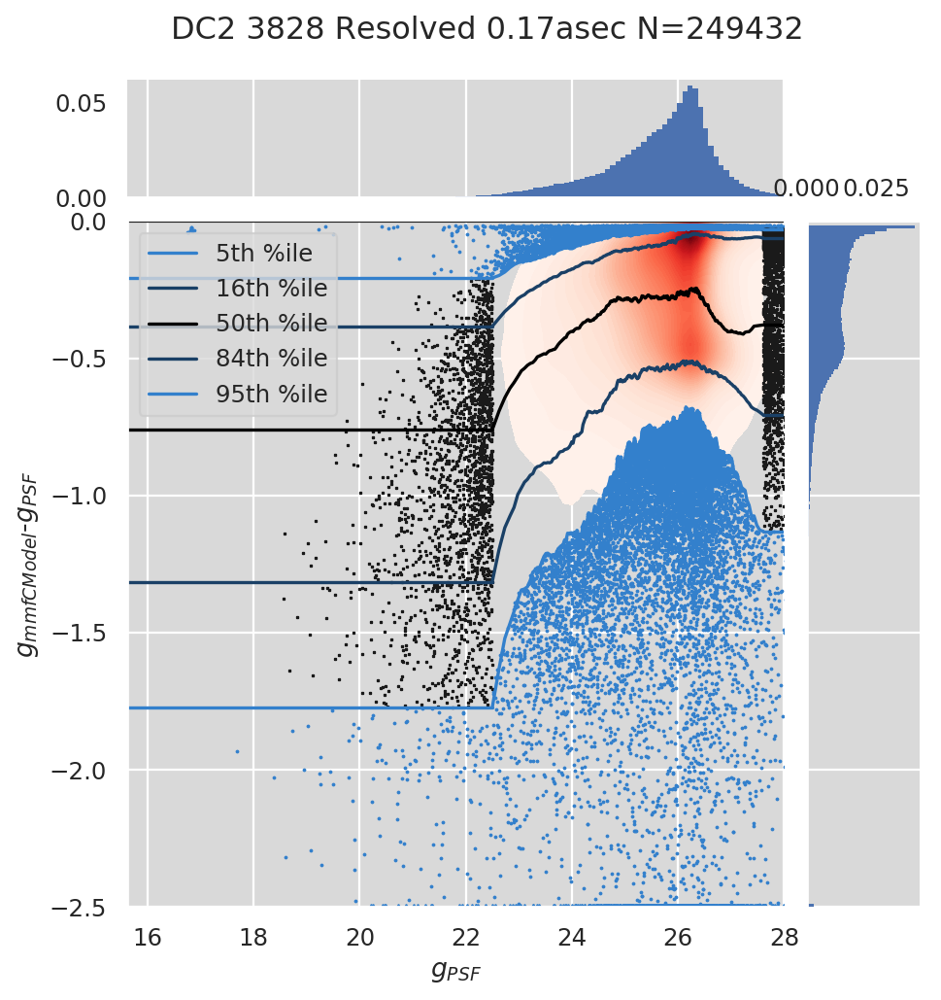

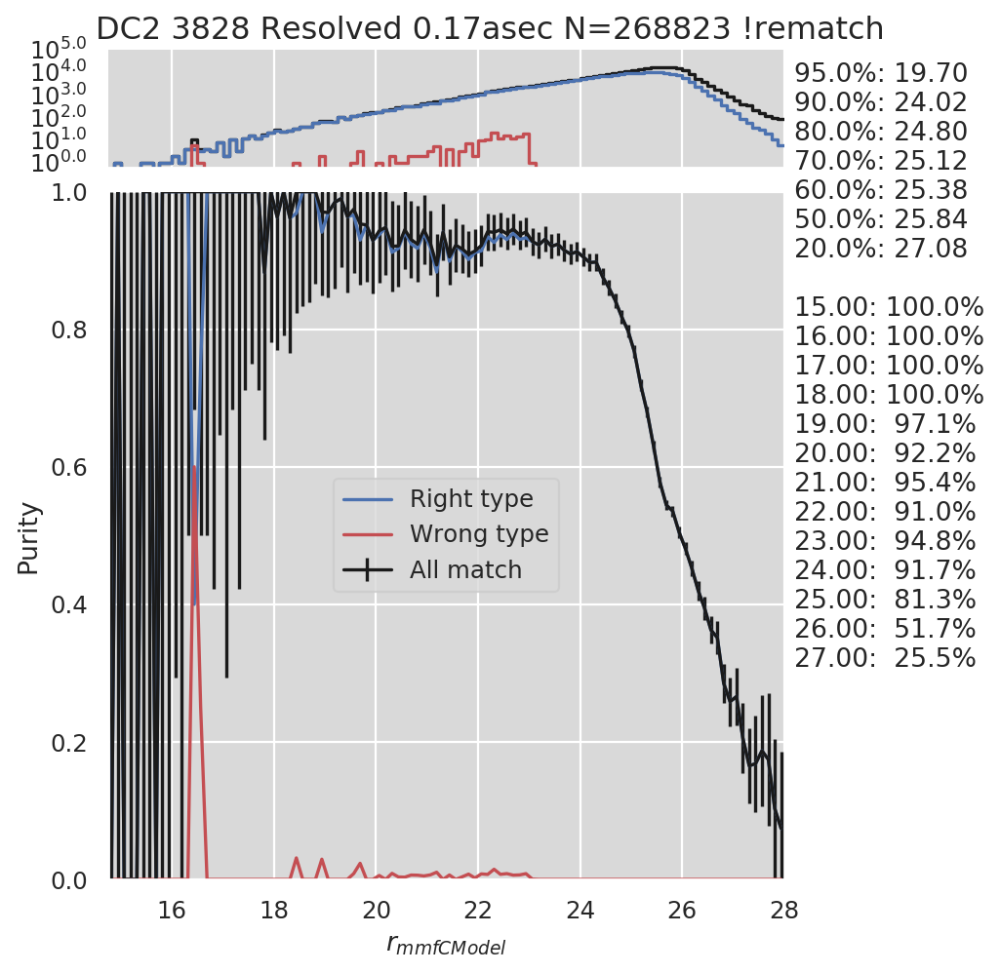

186491 matched and 262227 mag < 28; 186415 both and 12 non-finite; 262535/len(cat)=382426


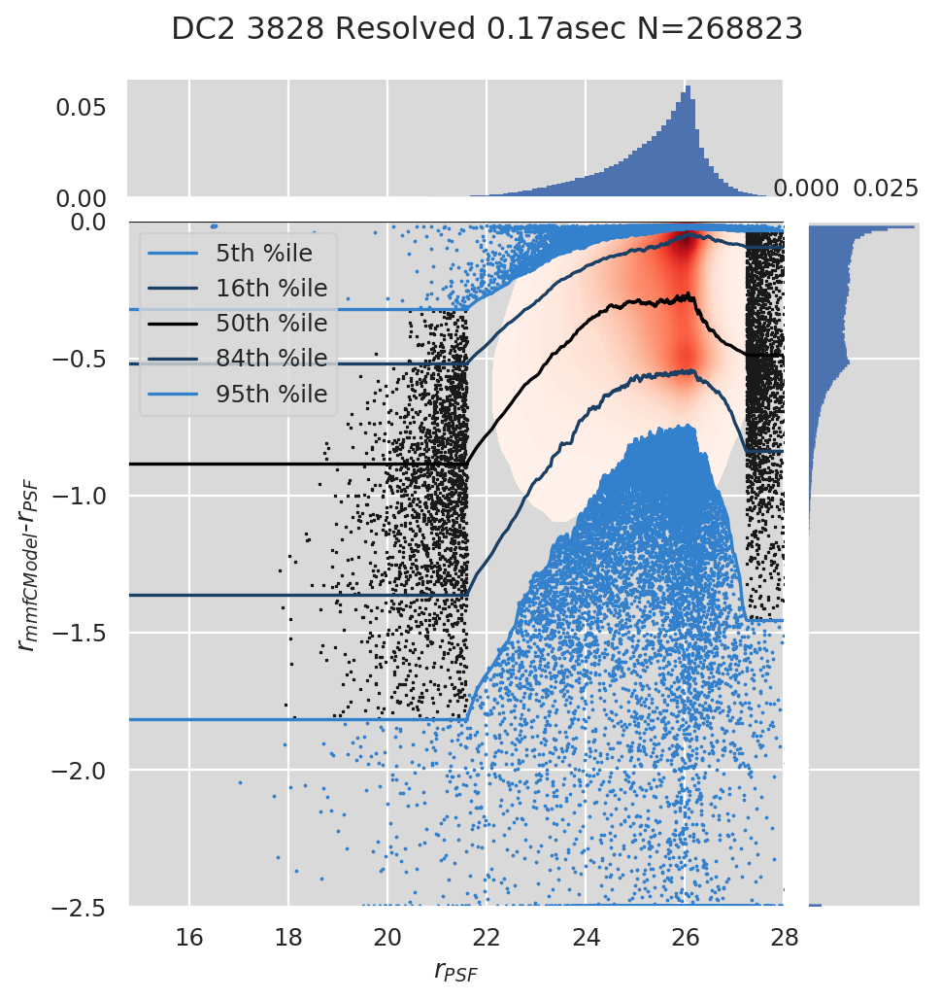

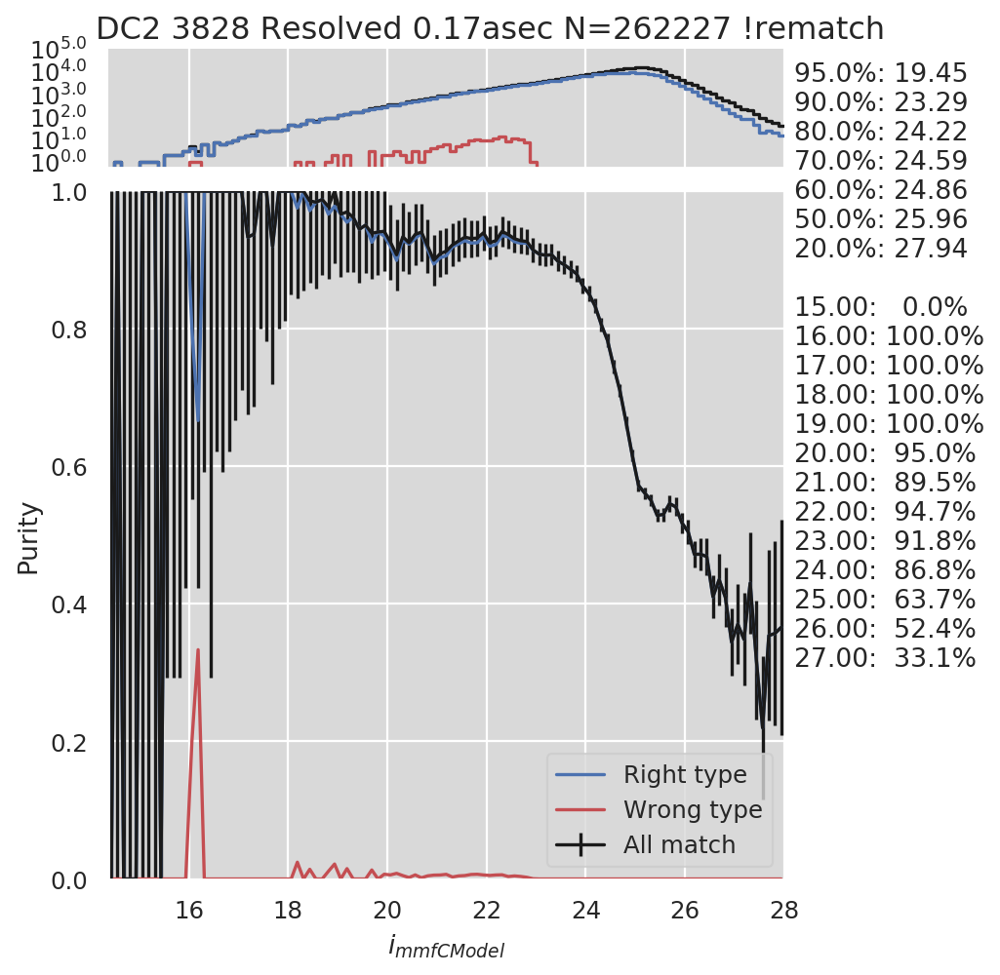

Rematched 3208/2587104; 237502 originally and 234220 rematched already matched
N=0sky object matches after rematching


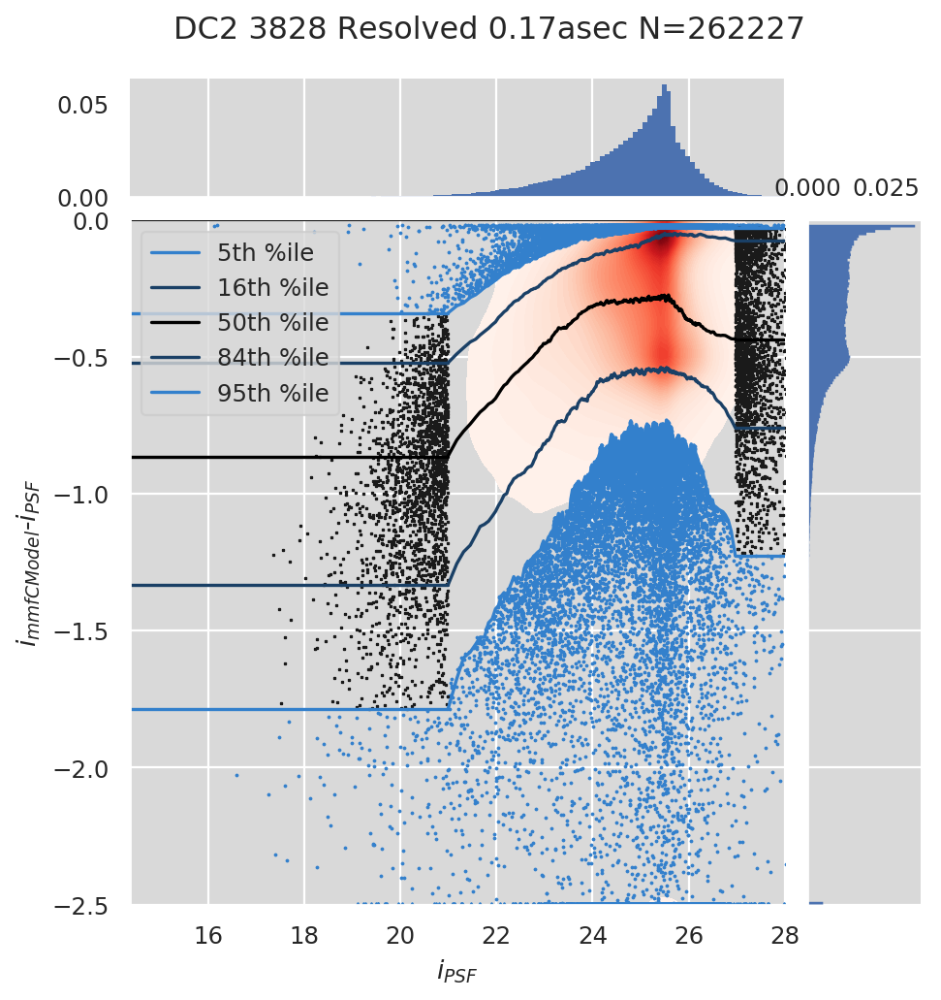

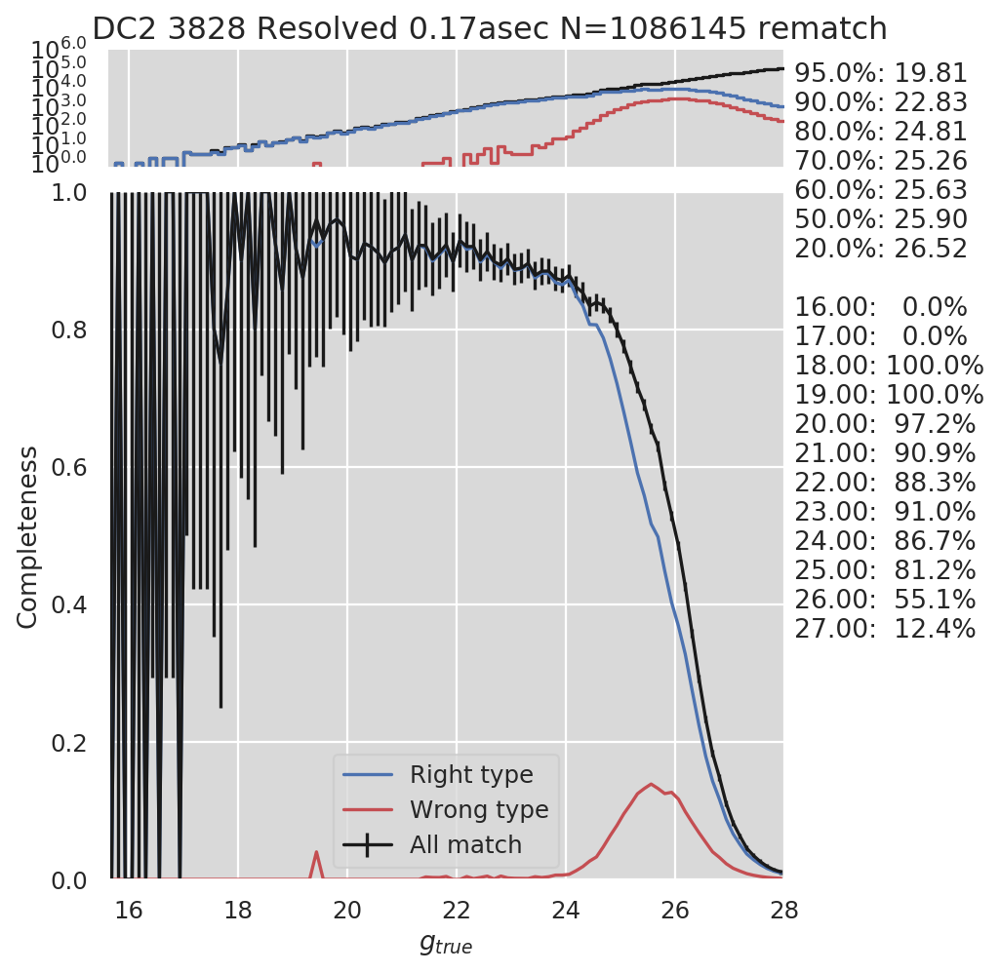

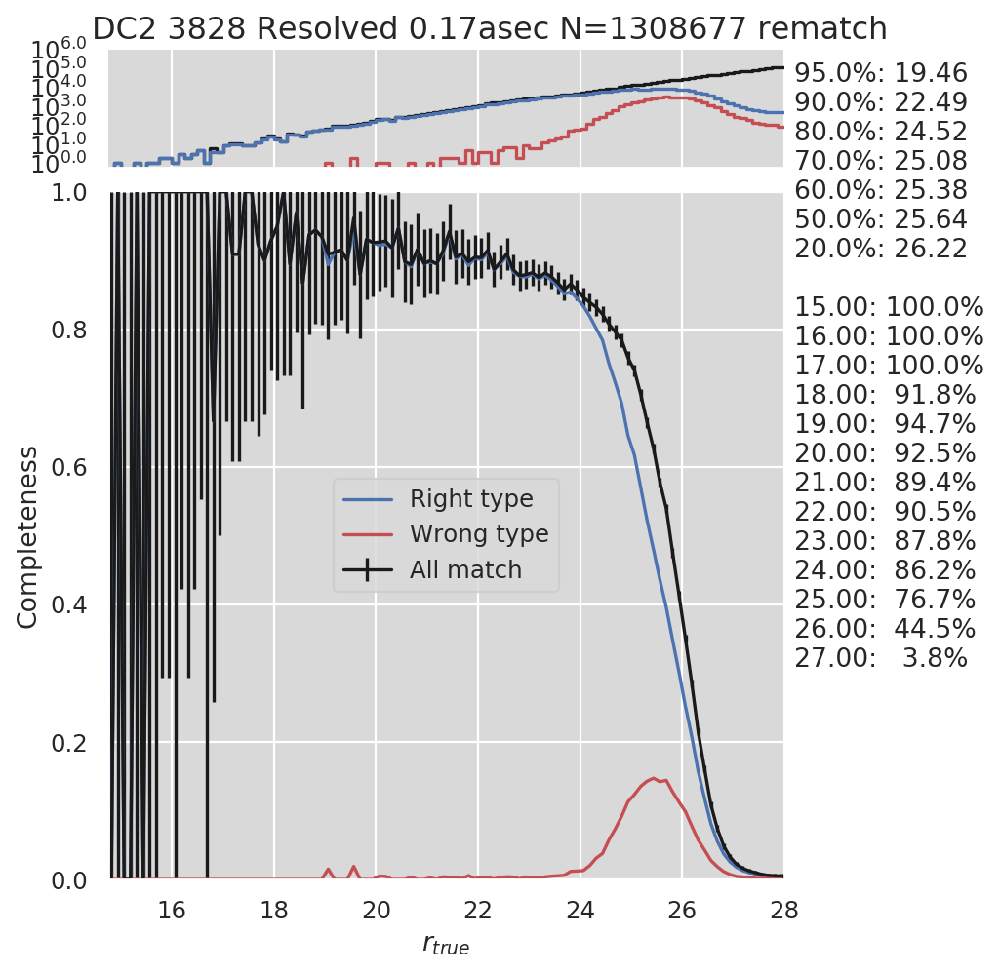

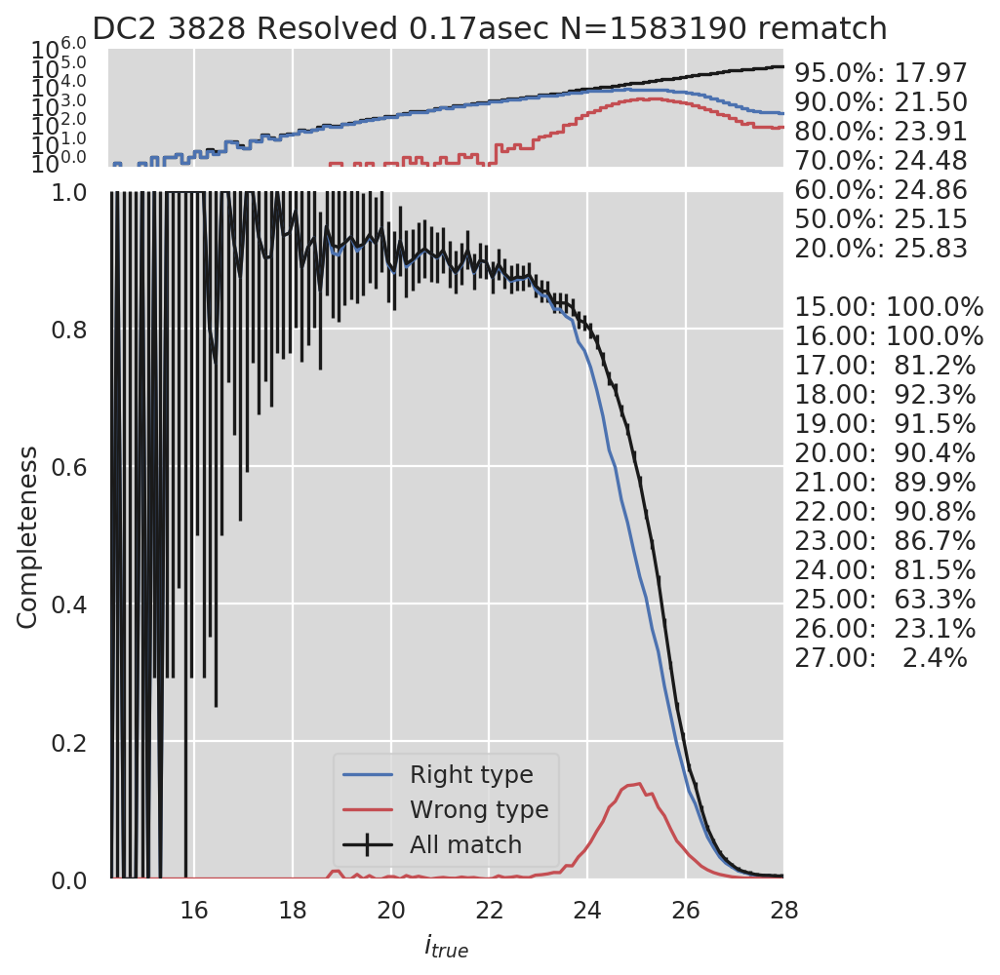

179126 matched and 248637 mag < 28; 178494 both and 67 non-finite; 250360/len(cat)=382426


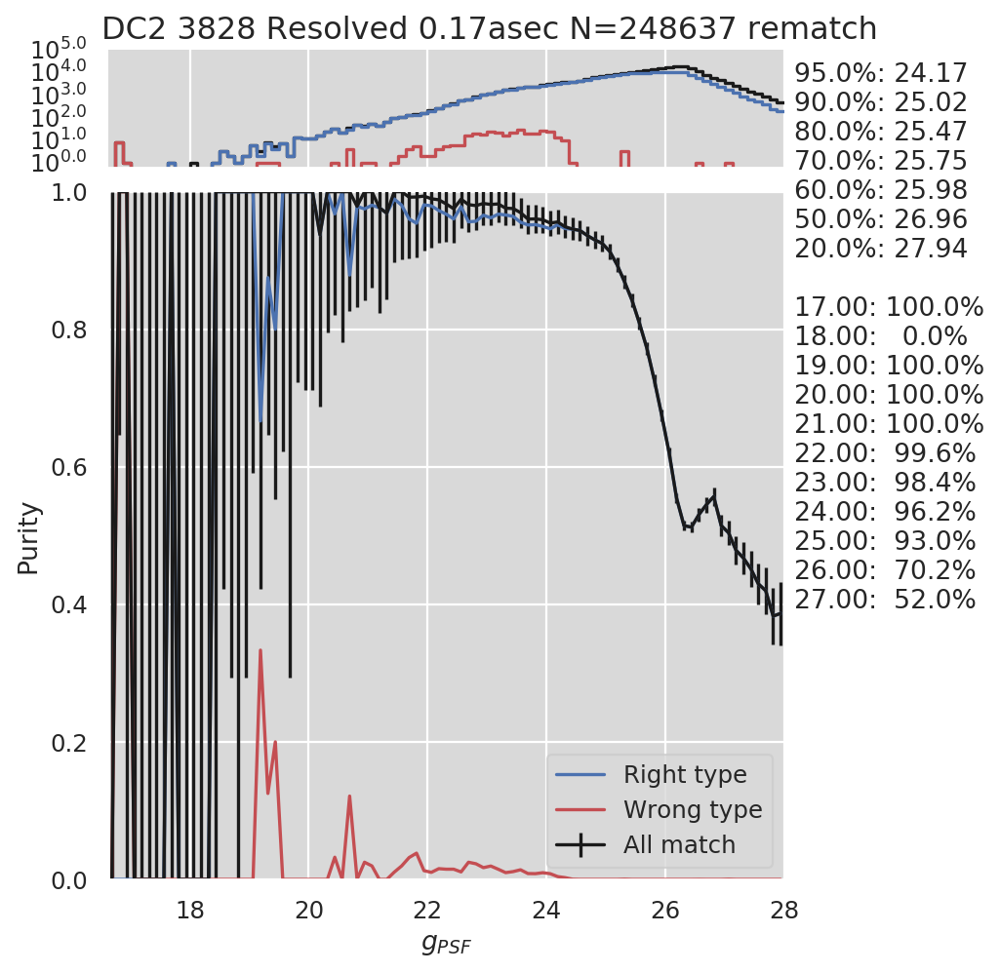

188320 matched and 268384 mag < 28; 188269 both and 69 non-finite; 269219/len(cat)=382426


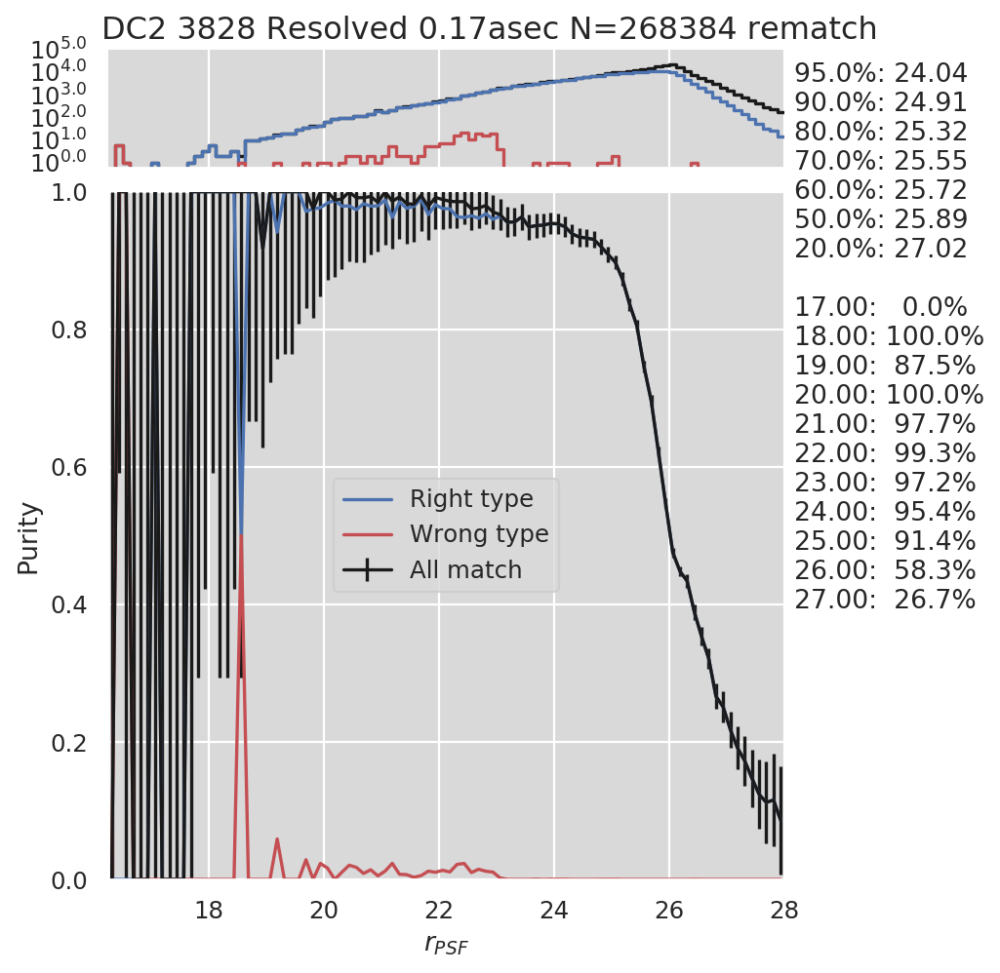

186191 matched and 261917 mag < 28; 186001 both and 87 non-finite; 262535/len(cat)=382426


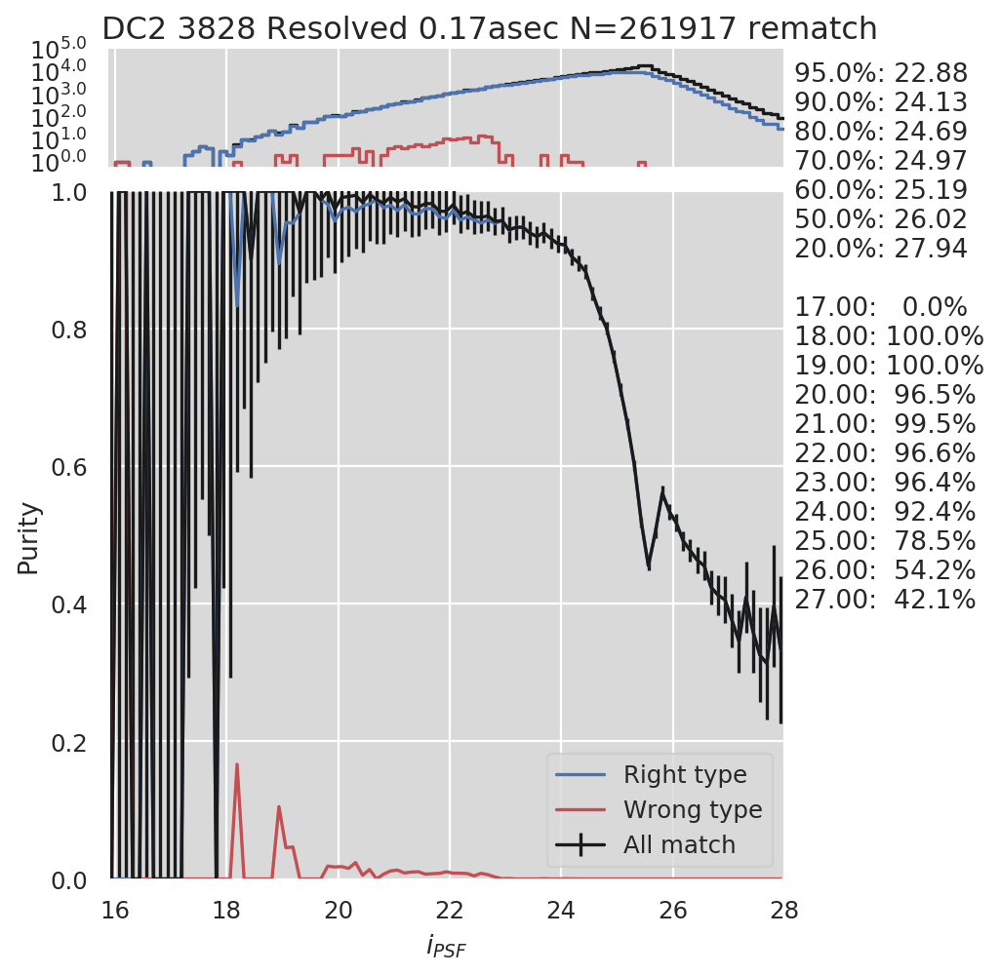

179126 matched and 249432 mag < 28; 178815 both and 13 non-finite; 250360/len(cat)=382426


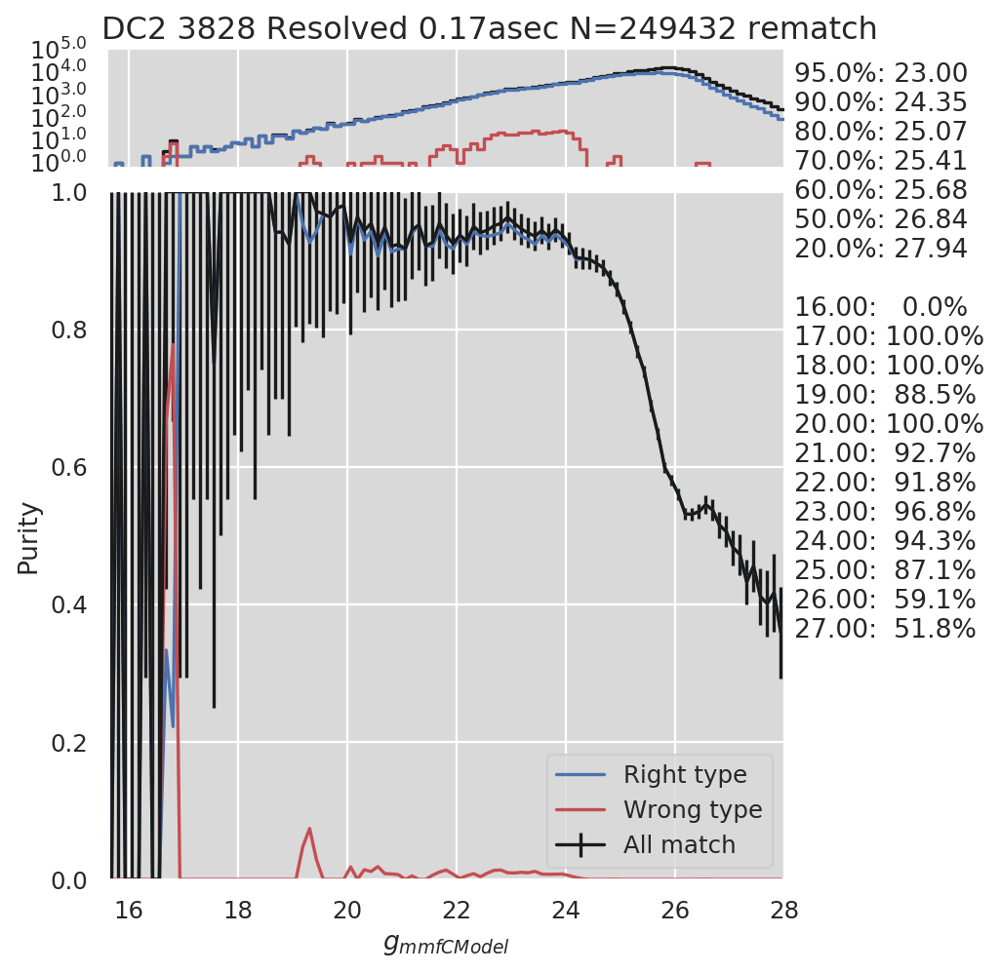

188320 matched and 268823 mag < 28; 188293 both and 9 non-finite; 269219/len(cat)=382426


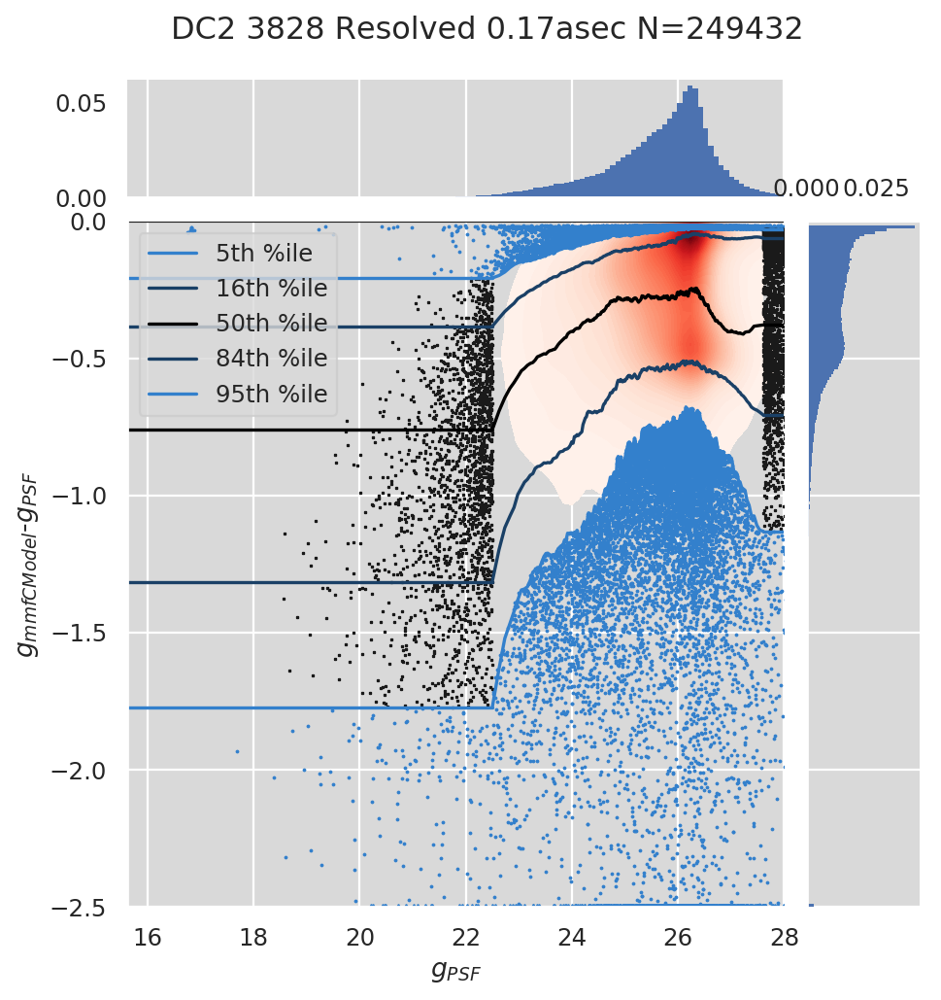

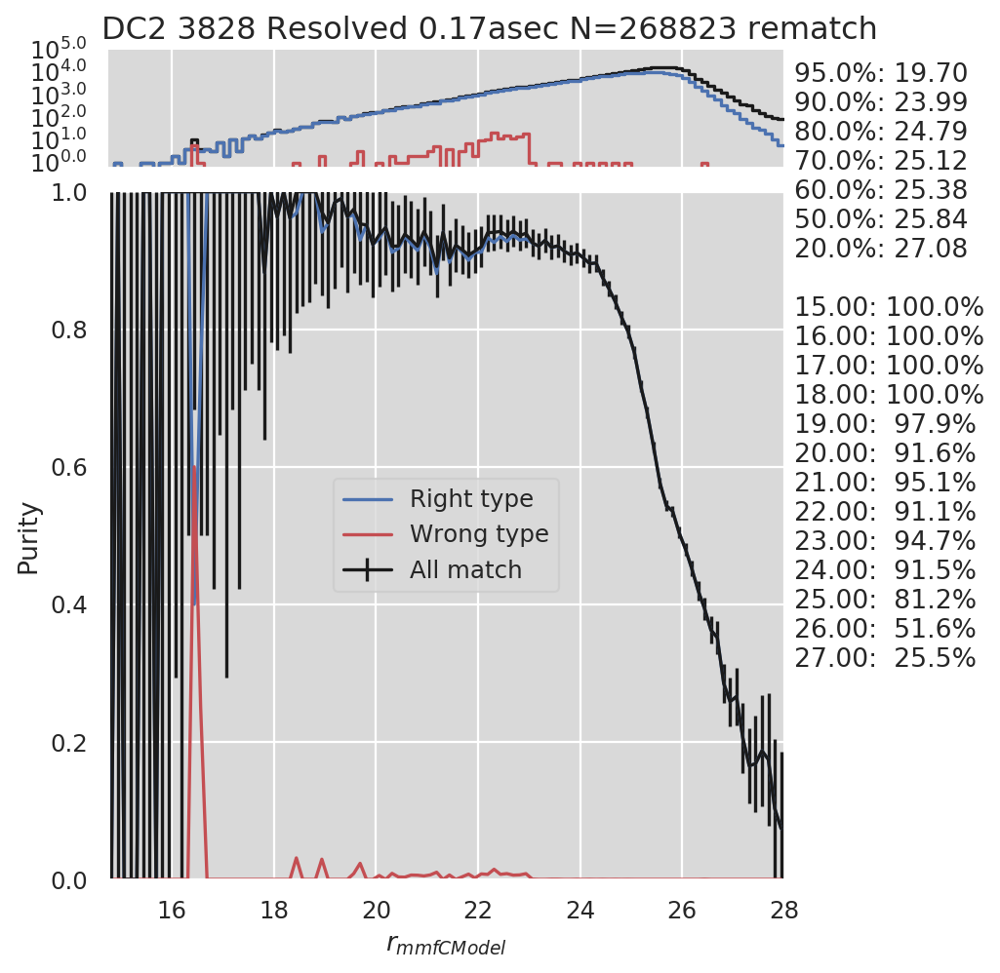

186191 matched and 262227 mag < 28; 186115 both and 12 non-finite; 262535/len(cat)=382426


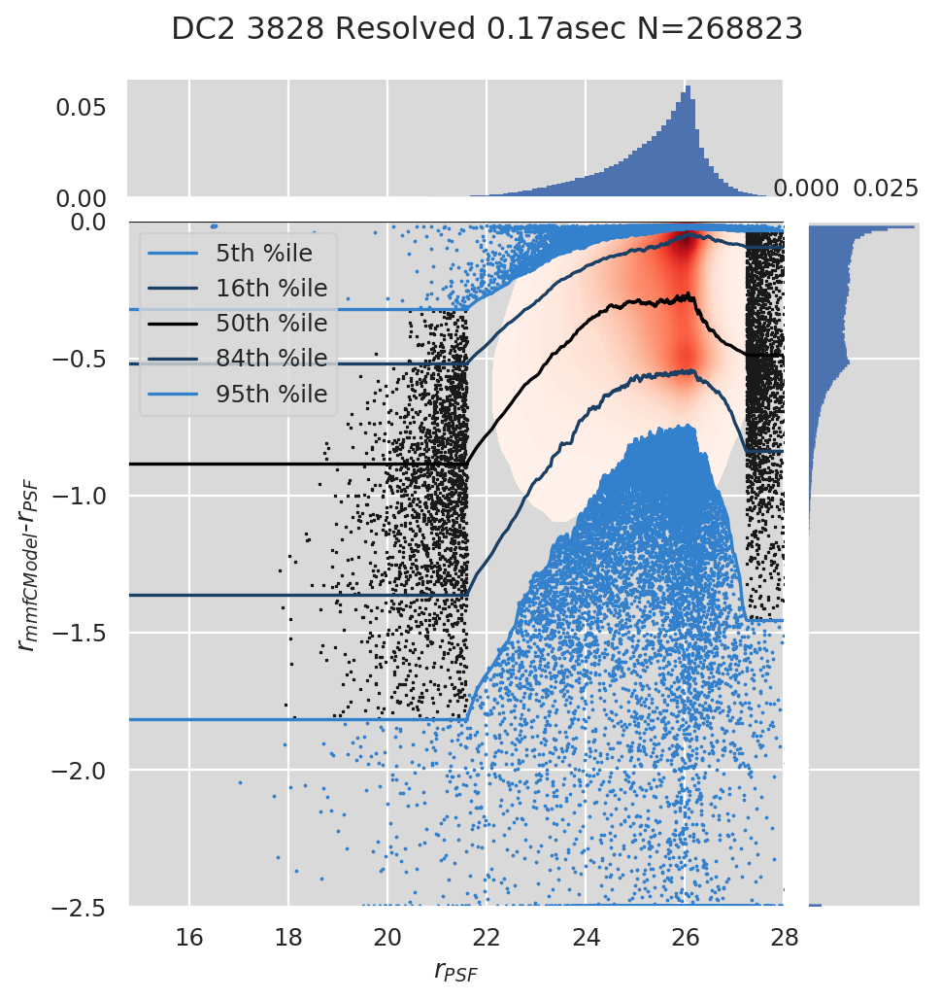

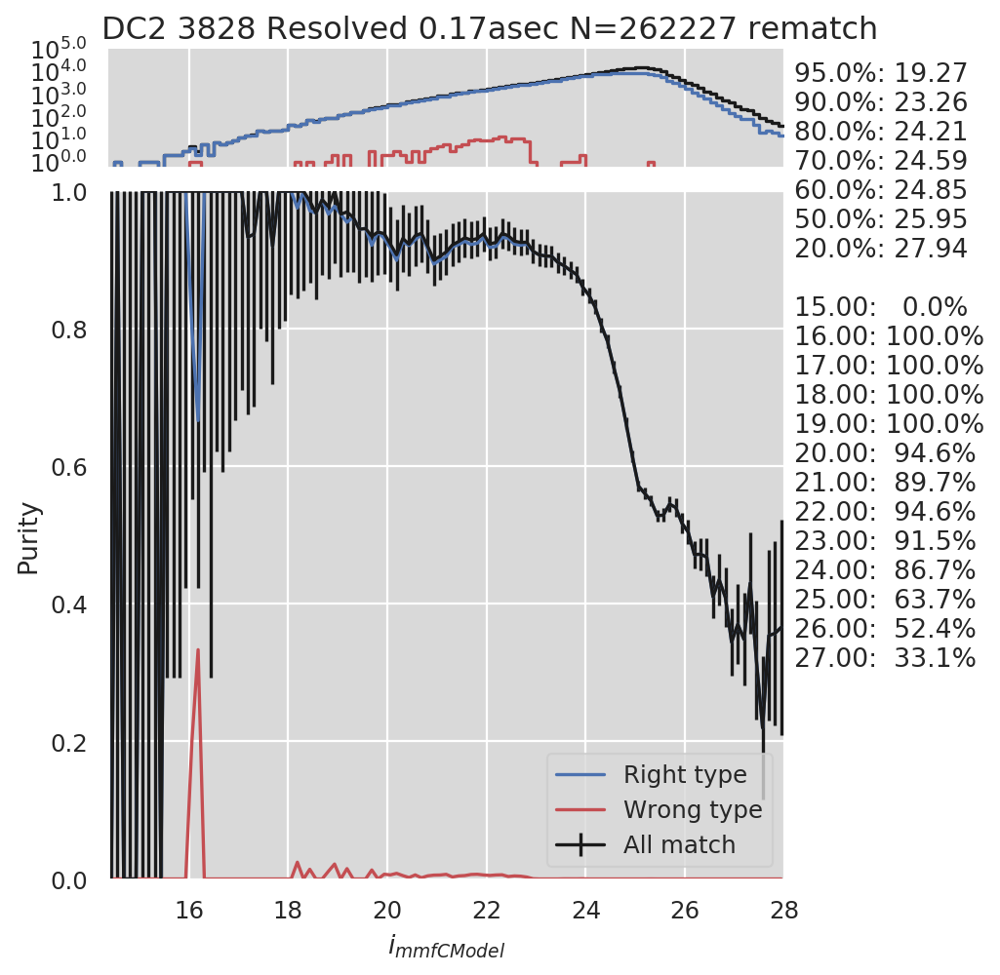

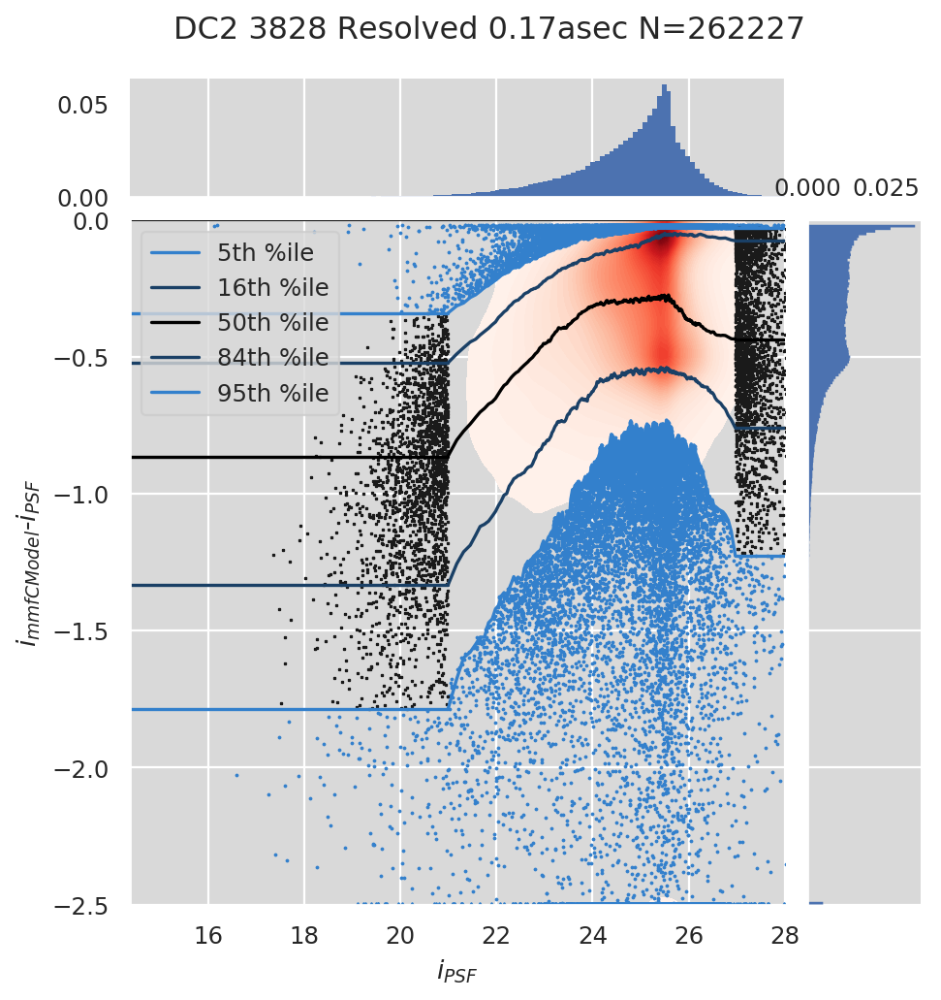

In [9]:
# Galaxies
plot_matches(
    cats, True, models, filters_single, band_ref=band_ref, band_ref_multi=band_ref,
    band_multi=filters_multi[0], mag_max=28, mag_max_compure=28, limy=lim_y['resolved'],
    match_dist_asec=0.168, rematch=True, models_purity=models_purity, mag_bin_complete=0.125,
    plot_diffs=False, compare_mags_psf_lim=(-2.5, 0), **args
)

### Galaxies, 3 pixel match radius
These plots are as above but with a larger match radius to compensate for galaxy astrometry being harder than for stars.
- As expected, completeness is better with a larger match radius - in r-band, the 80% completeness limit is a mag fainter.
- Unfortunately, many of these extra matches are to objects that aren't obviously galaxies (nan or no extendedness).
- Consequently, completeness for matches of the right type is not significantly improved.
- By contrast, purity is significantly improved and remains above 97% for r<25 and 95% for r<26.

I'm not sure what these last two points combined say about detection efficiency. It does suggest that either our crossmatching needs to improve, or the galaxy astrometry is poor (in which case the photometry can't be great for faint galaxies either, but we already knew that).

It's also not clear how this picture would change if with a deeper star truth table, although galaxies far outnumber stars fainter than r=23 so possibly not much.

N=0 sky object matches


/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:114: RuntimeWarning: invalid value encountered in less


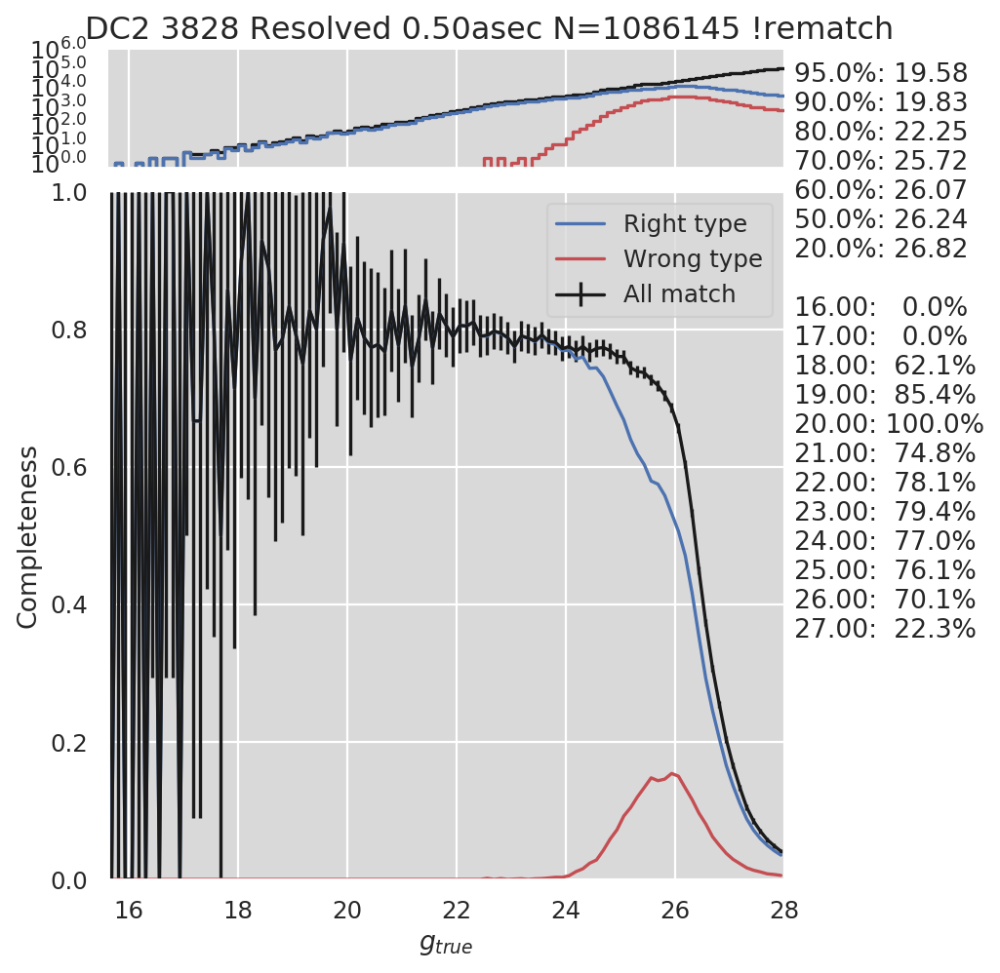

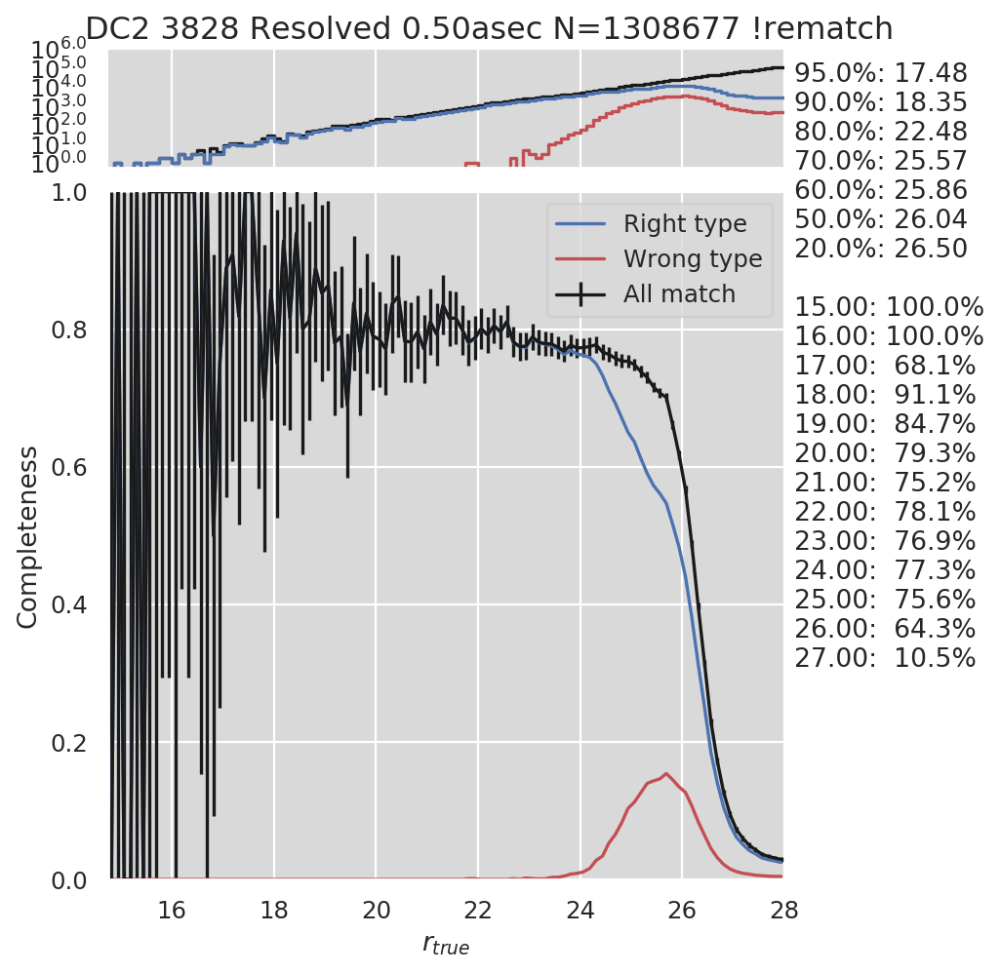

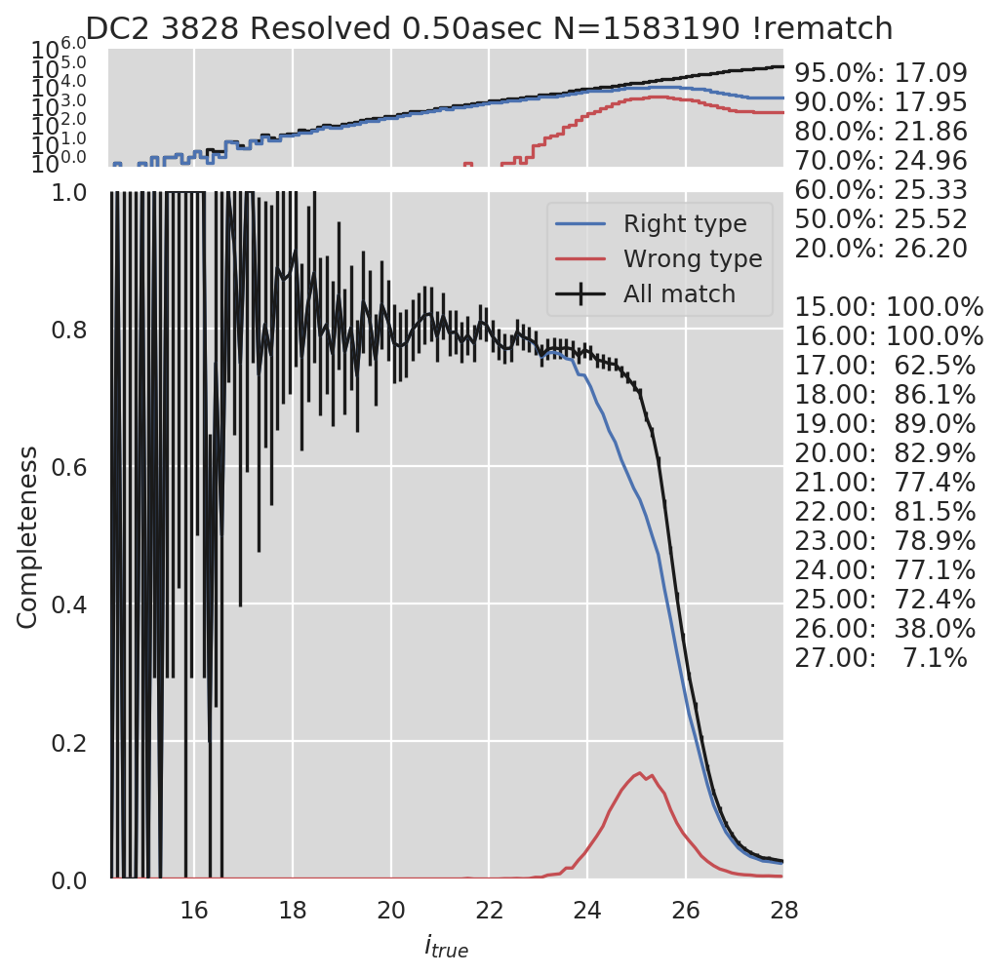

/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:161: RuntimeWarning: invalid value encountered in less


240388 matched and 248637 mag < 28; 239117 both and 67 non-finite; 250360/len(cat)=382426


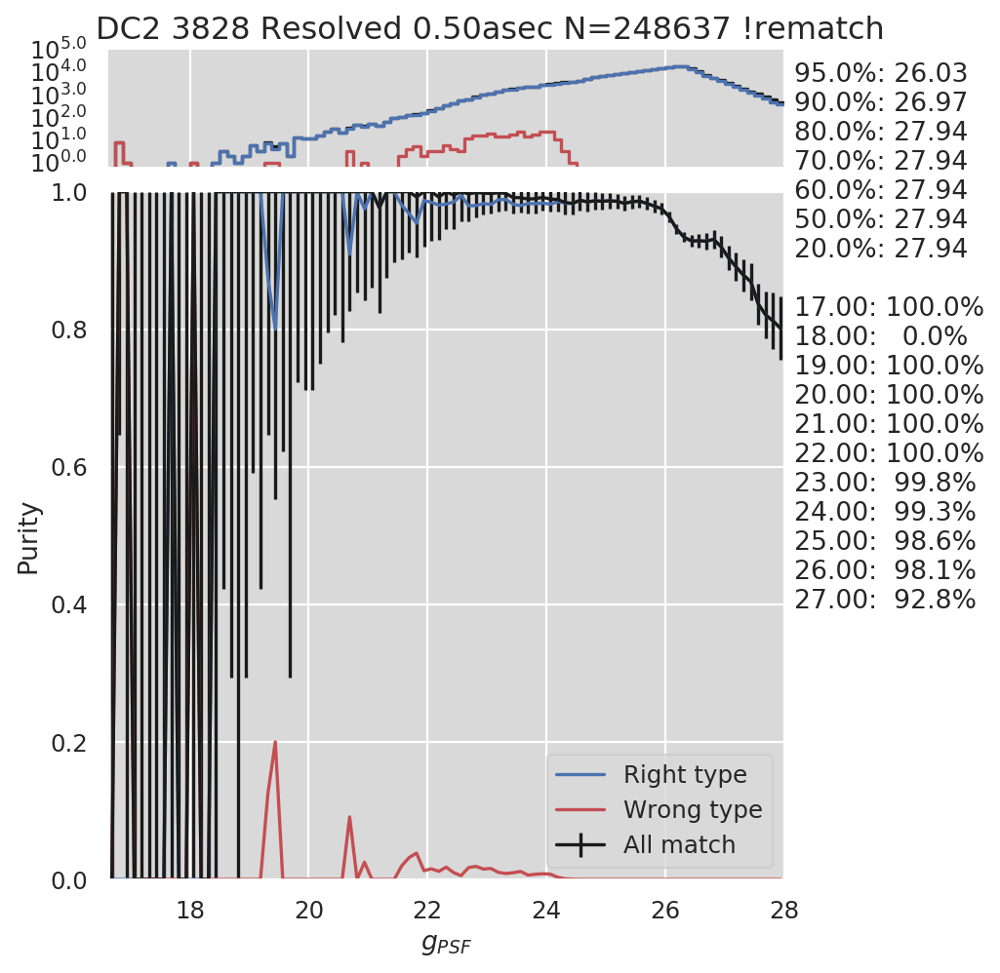

257530 matched and 268384 mag < 28; 257238 both and 69 non-finite; 269219/len(cat)=382426


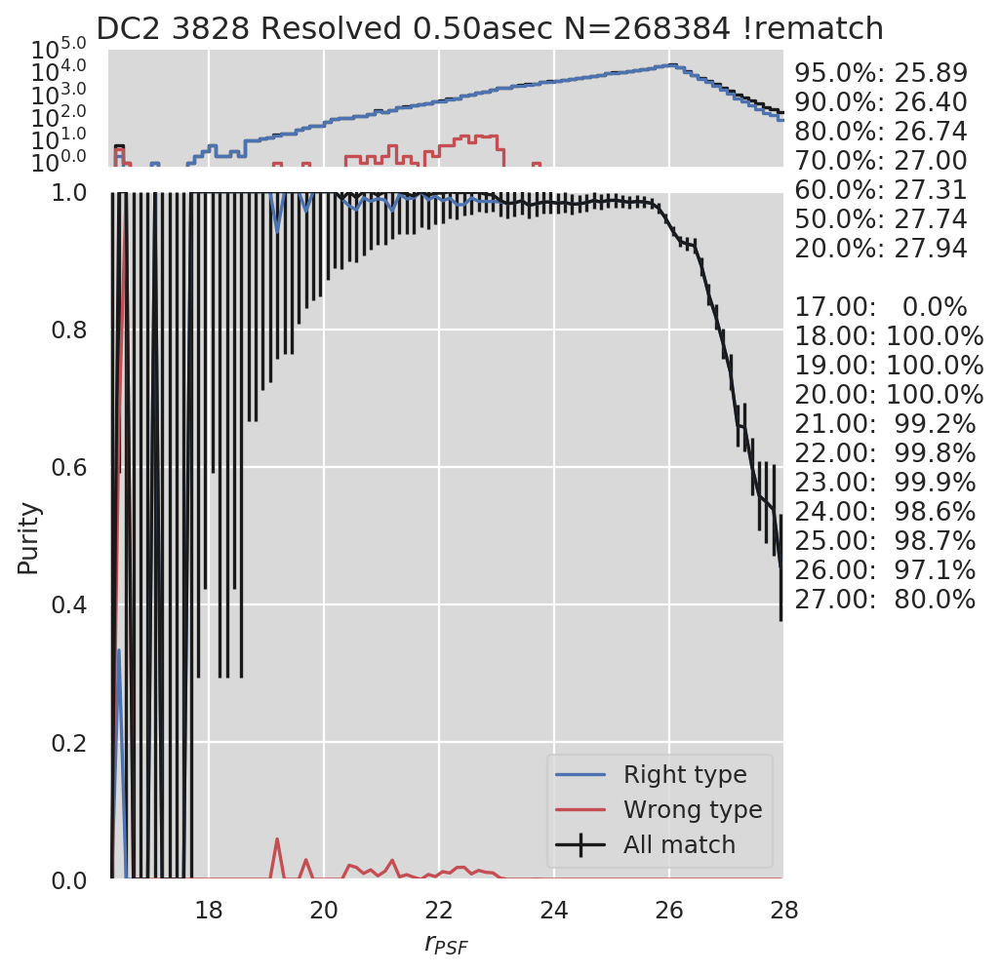

250670 matched and 261917 mag < 28; 250202 both and 87 non-finite; 262535/len(cat)=382426


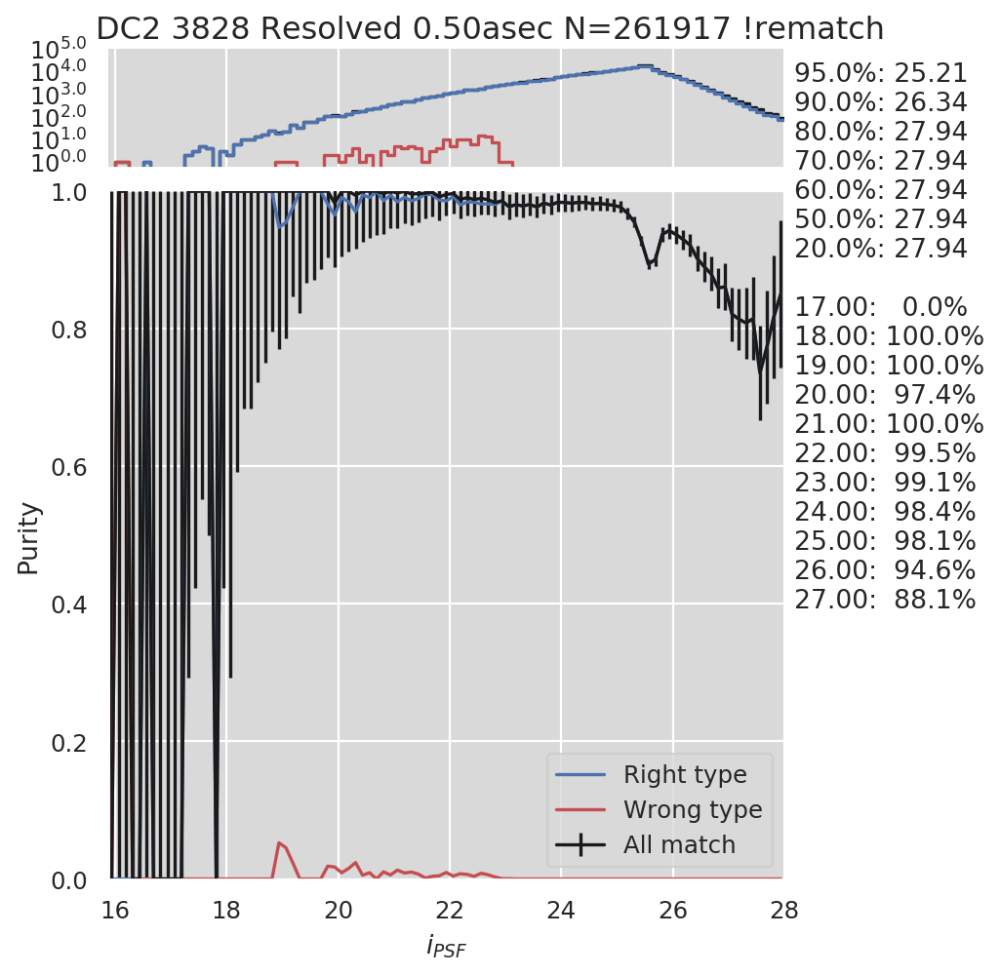

240388 matched and 249432 mag < 28; 239739 both and 13 non-finite; 250360/len(cat)=382426


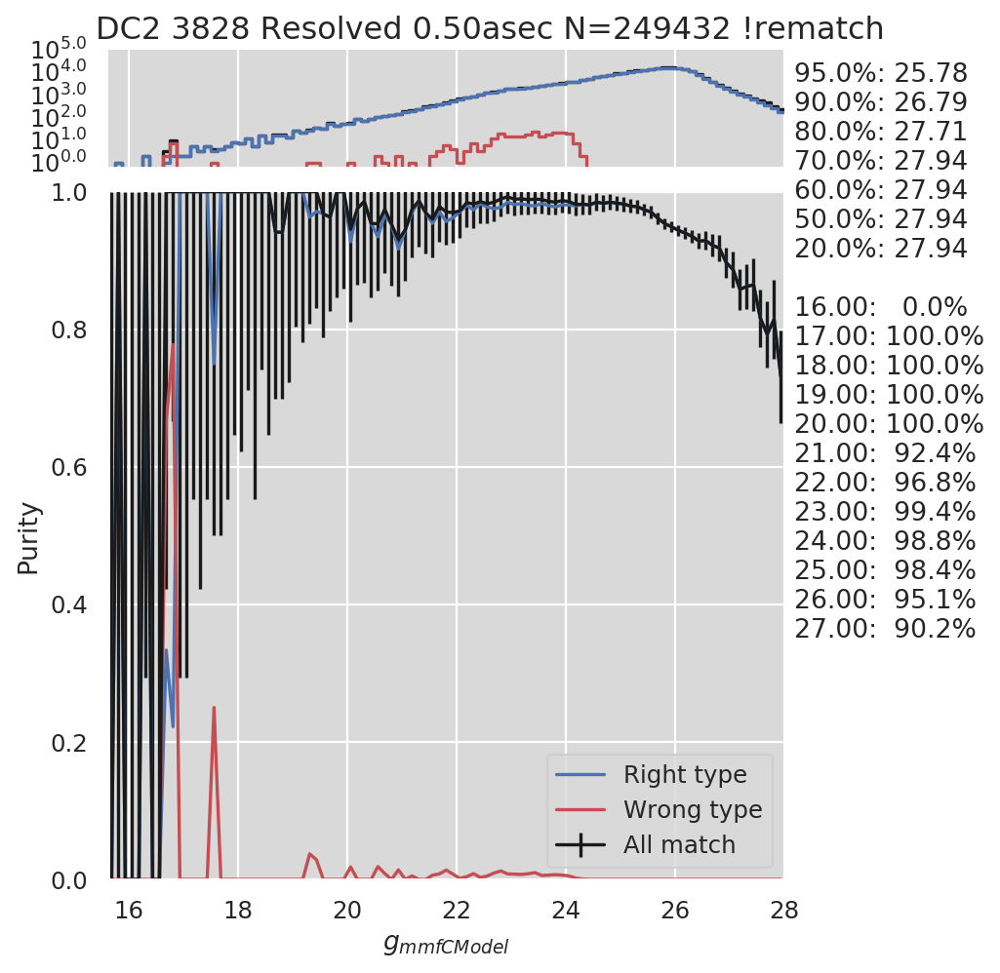

/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:172: RuntimeWarning: invalid value encountered in less
/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:176: RuntimeWarning: invalid value encountered in less


257530 matched and 268823 mag < 28; 257377 both and 9 non-finite; 269219/len(cat)=382426


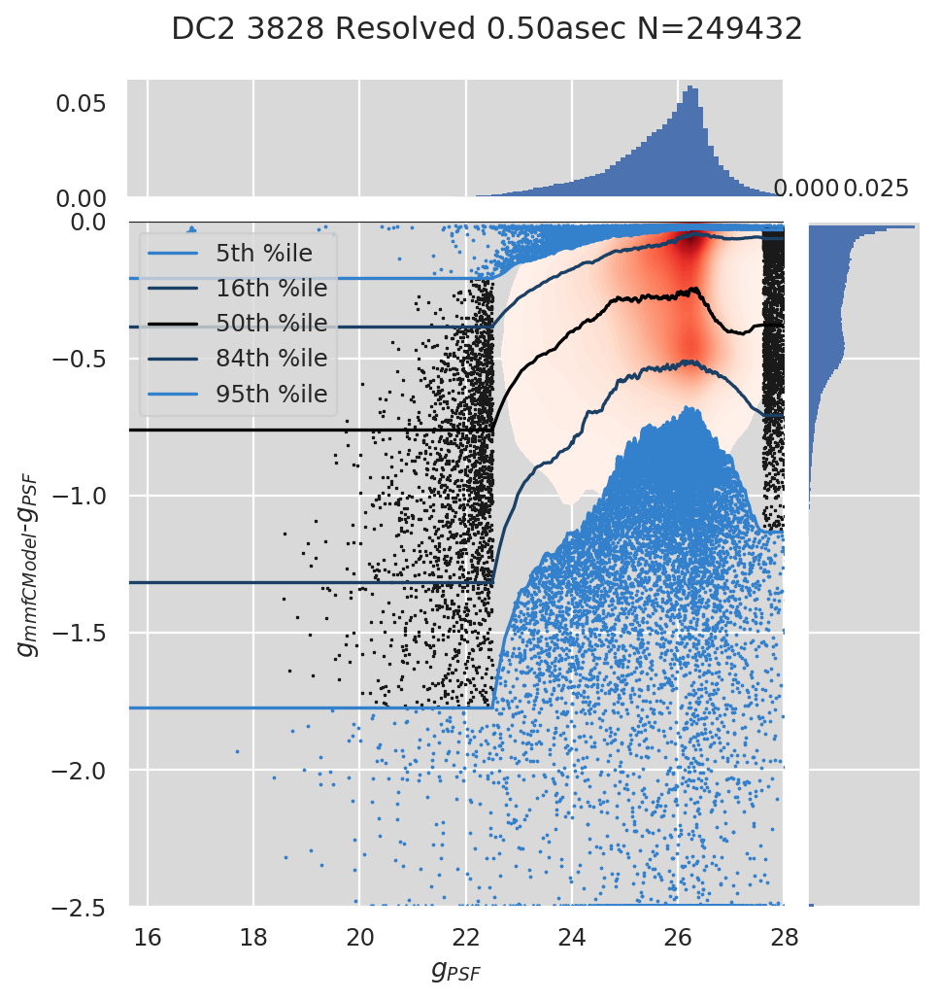

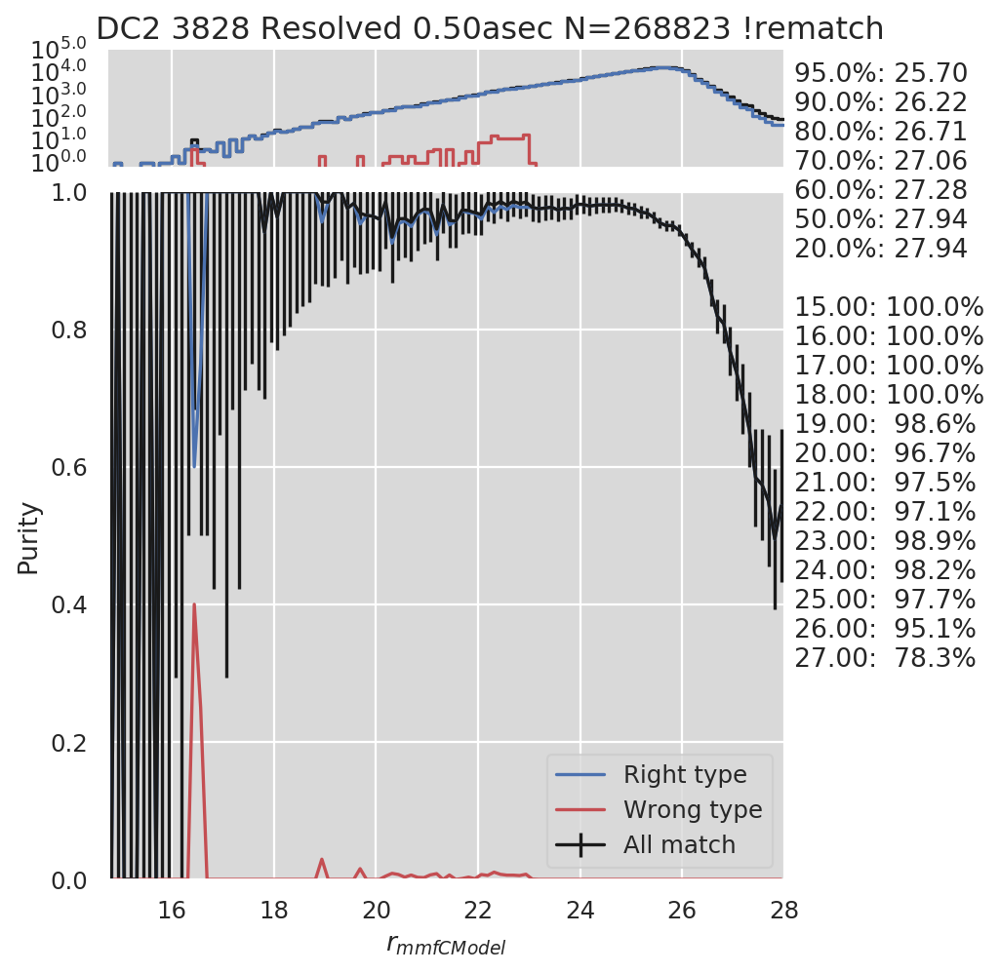

250670 matched and 262227 mag < 28; 250455 both and 12 non-finite; 262535/len(cat)=382426


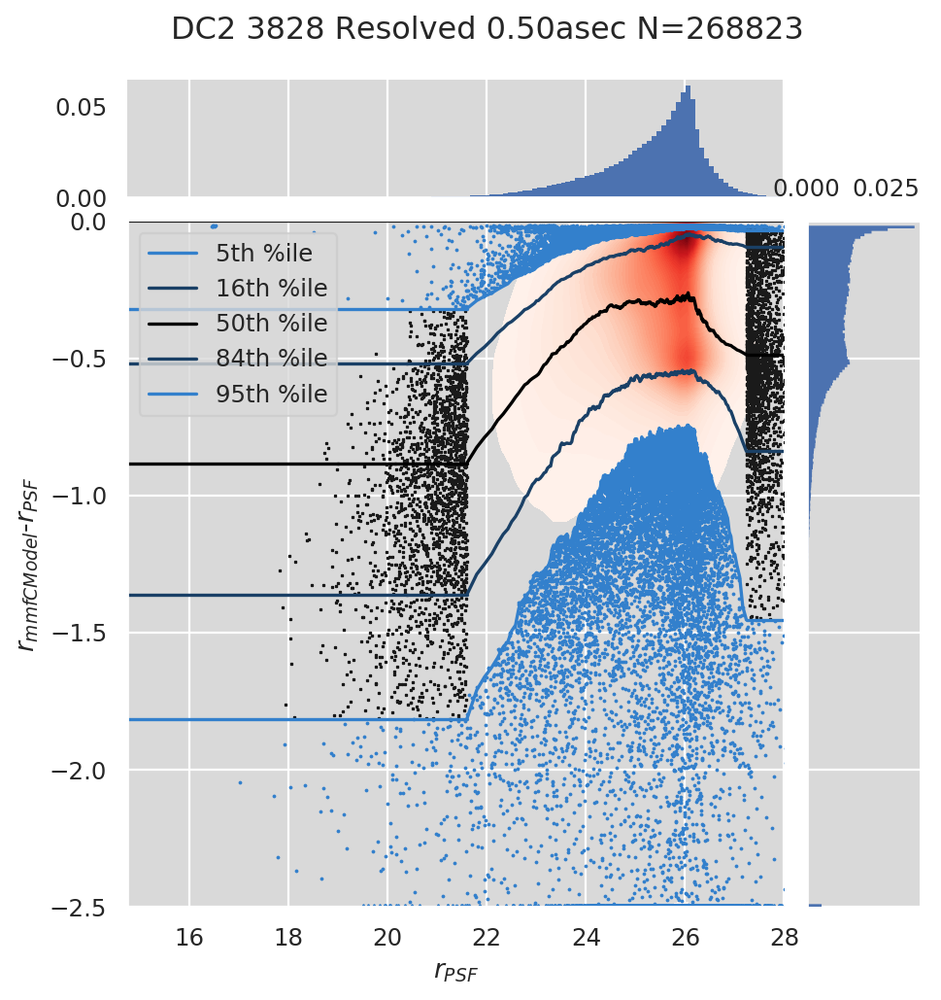

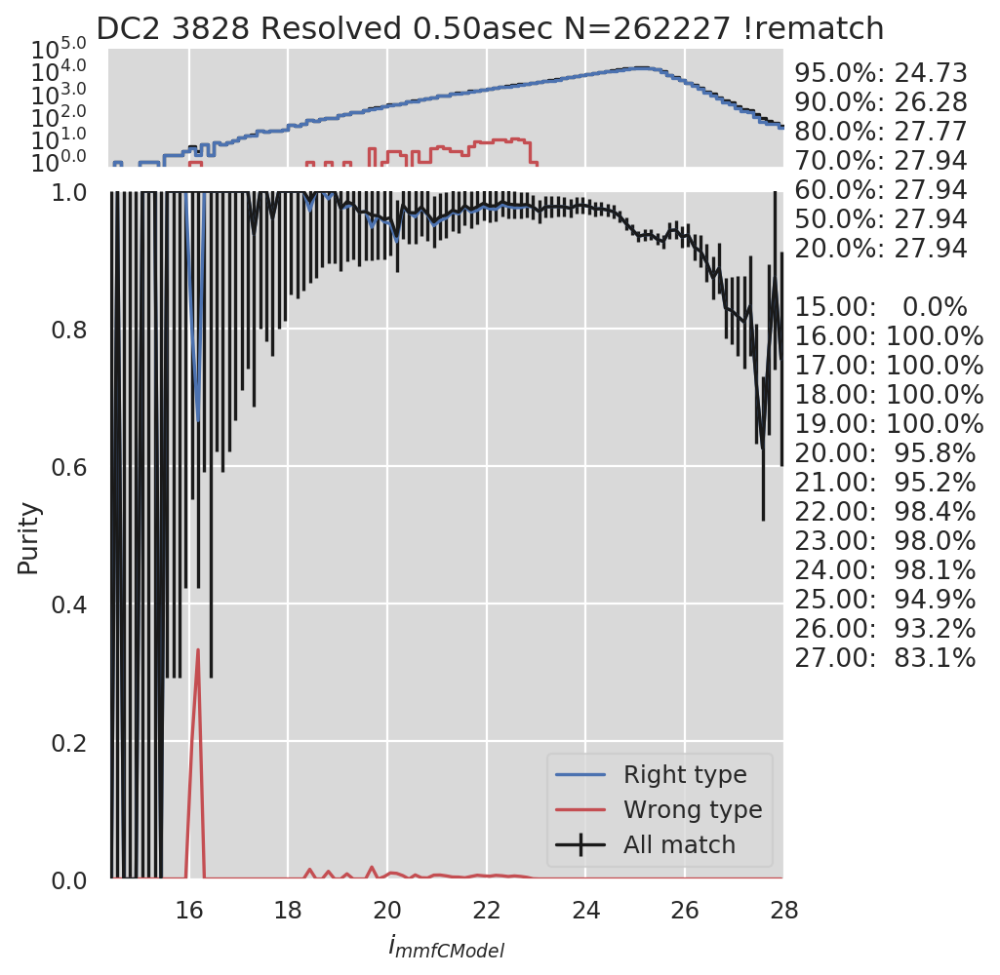

Rematched 45202/2587104; 344264 originally and 298580 rematched already matched
N=0sky object matches after rematching


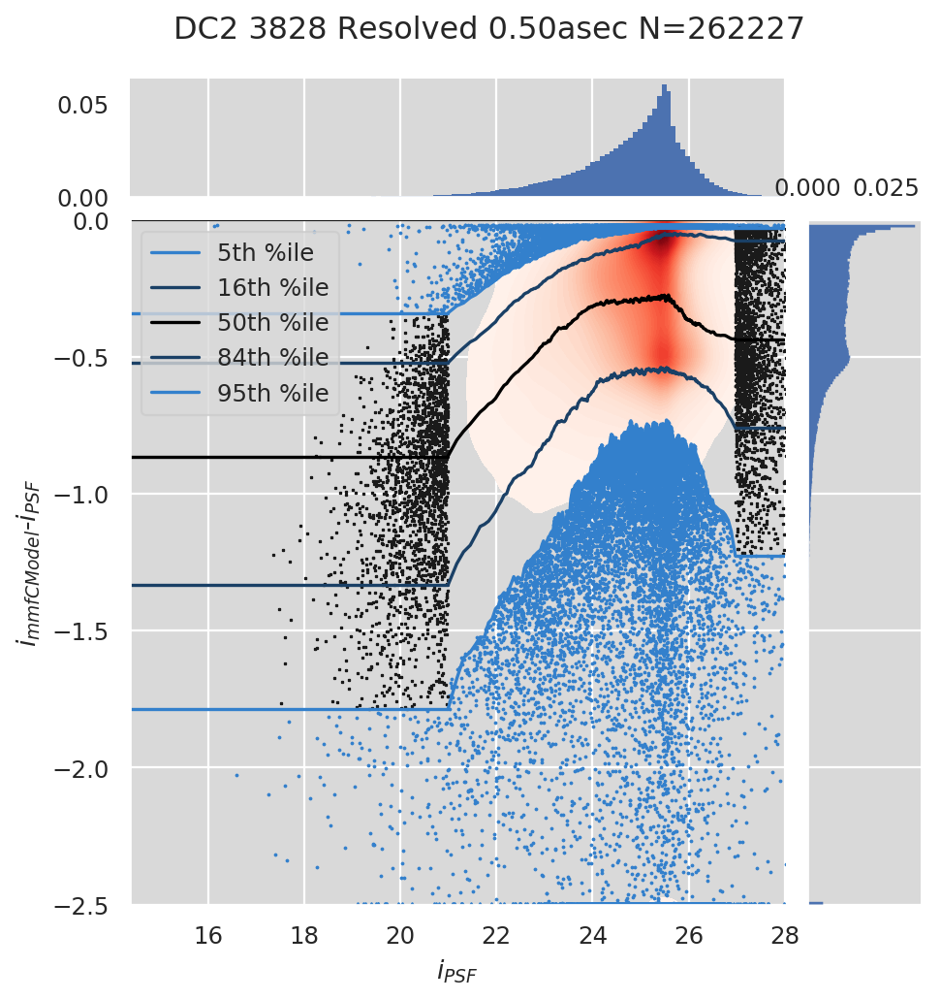

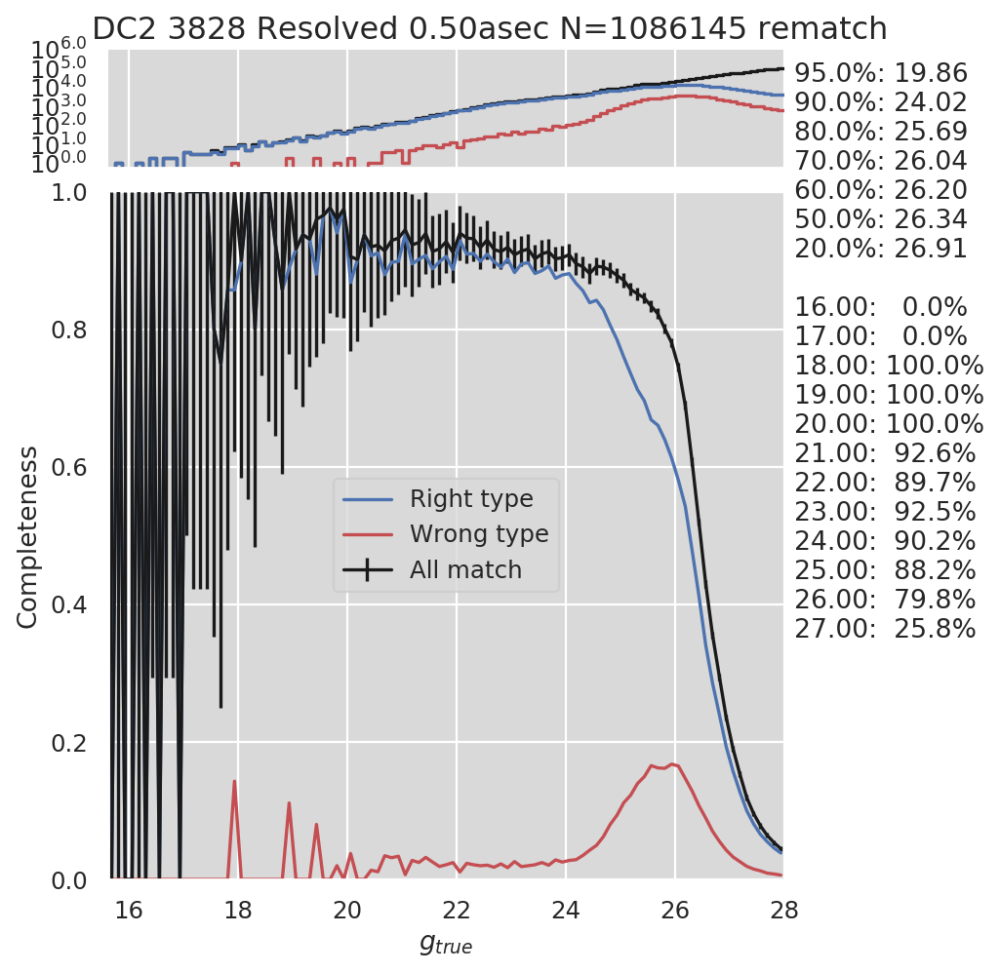

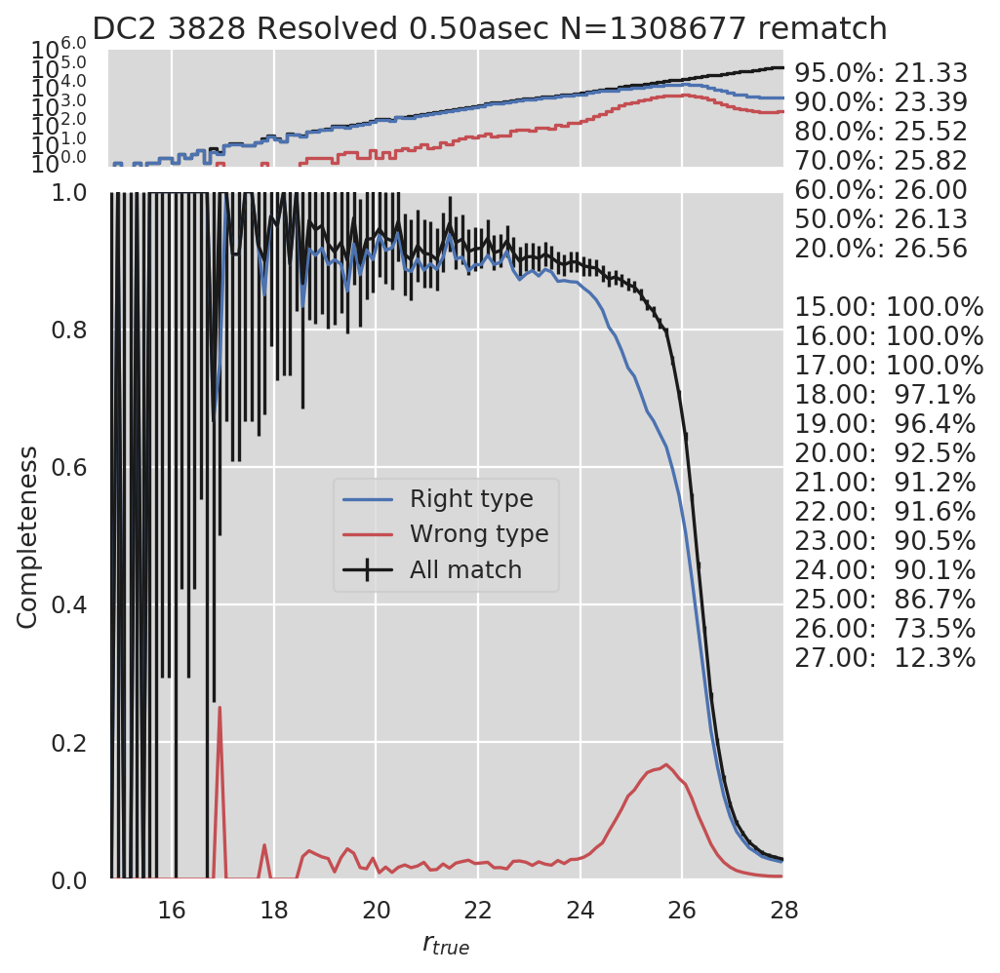

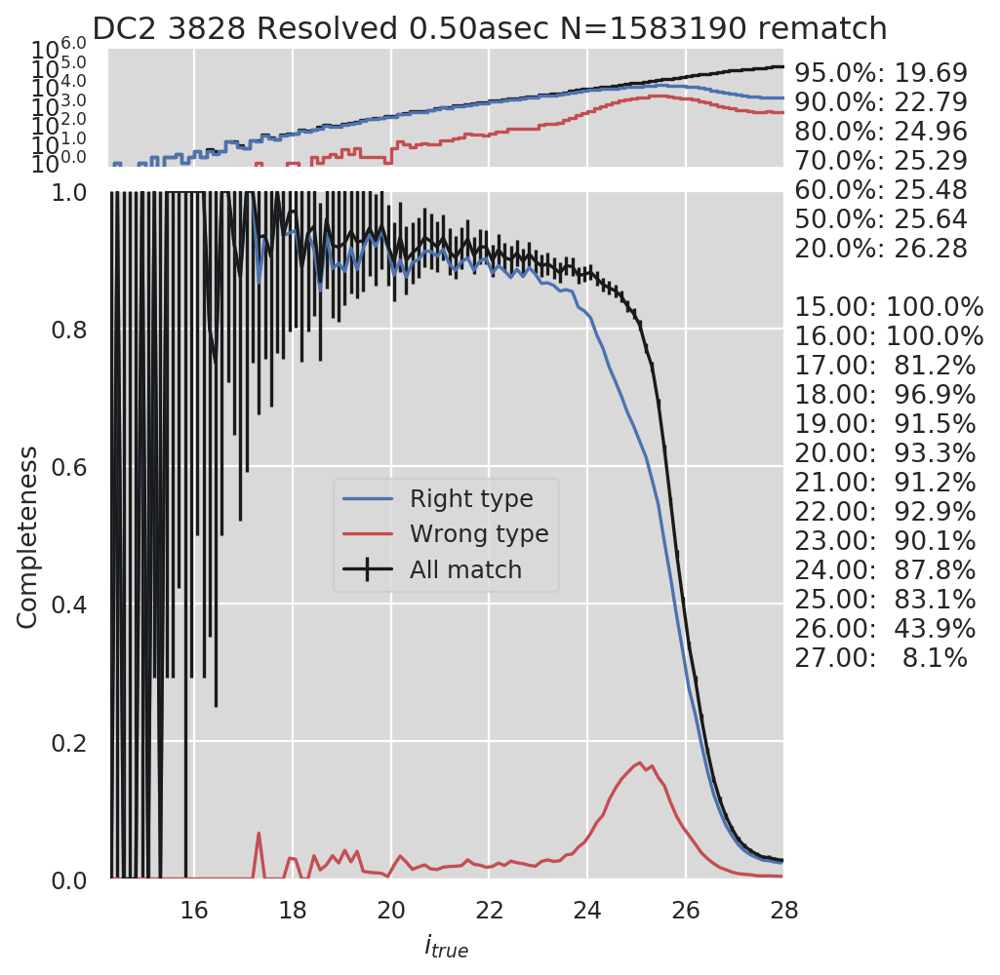

236260 matched and 248637 mag < 28; 235010 both and 67 non-finite; 250360/len(cat)=382426


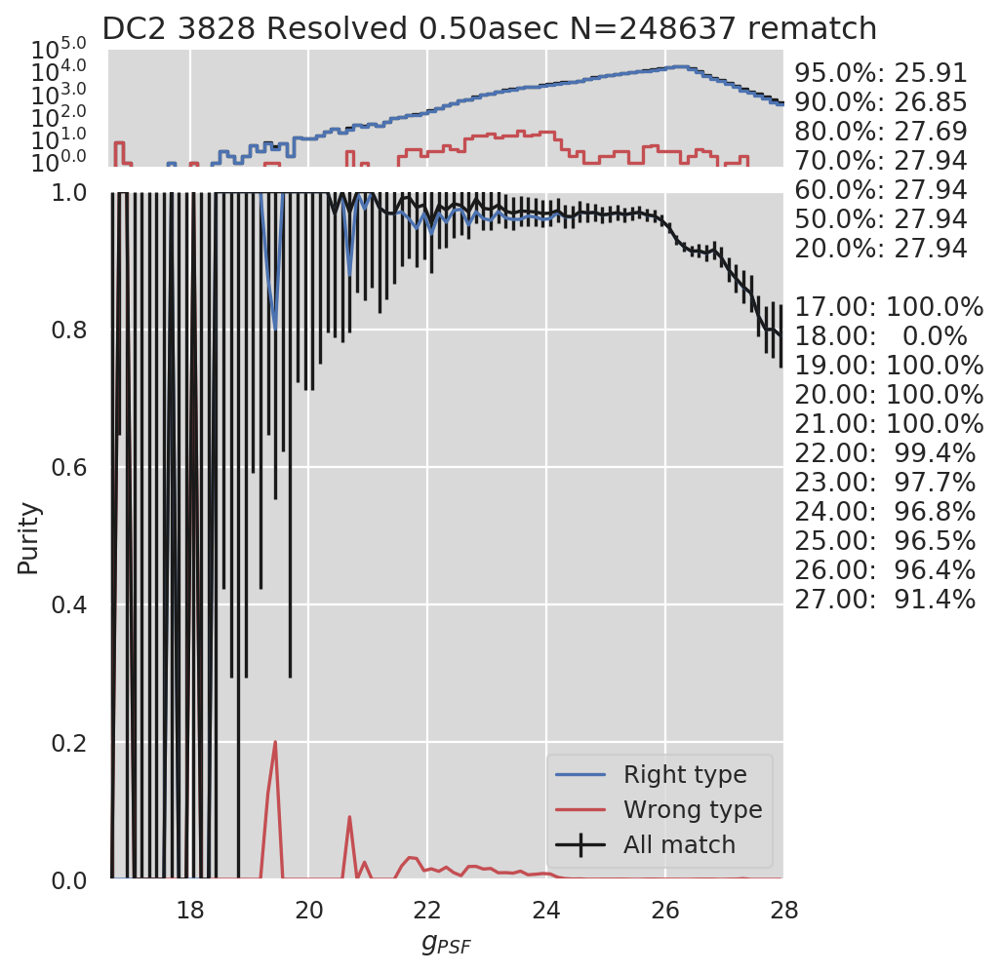

253048 matched and 268384 mag < 28; 252761 both and 69 non-finite; 269219/len(cat)=382426


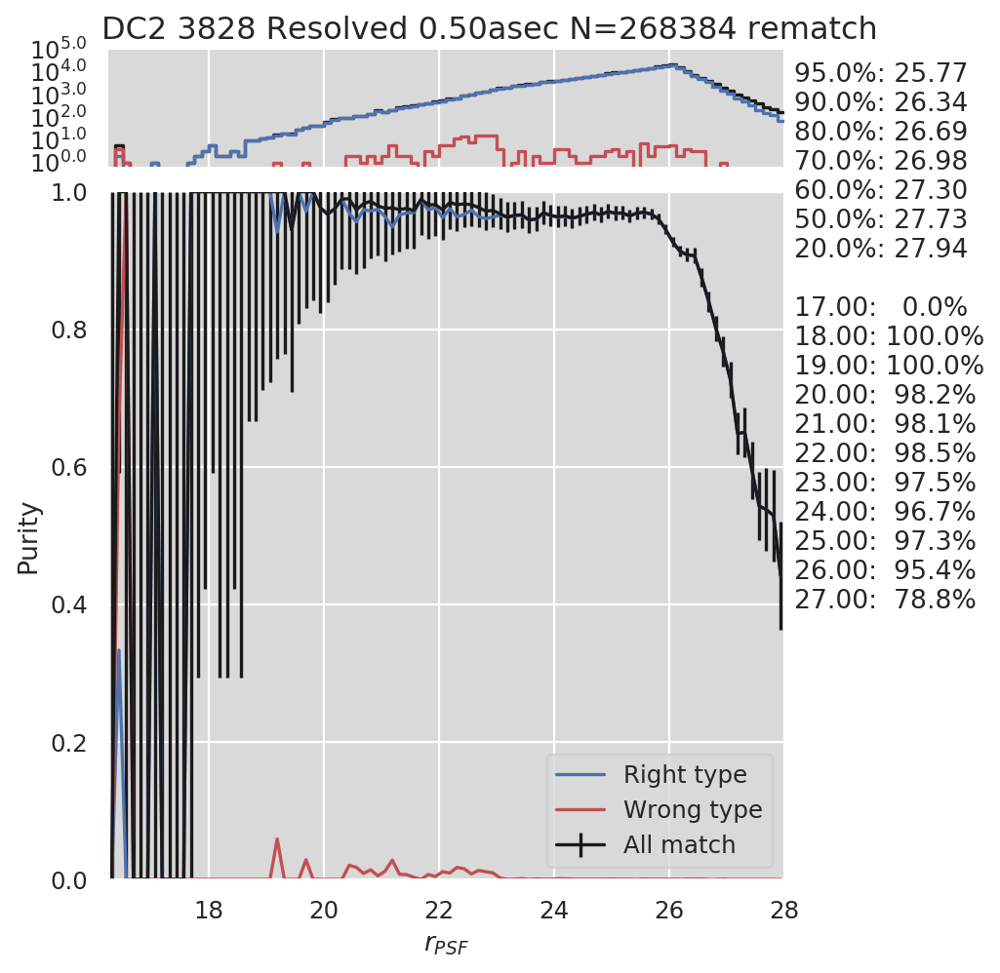

246151 matched and 261917 mag < 28; 245691 both and 87 non-finite; 262535/len(cat)=382426


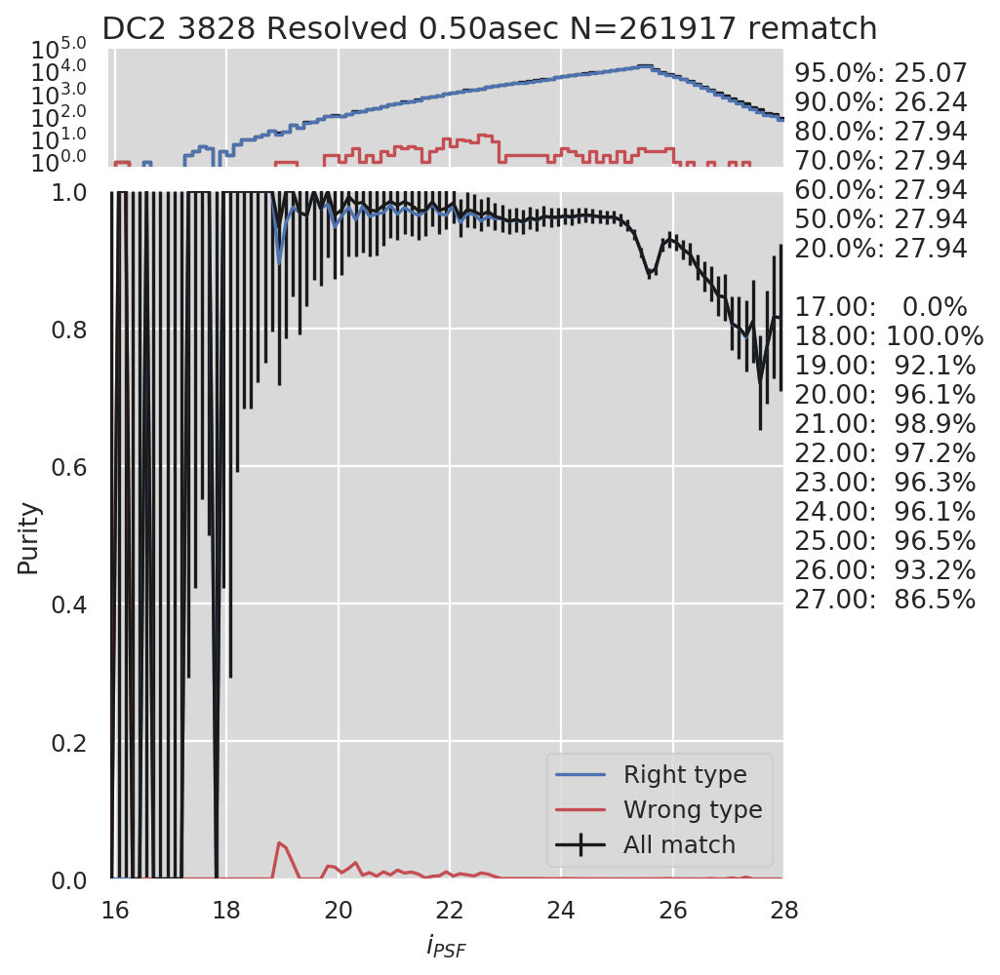

236260 matched and 249432 mag < 28; 235624 both and 13 non-finite; 250360/len(cat)=382426


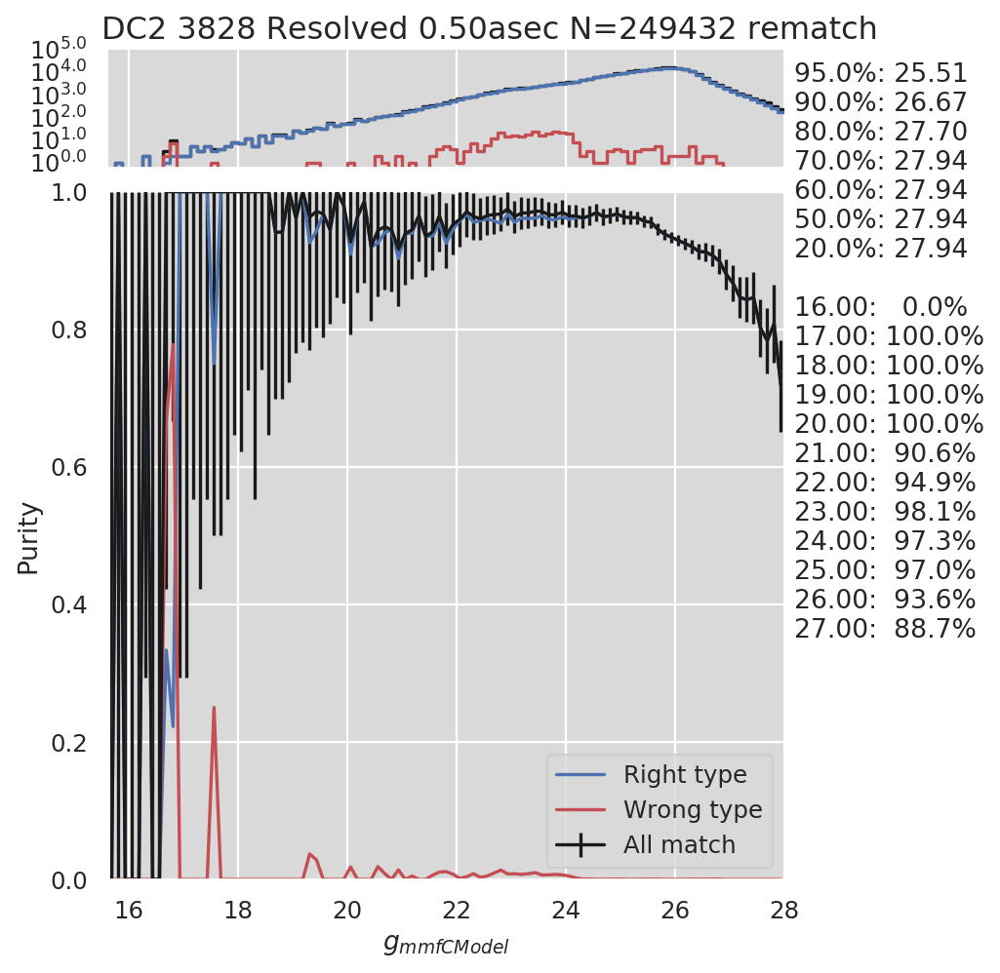

253048 matched and 268823 mag < 28; 252899 both and 9 non-finite; 269219/len(cat)=382426


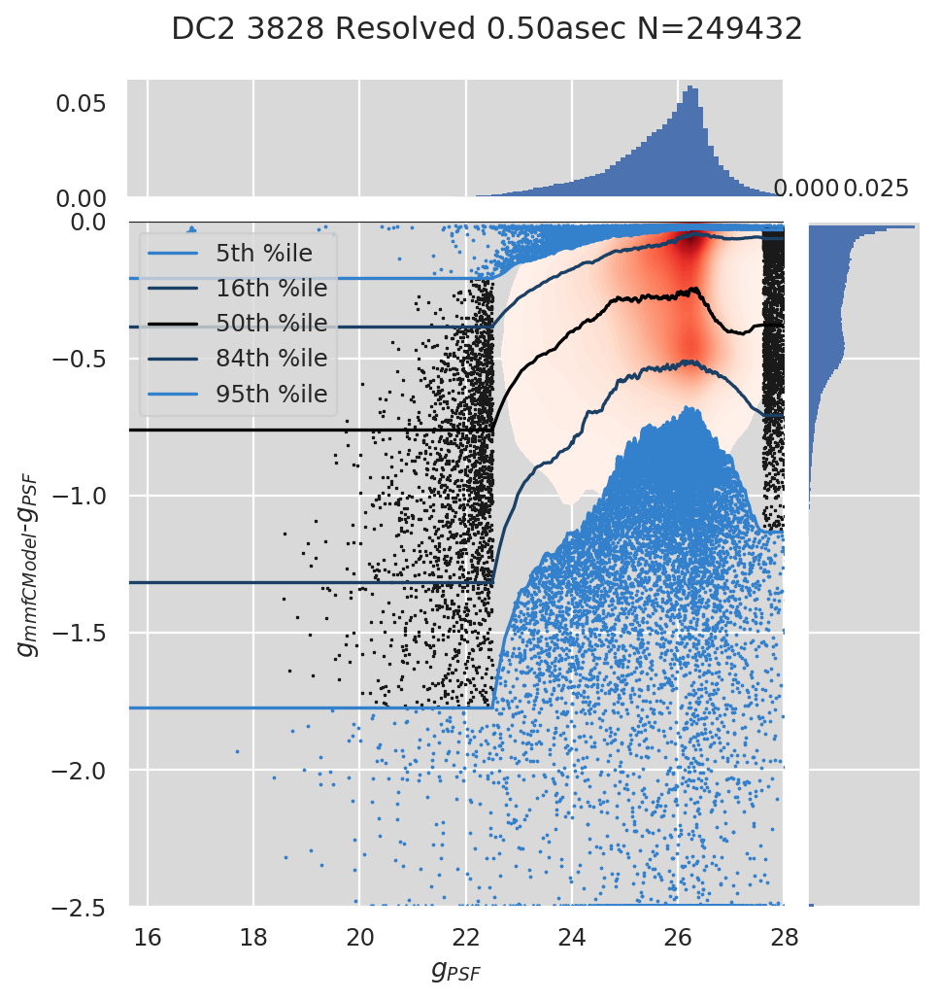

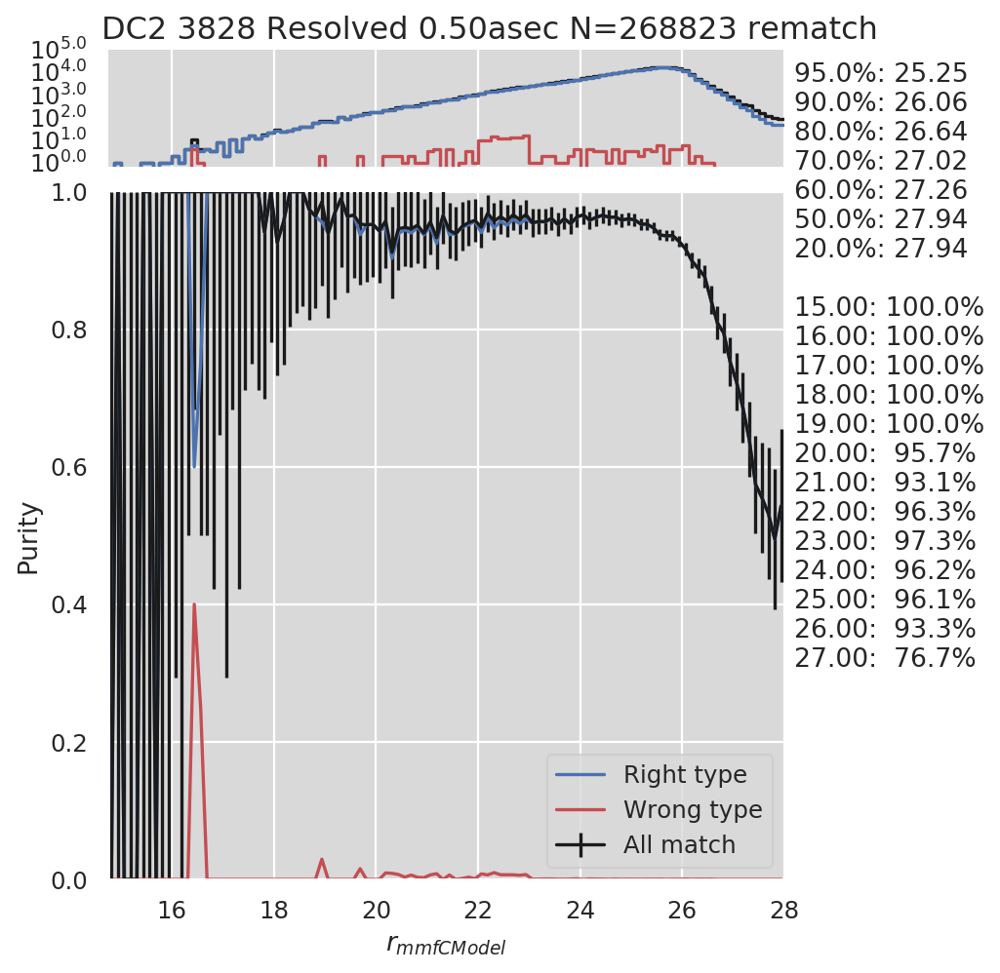

246151 matched and 262227 mag < 28; 245937 both and 12 non-finite; 262535/len(cat)=382426


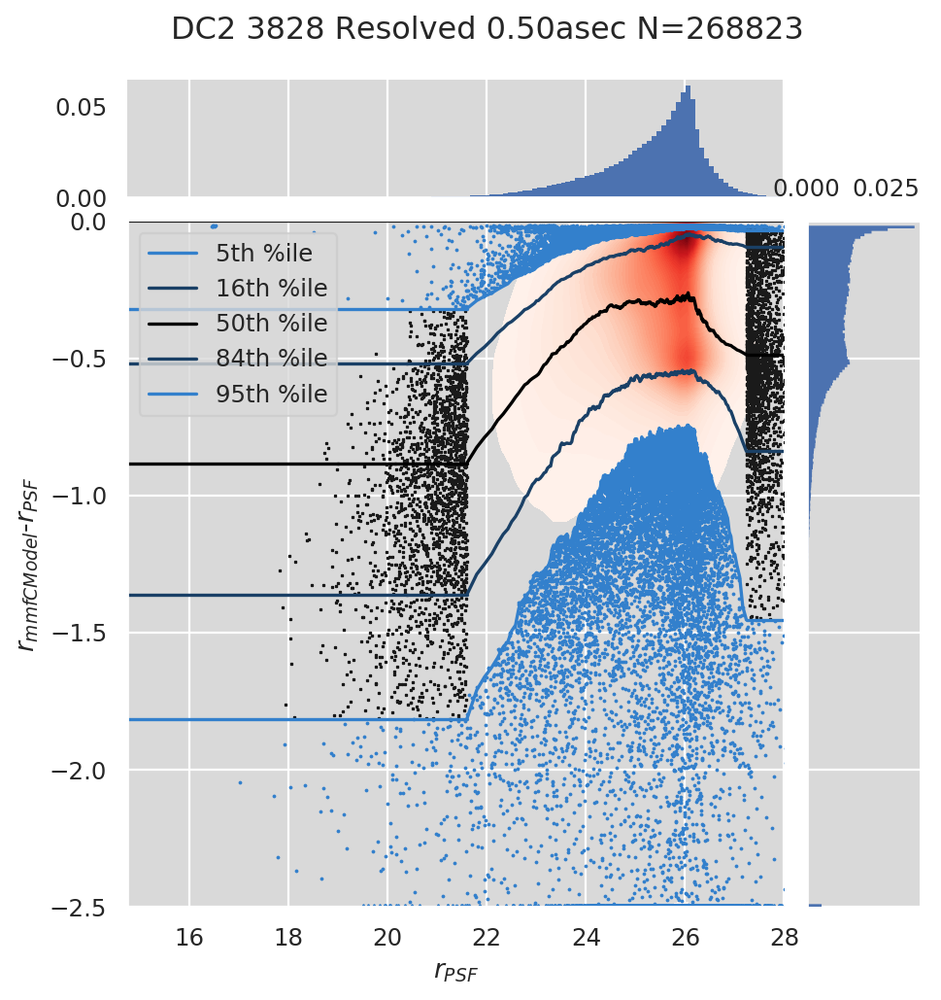

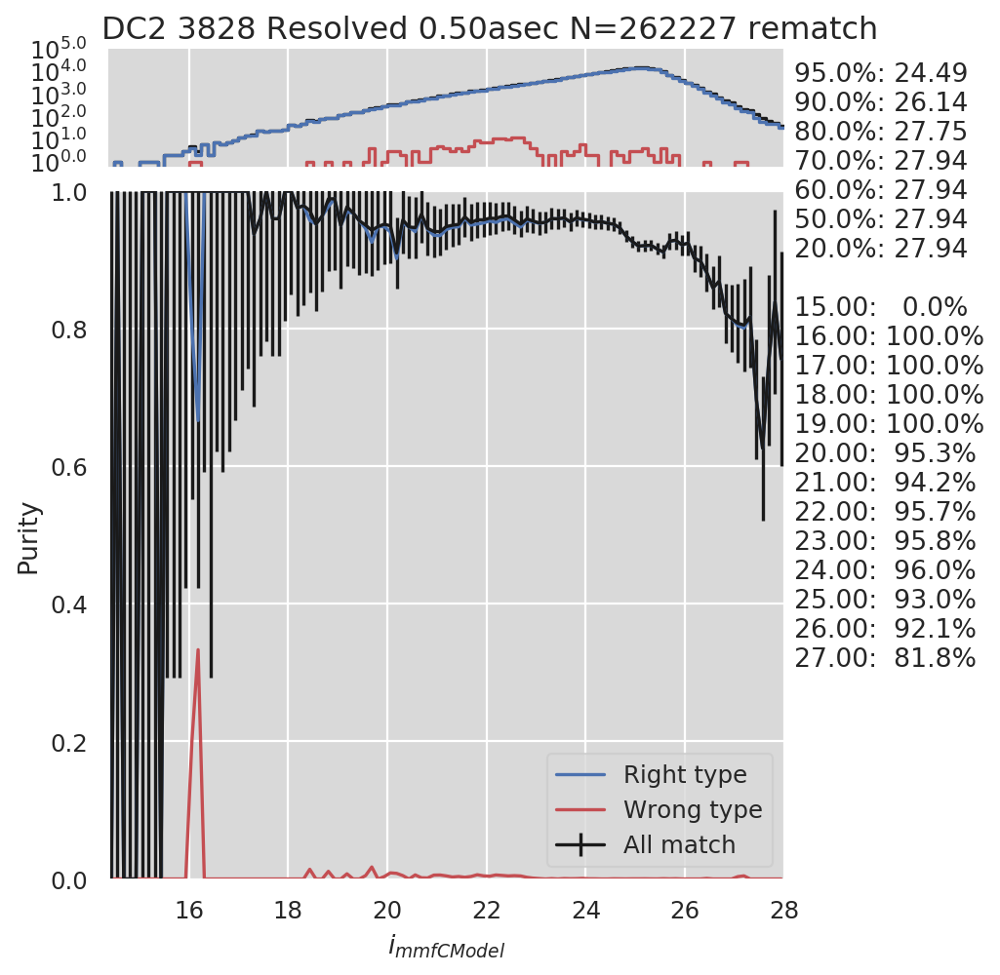

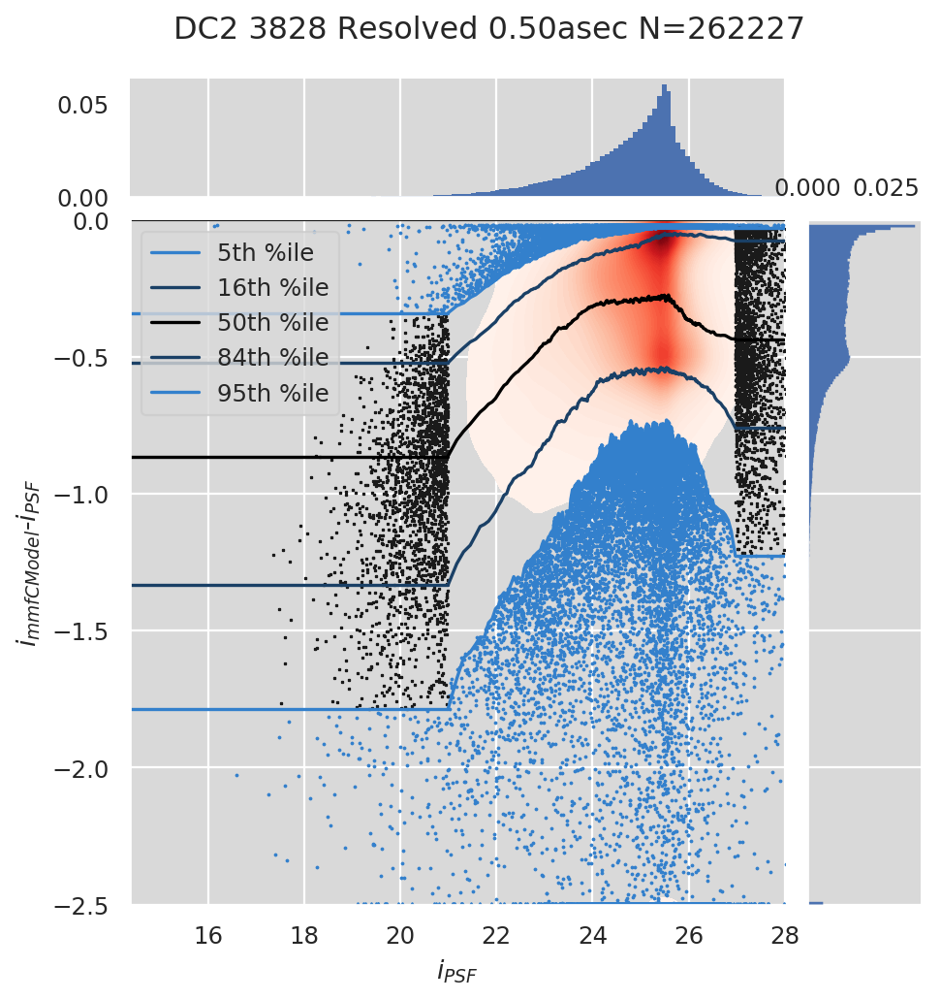

In [10]:
# Galaxies w/~3 pixel match radius
plot_matches(
    cats, True, models, filters_single, band_ref=band_ref, band_ref_multi=band_ref,
    band_multi=filters_multi[0], mag_max=28, mag_max_compure=28, limy=lim_y['resolved'],
    match_dist_asec=0.5, rematch=True, models_purity=models_purity, mag_bin_complete=0.125,
    plot_diffs=False, compare_mags_psf_lim=(-2.5, 0), **args
)

### Stars, 1 pixel match radius

Unfortunately, since the truth tables only go down to r=23 for stars, there's not much to say here other than that completeness and purity seem reasonable.
- The increase in the fraction of matches to wrong types from r=22 to r=23 is somewhat troubling. Is this indicative of bad deblending, source modelling, or crossmatching? (Yes...)
- Purity looks fine below r<23. Fainter than that, I suppose it's actually a measure of how bad blending with galaxies is for stars.

N=0 sky object matches


/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:113: RuntimeWarning: invalid value encountered in greater_equal


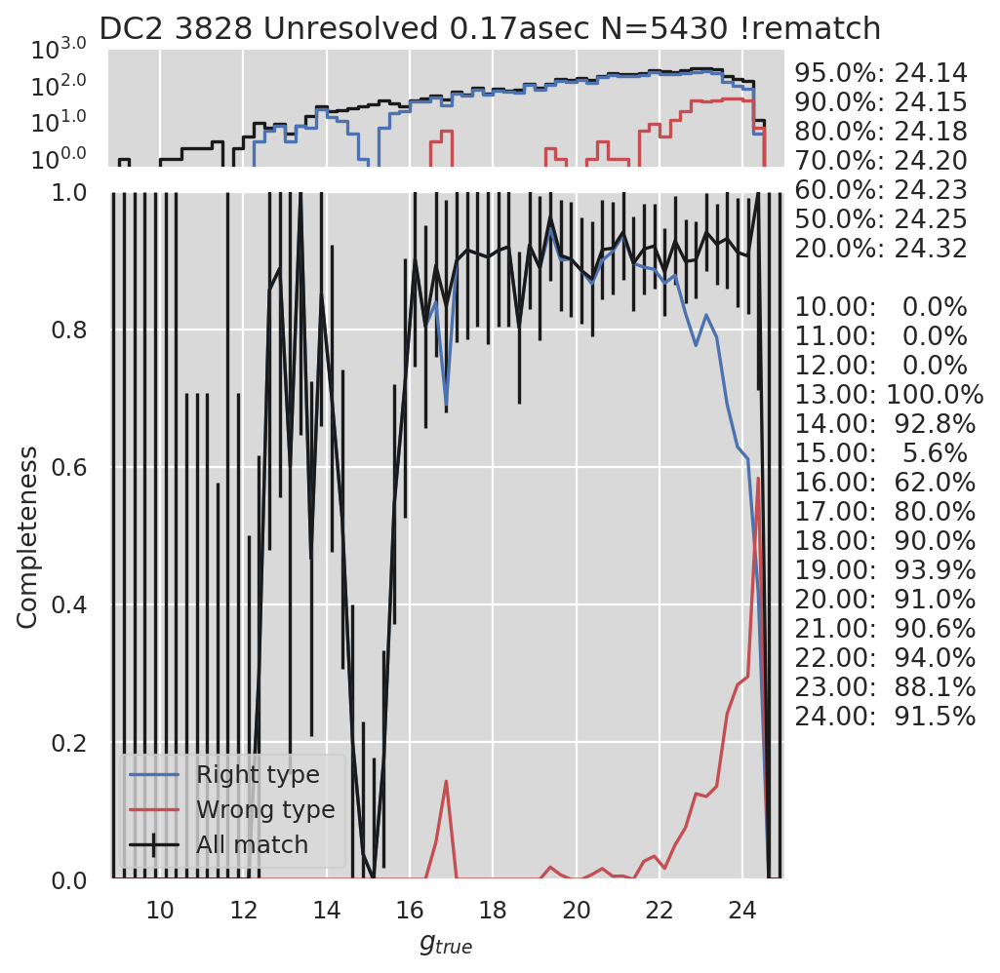

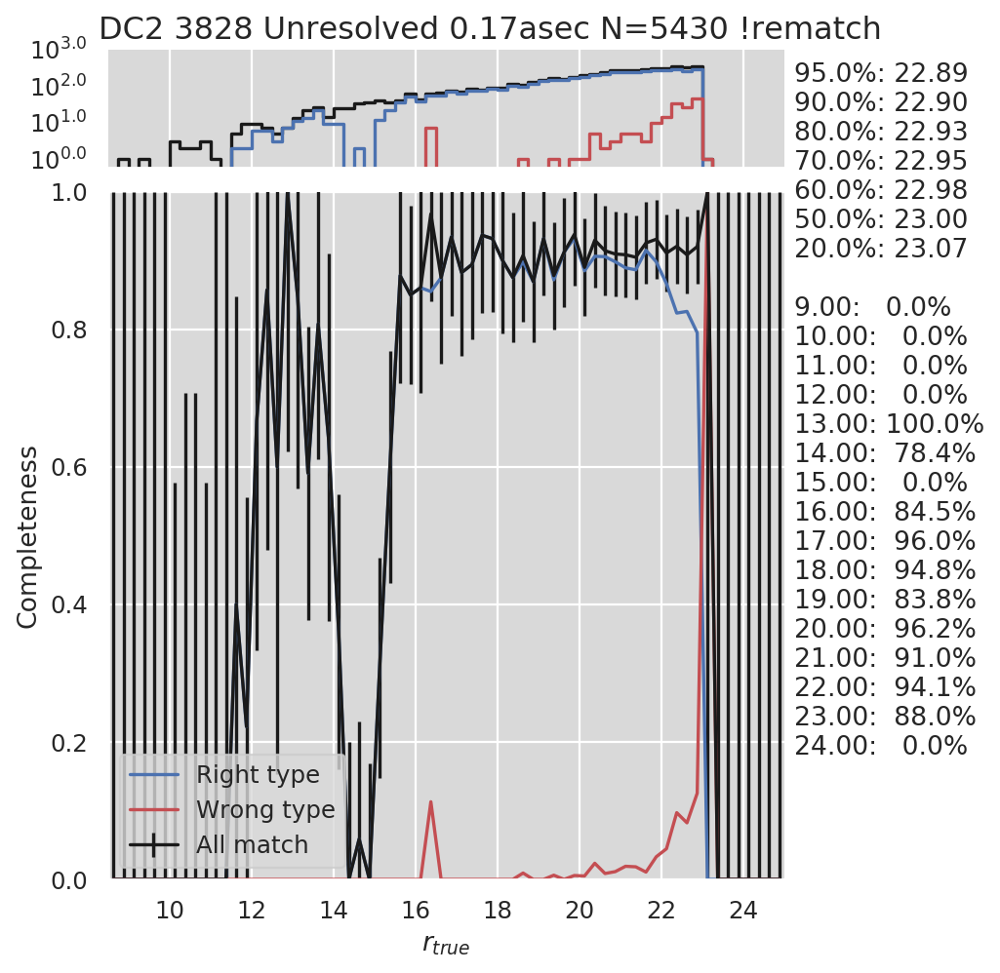

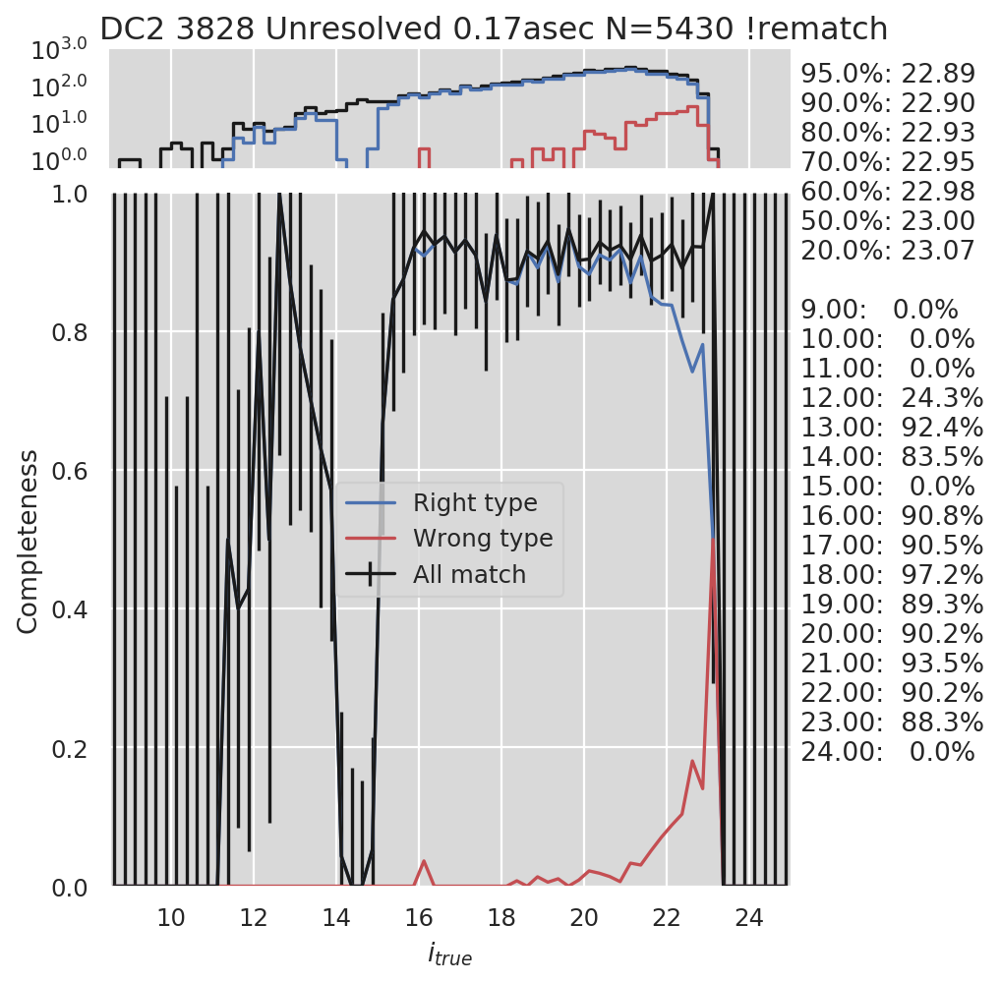

/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:161: RuntimeWarning: invalid value encountered in less


40838 matched and 6378 mag < 25; 5529 both and 5 non-finite; 62701/len(cat)=382426


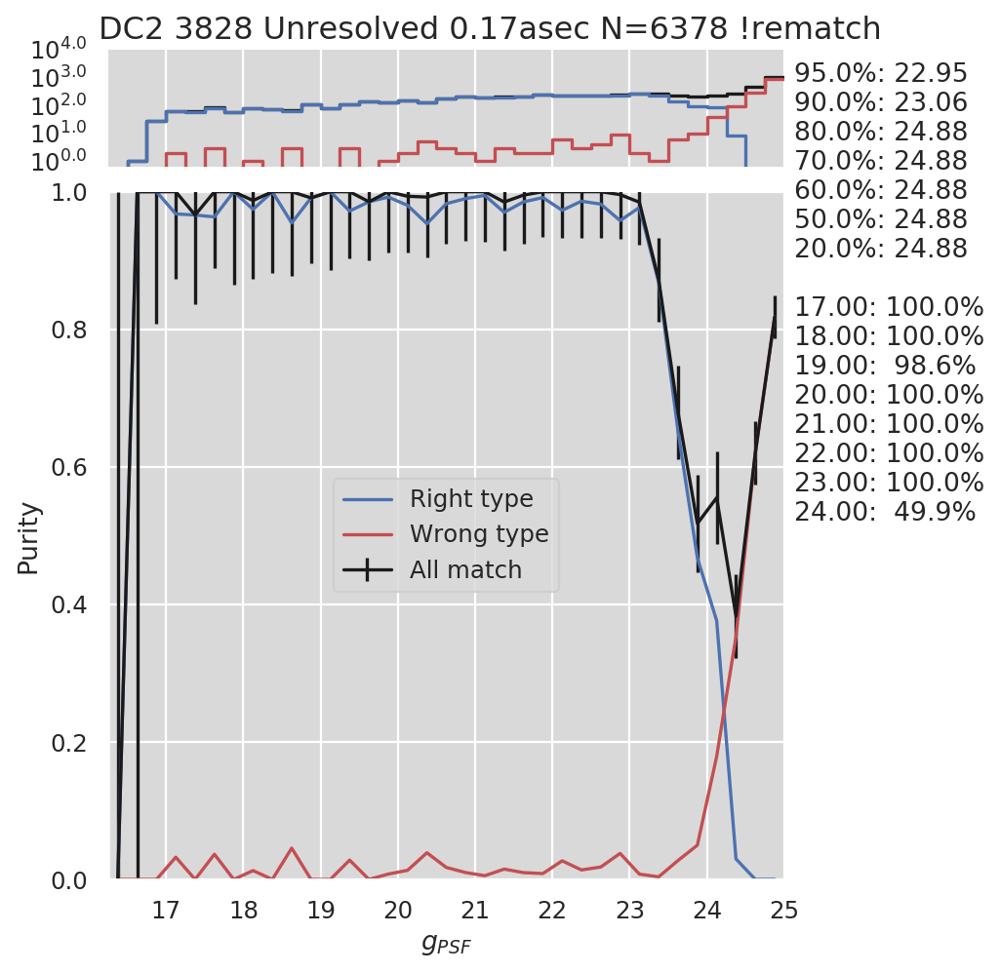

42339 matched and 9017 mag < 25; 7150 both and 1 non-finite; 60489/len(cat)=382426


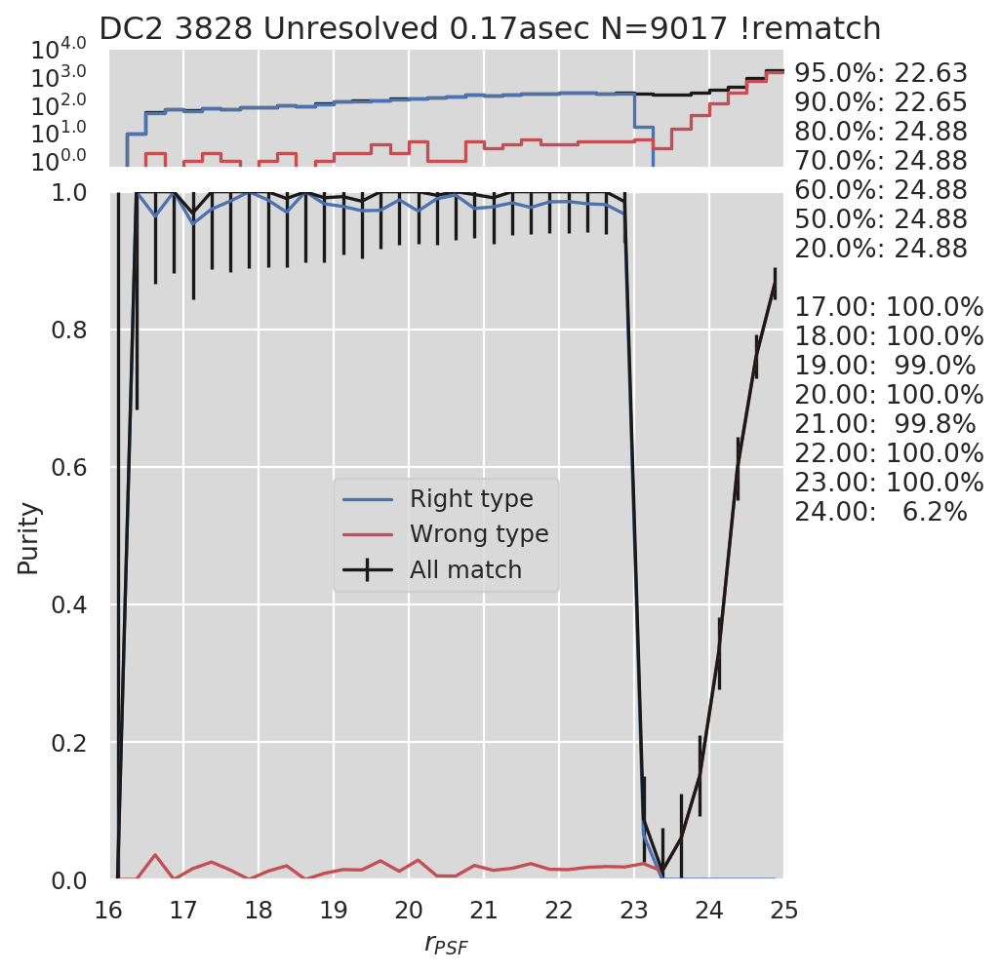

38427 matched and 17262 mag < 25; 13767 both and 3 non-finite; 59941/len(cat)=382426


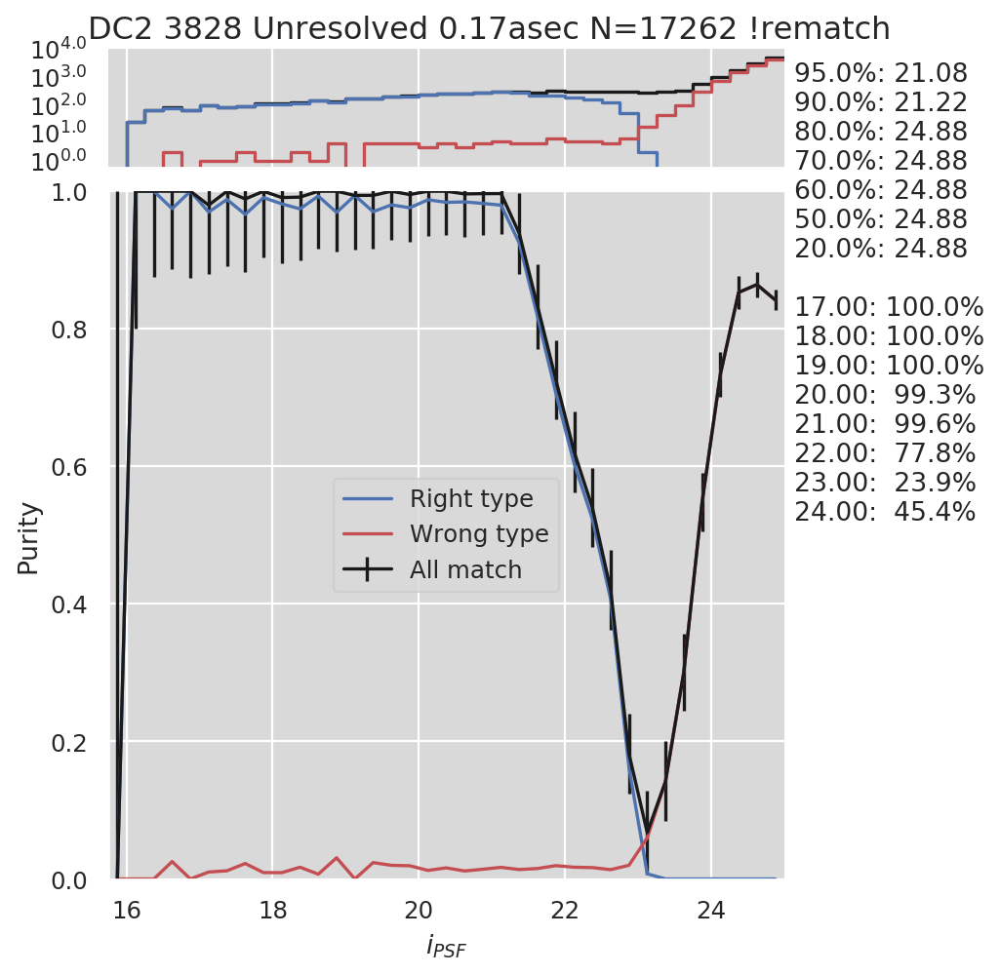

40838 matched and 6376 mag < 25; 5523 both and 56 non-finite; 62701/len(cat)=382426


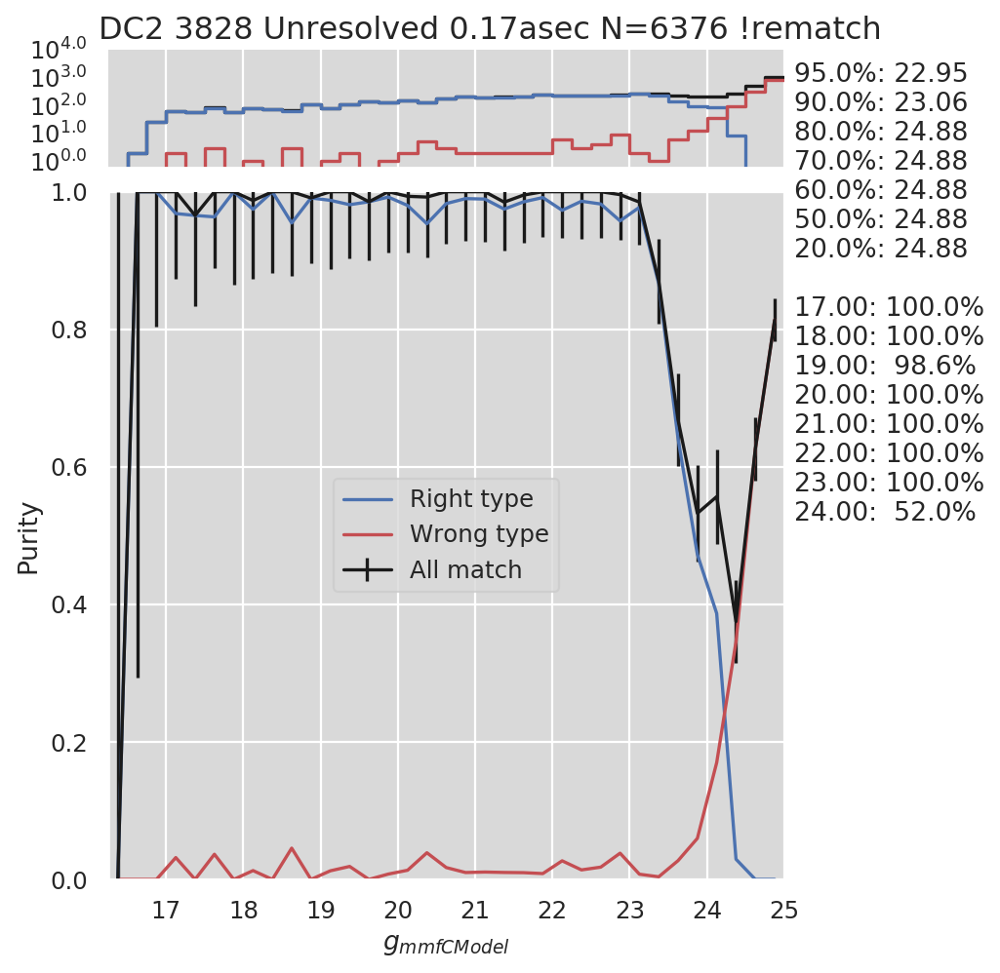

/software/lsstsw/stack_20200220/python/miniconda3-4.7.12/envs/lsst-scipipe/lib/python3.7/site-packages/ipykernel_launcher.py:172: RuntimeWarning: invalid value encountered in less


42339 matched and 8995 mag < 25; 7128 both and 43 non-finite; 60489/len(cat)=382426


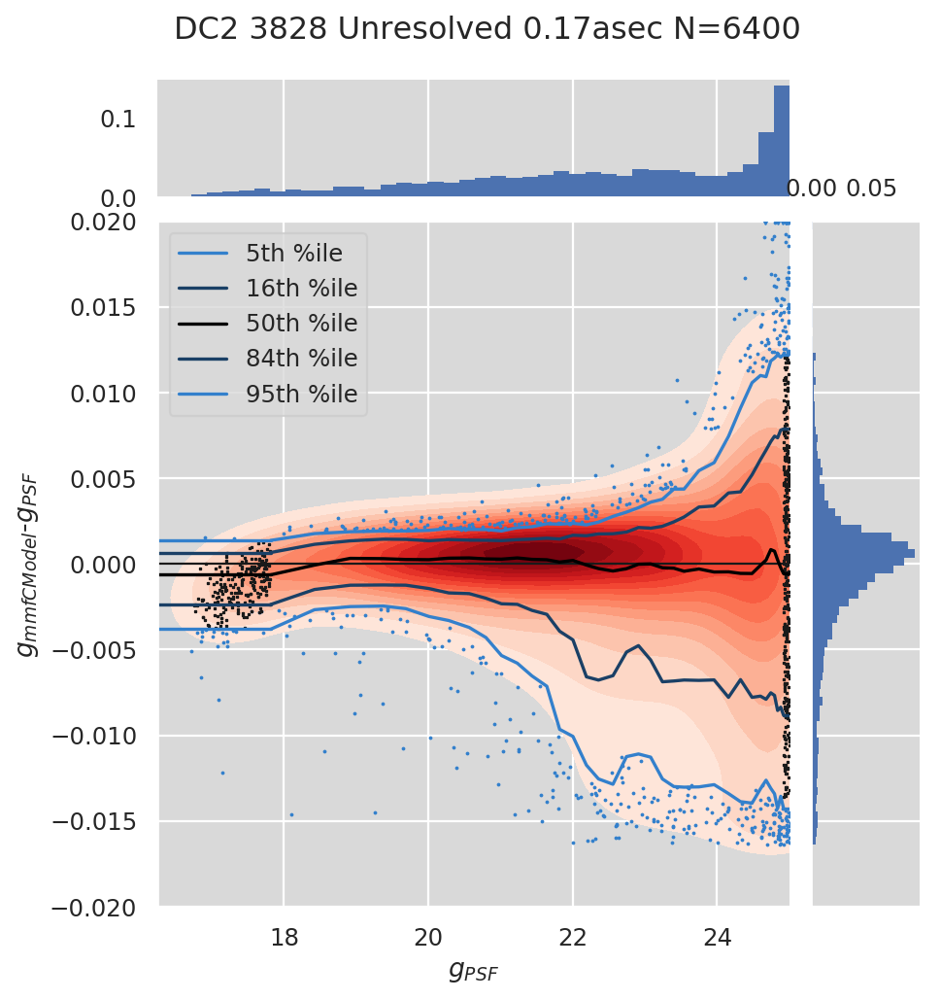

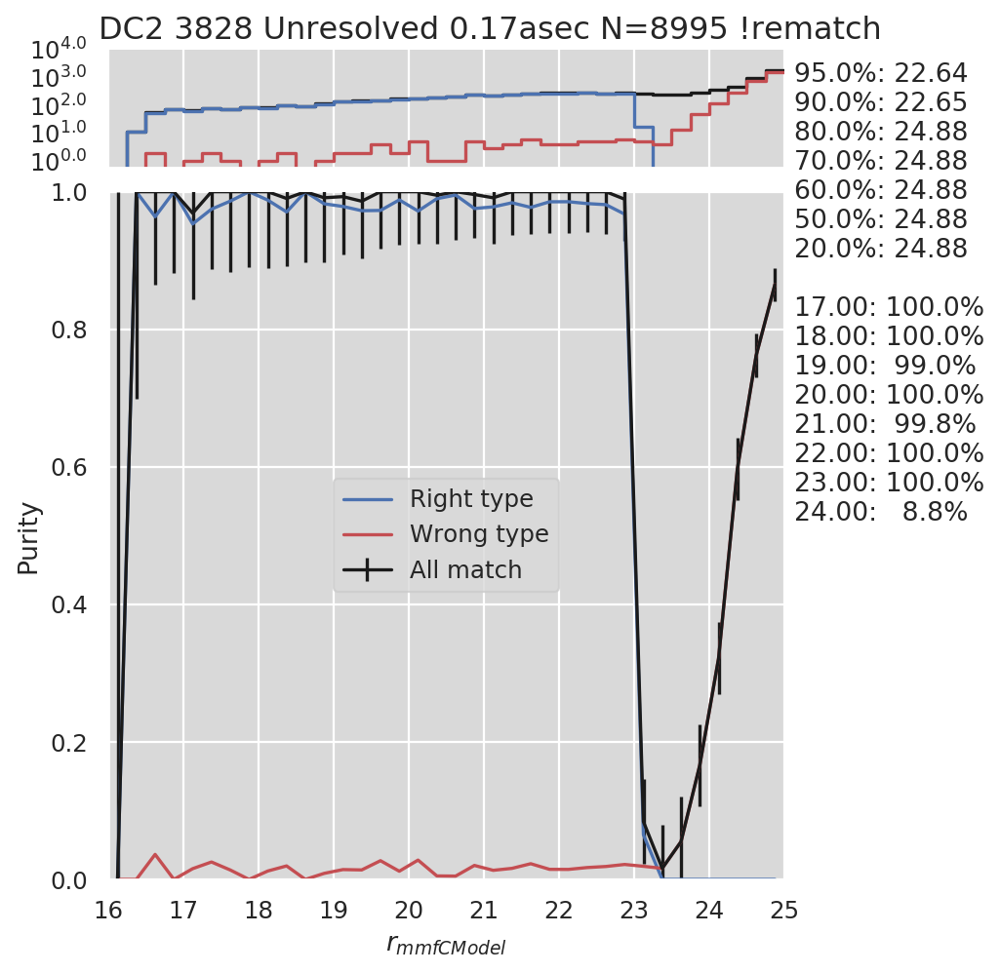

38427 matched and 17194 mag < 25; 13712 both and 38 non-finite; 59941/len(cat)=382426


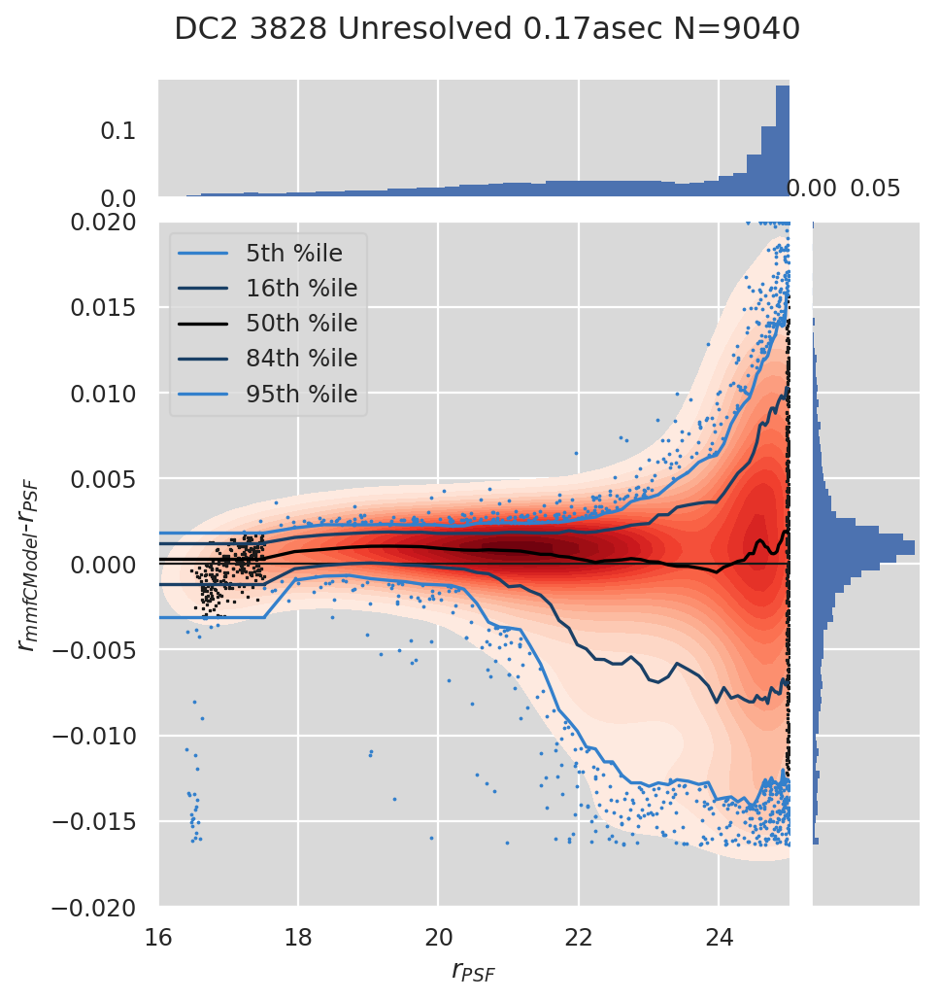

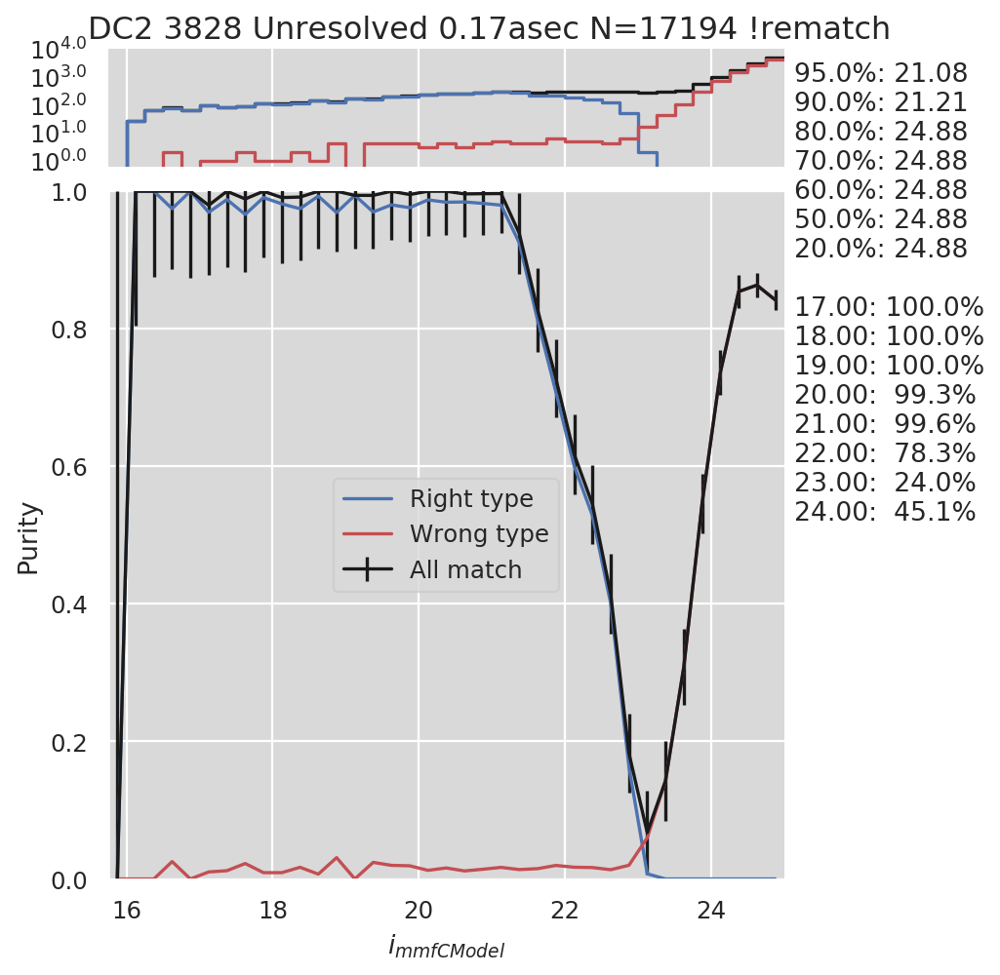

Rematched 77/5430; 4778 originally and 4778 rematched already matched
N=0sky object matches after rematching


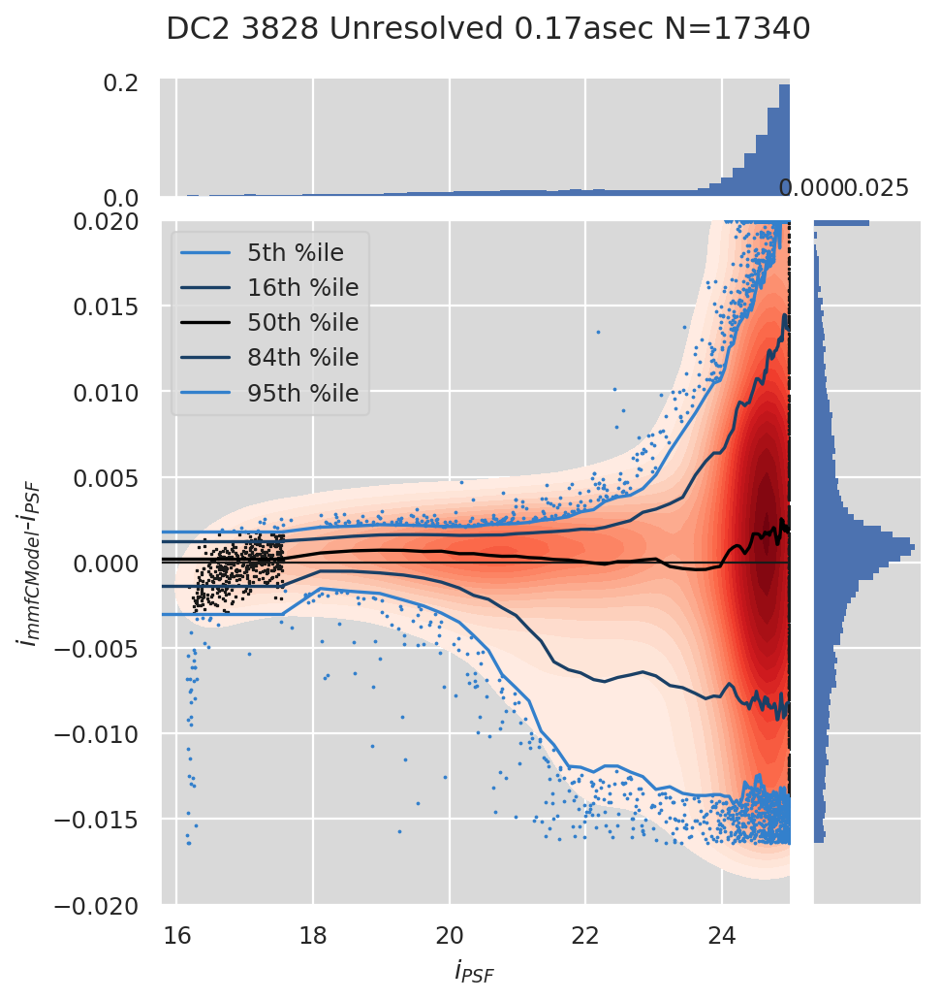

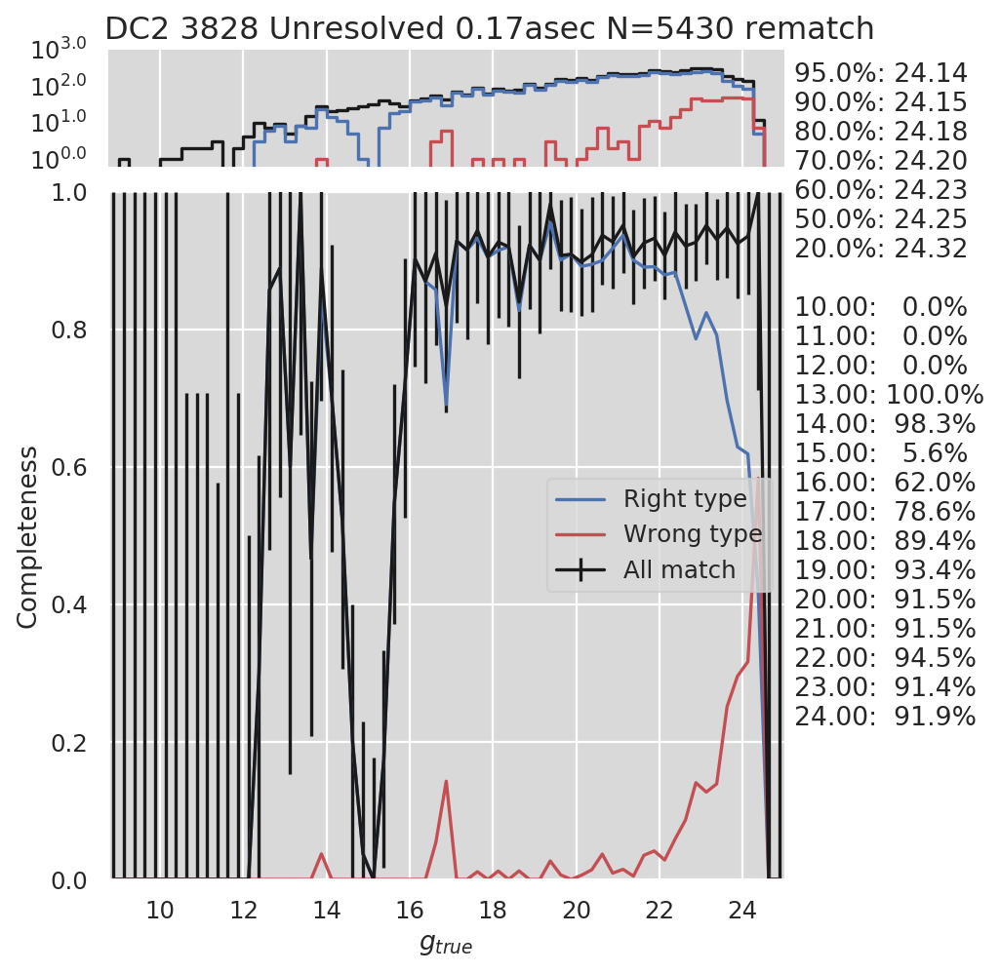

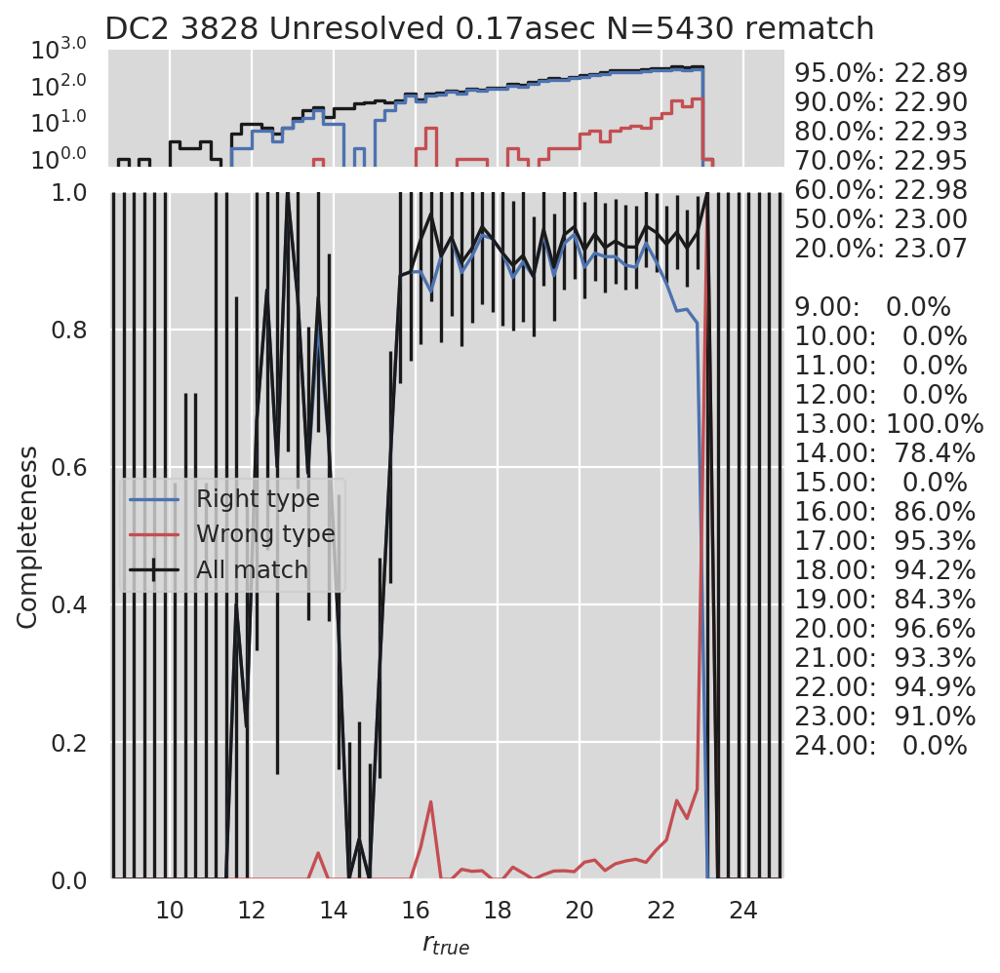

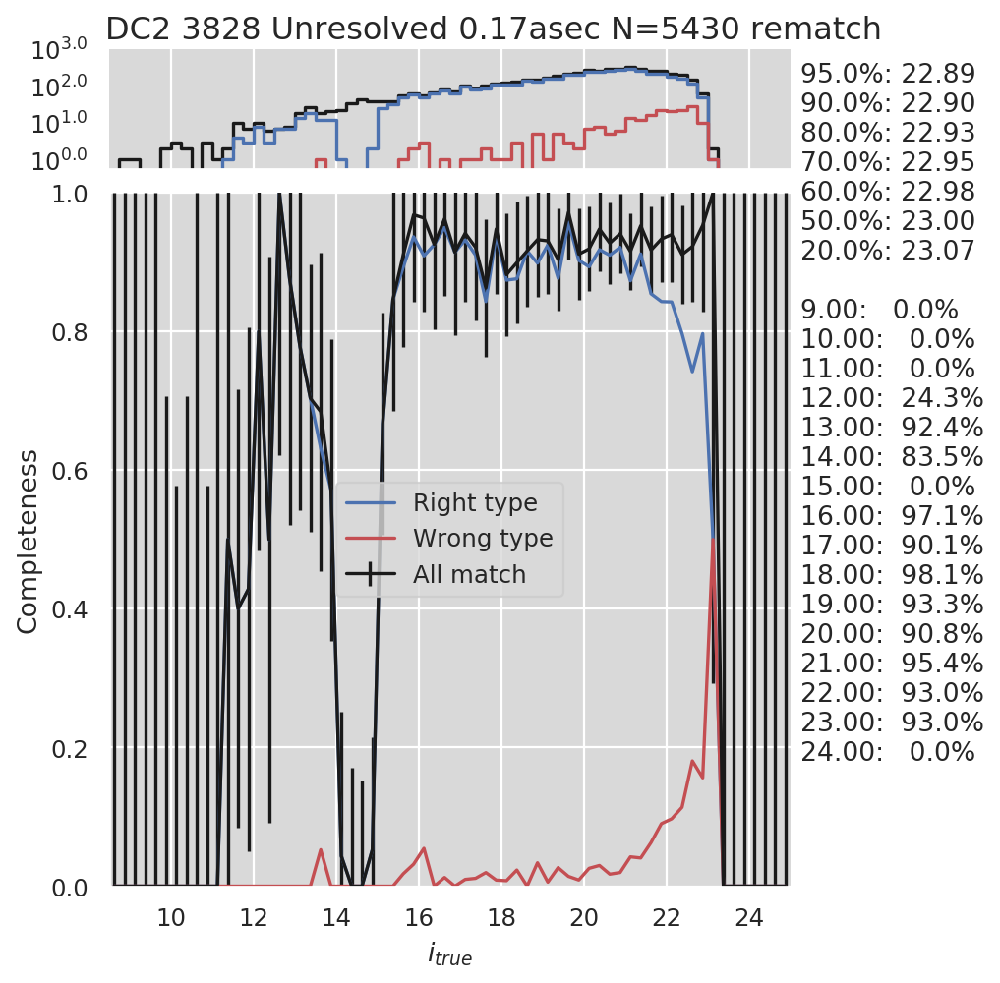

40835 matched and 6378 mag < 25; 5529 both and 5 non-finite; 62701/len(cat)=382426


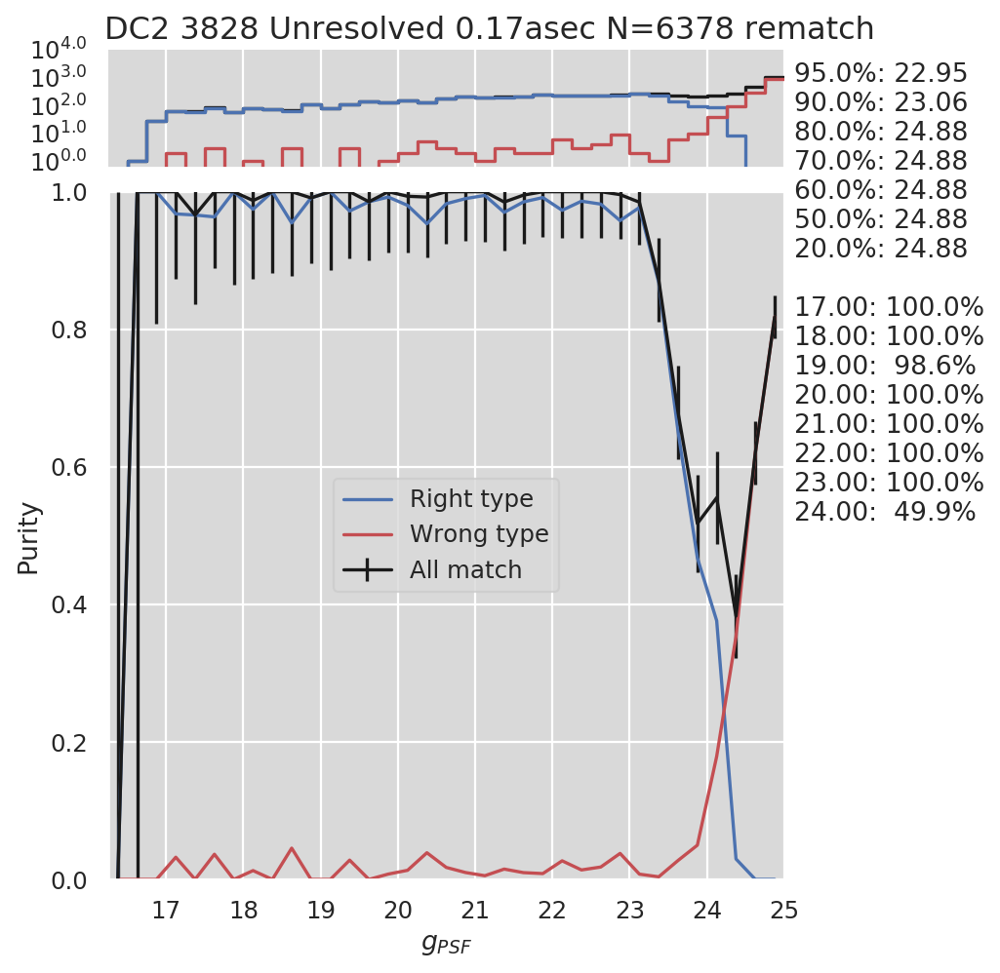

42338 matched and 9017 mag < 25; 7150 both and 1 non-finite; 60489/len(cat)=382426


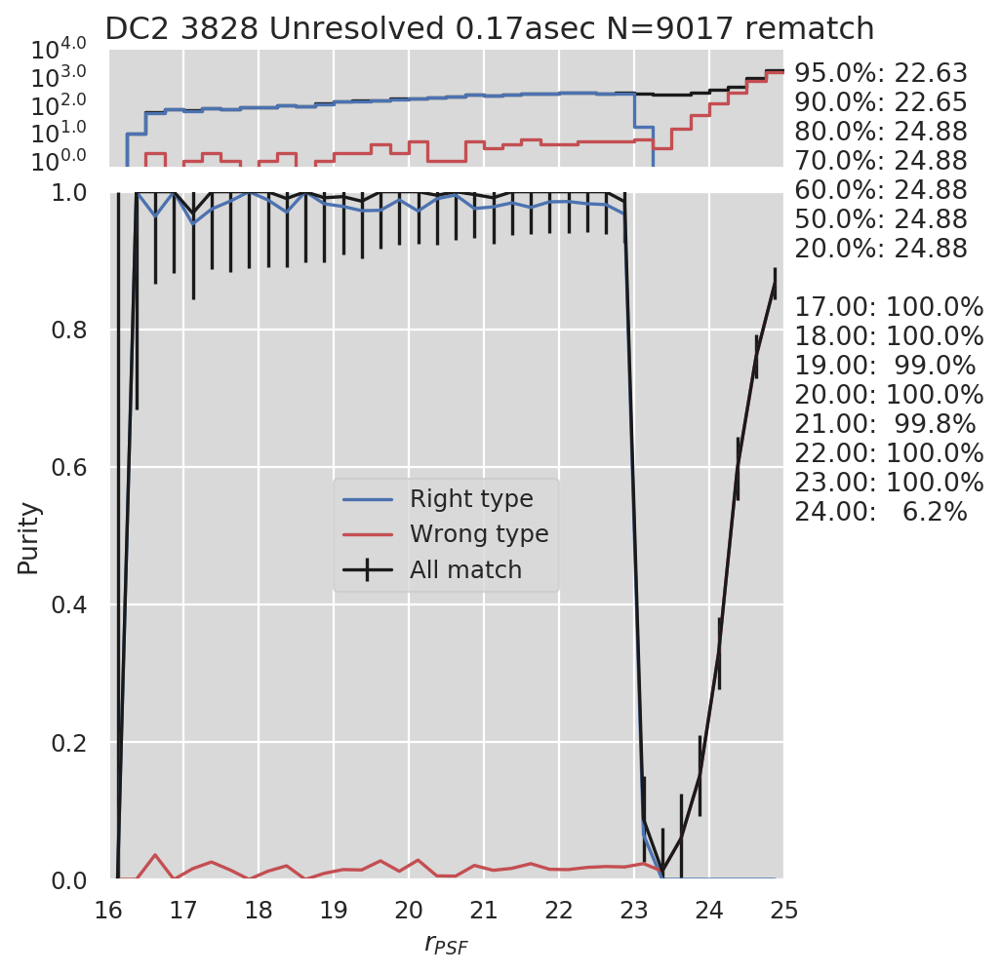

38425 matched and 17262 mag < 25; 13766 both and 3 non-finite; 59941/len(cat)=382426


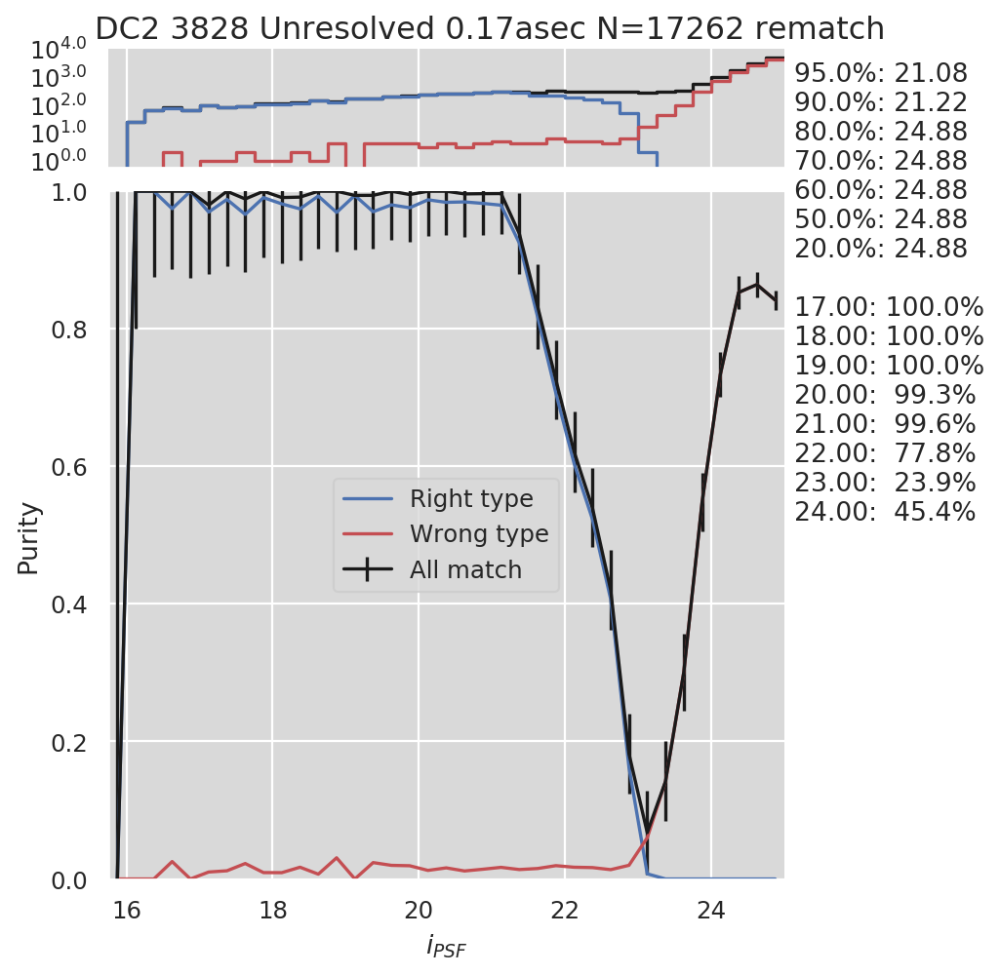

40835 matched and 6376 mag < 25; 5523 both and 56 non-finite; 62701/len(cat)=382426


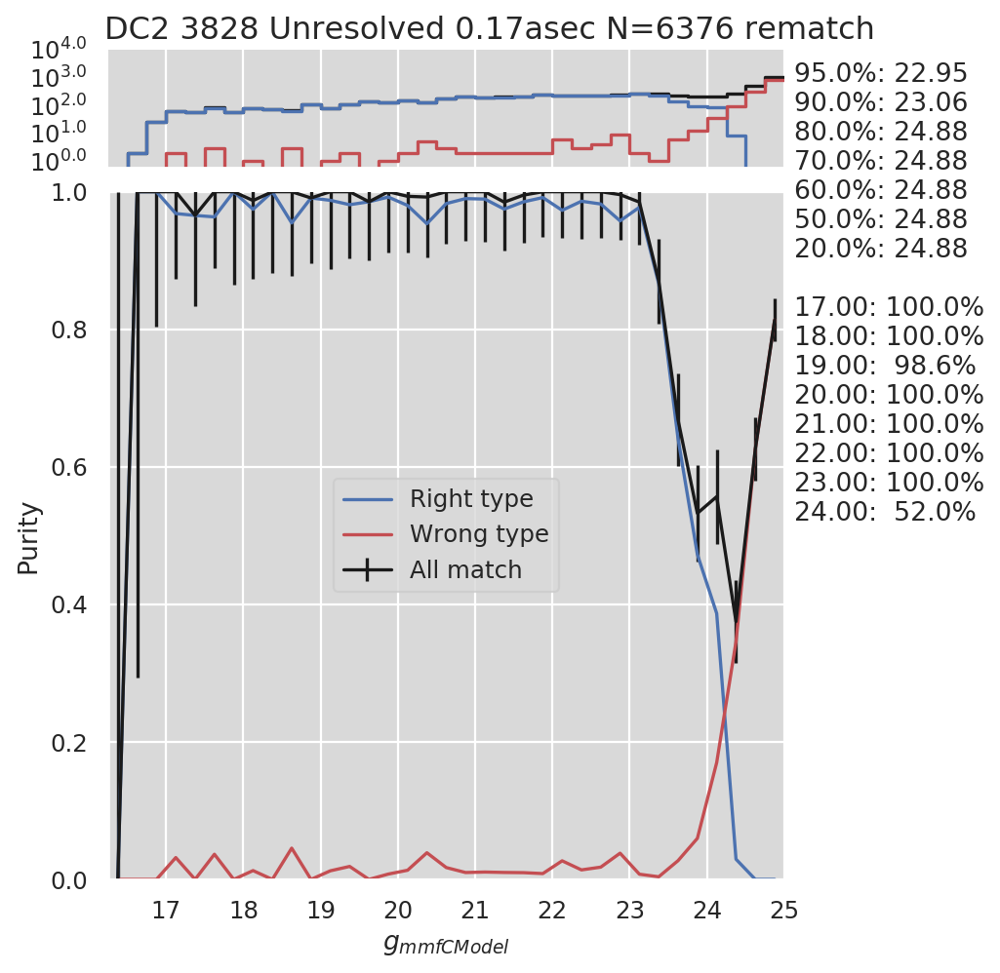

42338 matched and 8995 mag < 25; 7128 both and 43 non-finite; 60489/len(cat)=382426


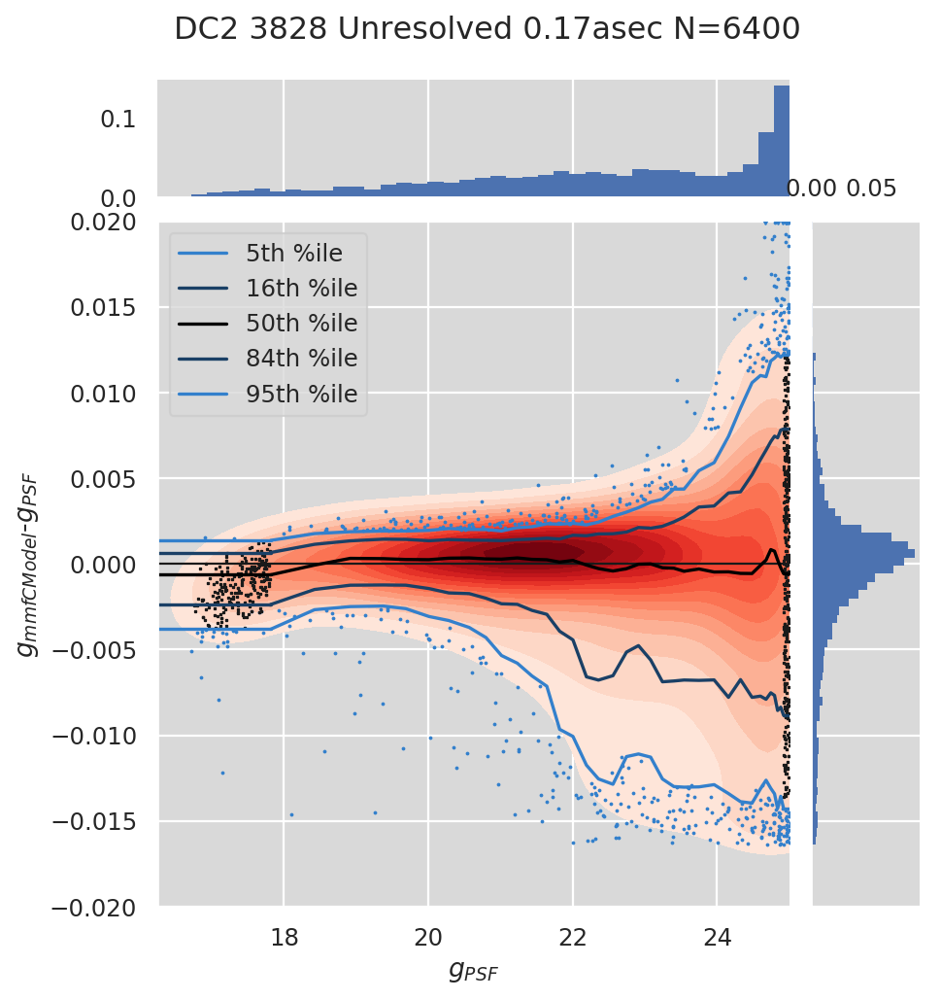

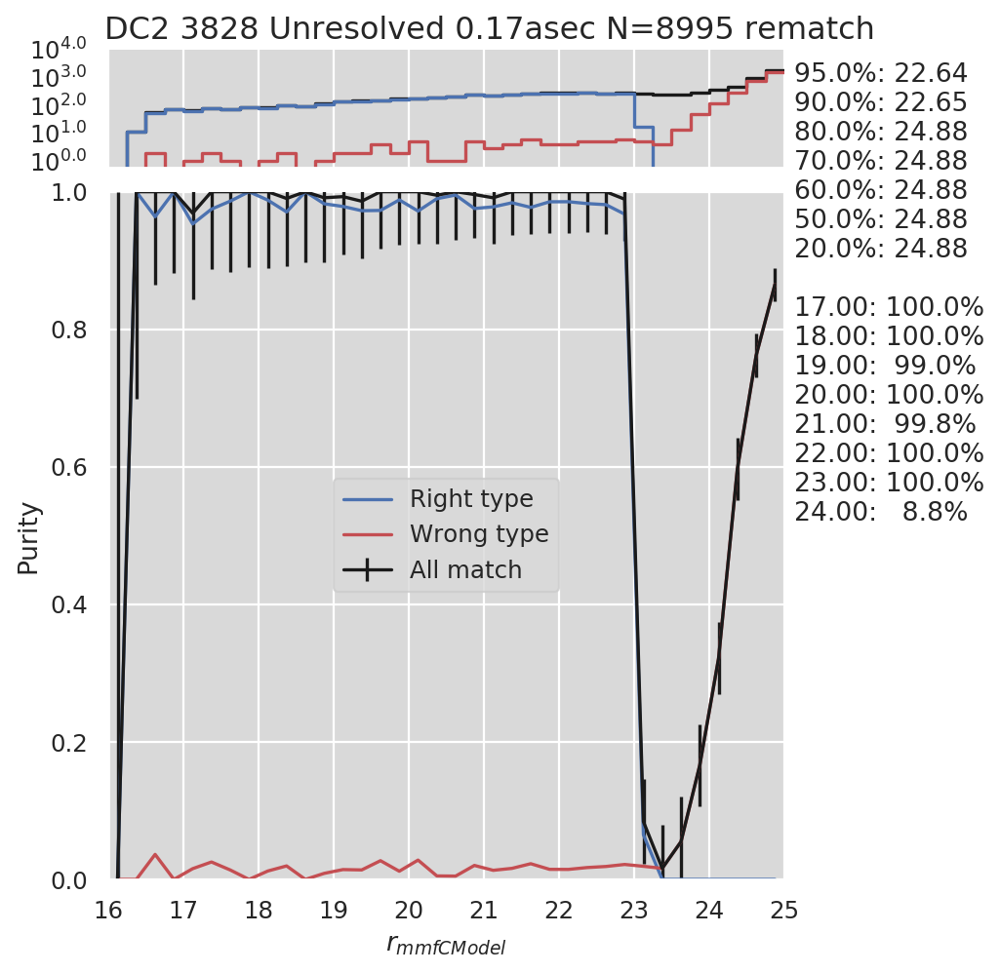

38425 matched and 17194 mag < 25; 13711 both and 38 non-finite; 59941/len(cat)=382426


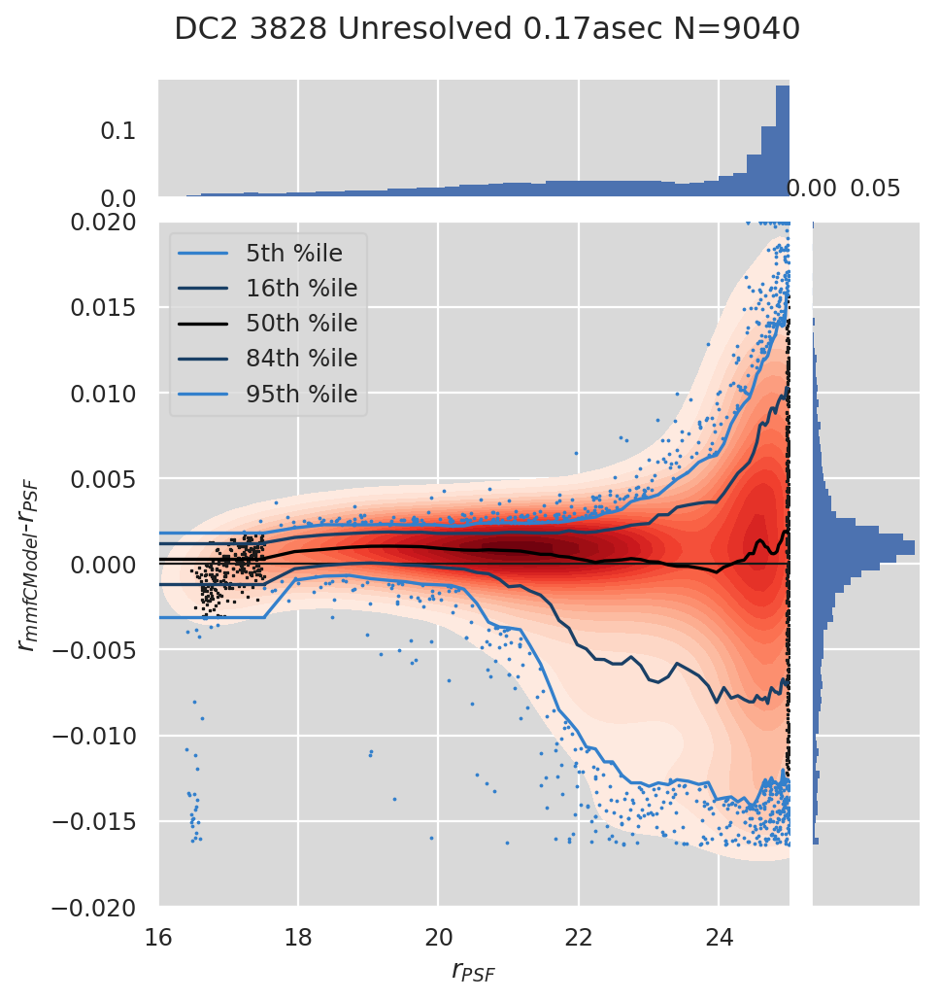

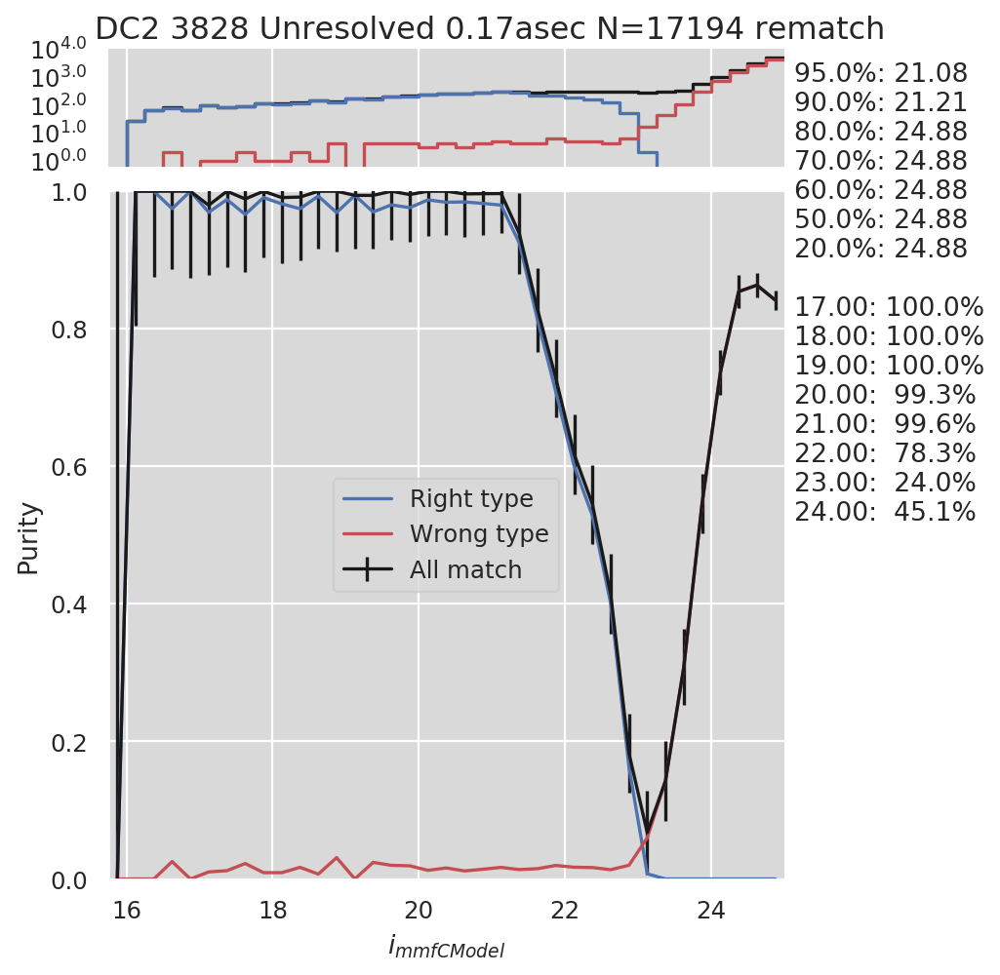

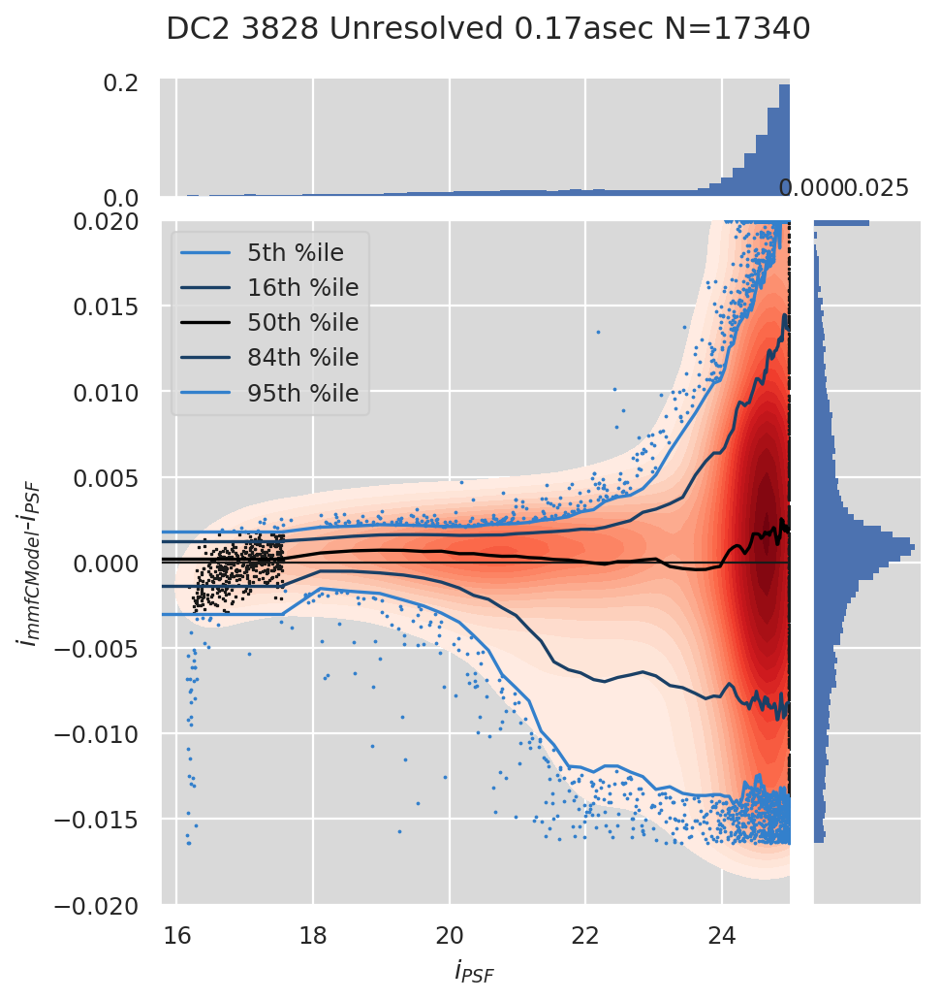

In [11]:
# Stars
plot_matches(
    cats, False, models, filters_single, band_ref=band_ref, band_ref_multi=band_ref,
    band_multi=filters_multi[0], mag_max=25, mag_max_compure=25, limy=lim_y['unresolved'],
    match_dist_asec=0.168, rematch=True, models_purity=models_purity, mag_bin_complete=0.25,
    plot_diffs=False, **args
)

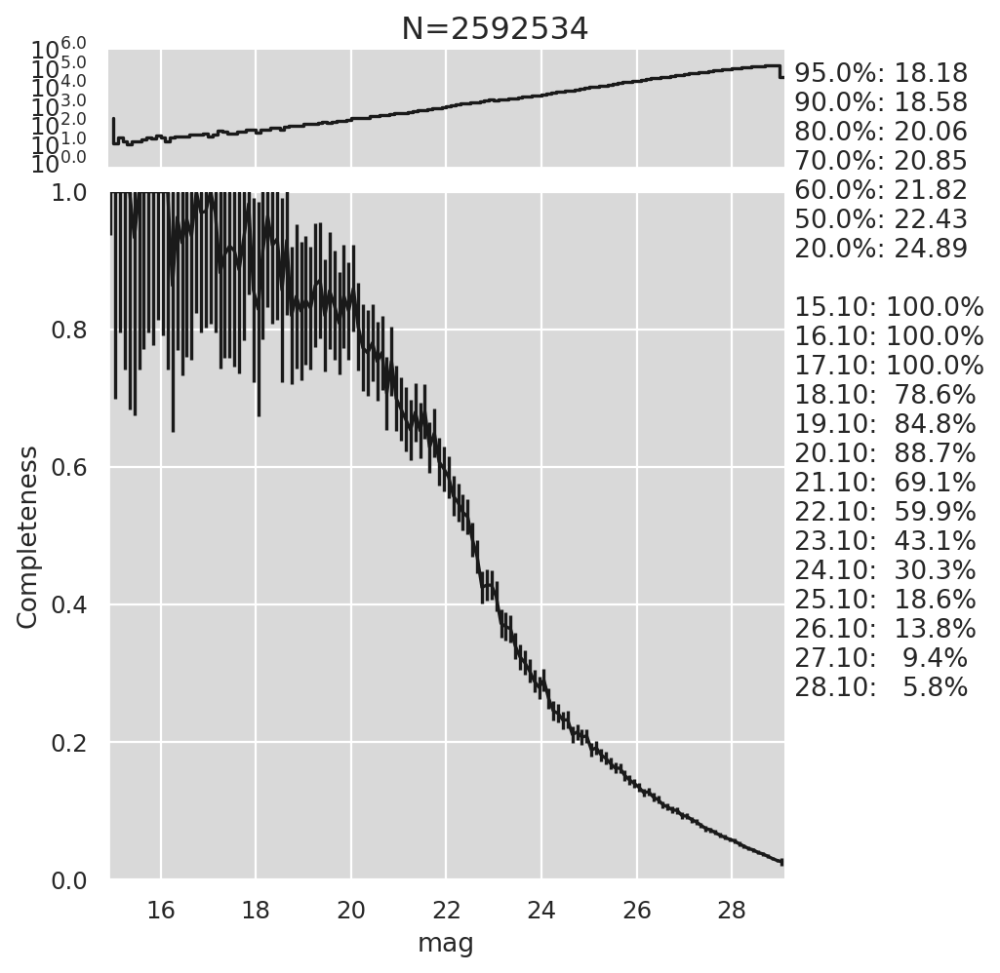

(14.9, 29.1)

In [12]:
# A test plot with a nice, smoothly decreasing completeness function
mags = np.clip(-2.5*np.log10(cats[3828]['truth']['lsst_r_flux']) + 31.4, 15, None)
chance = 1 - 0.5*(1 + np.arcsinh(mags-22.5)/np.arcsinh(7.5))
matched = np.random.uniform(size=len(mags)) < chance
plot_compure(mags, matched)